## Phase 4 Project Submission - Bee Population Timeseries

* Student name: Eva Mizer
* Student pace: Flex
* Scheduled project review date/time: Tuesday, Jan 10th, 10:00am via Zoom
* Instructor name: Morgan Jones
* Blog post URL: https://www.blogger.com/blog/posts/4845670283059937521?pli=1


## Introduction

### Business Case 

#### Stake Holders:
* Scientists, local politicians, and bee conservationists in Ireland looking to monitor the population and increase it as needed.

#### Business Problem/Solution:
 Declining bee populations have been a problem worldwide, but especially in Ireland, where about 1/3 of the bee species face threat of extinction. Declining populations have a real impact on local ecosystems, as well as local and national economies, so monitoring and implementation of bee-friendly practices are needed.

**Solution**:

* Scientists want us to take the older data to get an idea of what we can expect to find for the current population of various species of bees, and make a plan based on those findings to increase bee populations.**

* If the new findings are at a higher count than what we find with our timeseries predictions, steps should be taken to determine what could account for such a positive change, whether it be better counting measures, increase local efforts of the past few years to increase habitate, etc. Once a likely cause is identified, plans can be made to continue or even expand those actions.

* If the new findings are at a lower count than what we find with our timeseries predictions, steps should be taken to determine what the best course of action for increasing specific bee populations. This could include habitat creation, banning of pesticides on local or regional level, etc. 

* Bee prevelence can be sorted by genus, allowing for a more genus-specific action plan. For example, for honeybees, 

#### Performance Goals:

* **My goal is to make a model with the lowest AIC and RSME score possible.** 

* **RSME** will show us our models error rate.

* **AIC** will help us understand how well our model generalized in relation to other models we test.

** If a model we use doesn't have AIC (in the case of Meta Prophet), we will focus on the RSME.

### Overview 


#### The Data
The [data]("https://www.gbif.org/dataset/6eed5110-c7b8-11de-b279-d063ea754e15") we are using today is the dataset on the distribution of bees in Ireland from both published and unpublished sources spanning from 1884 to 2022, initially compiled as part of a Trinity College Dublin/Queen's University Belfast HEA funded research project on the conservation of Irish bees (2003-2006; Úna Fitzpatrick & Tomás Murray). It was used for conservation purposes, including the development of a Red List, which evaluates species on their extinction risk. It is now deposited with the National Biodiversity Data Centre and is managed by Úna Fitzpatrick.

#### Scoring Metric
* RSME and AIC will be used as the scoring metrics for our models.
* We want to get the lowest values possible for each.

##### 1. [Import Libraries and Data](#Import_Libraries)
##### 2. [Clean and Inspect the Data](#Clean)
##### 3. [Exploratory Data Analysis](#Dataprep)
* Choose target features
* Split for Training, Testing, and Validation
* Check for stationarity, heteroscedasticity, etc.
* Modify as needed

##### 4. [Models and refinement](#Modeling) 
* Model report
* Analysis

##### 5. [Final Model Selection](#final)

##### 6. [Business Recommendations](#business)

##### 7. [Going Further](#further)

## 1. Import the Libraries <a id='Import_Libraries'></a>

#### Import the Libraries

In [1]:

#Basic Goodies
import numpy as np 
import pandas as pd
from pandas import DatetimeIndex
from matplotlib import pyplot as plt
from sklearn.utils import resample

from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.tsa.arima.model import ARIMA
import statsmodels.api as sm
from statsmodels.tsa.statespace.sarimax import SARIMAX
from matplotlib.pylab import rcParams

import scipy.stats as stats
from scipy.stats import kurtosis
from scipy.stats import skew

#model selection/classifiers
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, cross_validate, TimeSeriesSplit
from sklearn.metrics import mean_squared_error
import statsmodels.api as sm

#Import scikit-learn metrics module for accuracy calculation
from sklearn import metrics

#For Visuals
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

#Because I hate pink warnings
import warnings
warnings.filterwarnings('ignore')



#### *Functions*

Here we will store some of the custom made functions we will use throughout the notebook. There may be more functions stored later on. 

**For all over use:**

See notations for details on each.

In [2]:
#This will make a line graph to show the instances each genus is spotted. Can be used with multiple genuses, 
#or just one, depending on the dataframe
def bees_per_month(data, x, y, hue, title, xlabel):
  plt.figure(figsize=(20,10))
  sns.color_palette("tab10")
  sns.lineplot(data=data, x=x,y=y,hue=hue)
  plt.title(title)
  plt.xlabel(xlabel)
  plt.legend(loc='best')
  plt.show();
#This will make a line graph to show the instances a genus OR species is spotted
#depending on which you have in your df
def bees_per_week(data, x, y, title, xlabel):
  plt.figure(figsize=(20,10))
  sns.color_palette("tab10")
  sns.lineplot(data=data, x=x,y=y, color='green')
  plt.title(title)
  plt.xlabel(xlabel)
  plt.legend(loc='best')
  plt.show();

#This will show us how many sightings we have of each species via a text list
def totalspeciessightings (df):
  species_list = df['species'].unique()
  species_list.sort()
  for x in species_list:
    countit = df[df.species == x]
    print("There were", sum(countit.Count), "sightings of", x, ".")

#This will show us how many sightings we have of each genus via a text list
def totalgenussightings (df):
  gen_list = df['genus'].unique()
  gen_list.sort()
  for x in gen_list:
    countit = df[df.genus == x]
    print("There were", sum(countit.Count), "sightings of", x, ".")

**For a very specific use:**

Here is a function for later to help make our dataframes for computing.
It will take our sightings data (df), which only has sightings for a few weeks per year, and combine it with a df we will make in this function that has *all* the weeks of the year, dropping any we don't need from the zero df. In the end we will have a full years worth of weekly dates with zeros where there weren't sightings and the weekly sighting number if there were. Fabulous!

In [3]:
def series_to_df(df, species):
  #select all of those species
  df_subset = df.loc[(df['species'] == species)]

  #Make a new dataframe of just the species and date sighted 
  stdf = df_subset[['species','Count', 'date']].copy()
  #create week column
  stdf["index"] = stdf["date"].dt.to_period("W").dt.to_timestamp()
  #make a series
  stdfbyweek = stdf.groupby(["index"]).sum()
  #convert back to df
  stdfbyweek = pd.DataFrame(data=stdfbyweek, index=stdfbyweek.index)
  #make a column copy of the week date
  stdfbyweek['Week'] = stdfbyweek.index

  #Make a df with any missing weeks 
  Count = 0
  begin_date = '2012-12-31'
  df_zero = pd.DataFrame({'Count':Count, 'date':pd.date_range(begin_date, periods=1095)})
  #make a new column to store our datetime info to later put into the actual index
  df_zero["index"] = df_zero["date"].dt.to_period("W").dt.to_timestamp()
  #make a series
  df_zero = df_zero.groupby(["index"]).sum()
  #convert back to df
  df_zero = pd.DataFrame(data=df_zero, index=df_zero.index)
  #make a column copy of the week date
  df_zero['Week'] = df_zero.index

  #Merge the two! 
  tem_df = df_zero.merge(stdfbyweek, how='outer', on=["Week"])
  tem_df = tem_df.sort_values(by = 'Week')
  tem_df = tem_df.reset_index(drop=True)
  tem_df['Count_y'].fillna(0, inplace=True)
  tem_df.rename(columns = {'Count_y':'Count'}, inplace = True)
  tem_df = tem_df.drop(['Count_x'], axis=1)
  tem_df['Count'] = tem_df['Count'].astype(int)
  return tem_df

### Meet the Data
Before we get started, let's take a look at the source material itself. We have a [large dataset](https://www.gbif.org/dataset/6eed5110-c7b8-11de-b279-d063ea754e15) on the distribution of bees in Ireland from both published and unpublished sources spanning from 1884 to 2022, initially compiled as part of a Trinity College Dublin/Queen's University Belfast HEA funded research project on the conservation of Irish bees (2003-2006; Úna Fitzpatrick & Tomás Murray). It was used for conservation purposes, including the development of a [Red List](https://biodiversityireland.ie/publications-category/red-lists/), which evaluates species on their extinction risk. It is now deposited with the National Biodiversity Data Centre and is managed by Úna Fitzpatrick.

There are 50 columns, and 38,672 entries.

For simplicity, we will be looking the years 2013-2015 and tracking bees by their genus on a weekly basis. 



In [4]:
#import the dataset from my Google Drive
from google.colab import drive
drive.mount('/content/drive/', force_remount=True) 
bee = "/content/drive/My Drive/Colab Notebooks/Bees of Ireland/data/bee_survey.csv"
#Load the dataset for and give name
df_orig = pd.read_csv(bee, sep='\t')
df_orig.head()

Mounted at /content/drive/


,gbifID,datasetKey,occurrenceID,kingdom,phylum,class,order,family,genus,species,...,identifiedBy,dateIdentified,license,rightsHolder,recordedBy,typeStatus,establishmentMeans,lastInterpreted,mediaType,issue
0,1571263775,6eed5110-c7b8-11de-b279-d063ea754e15,ie.nbdc.dataset.BeesOfIreland.97208269419908935,Animalia,Arthropoda,Insecta,Hymenoptera,Apidae,Bombus,Bombus rupestris,...,NaN,NaN,CC_BY_4_0,NaN,Sharon Parr,NaN,NaN,2023-01-24T18:22:09.492Z,NaN,COORDINATE_ROUNDED
1,1571243438,6eed5110-c7b8-11de-b279-d063ea754e15,ie.nbdc.dataset.BeesOfIreland.97208269419878695,Animalia,Arthropoda,Insecta,Hymenoptera,Andrenidae,Andrena,Andrena cineraria,...,NaN,NaN,CC_BY_4_0,NaN,"Green, Paul Richard",NaN,NaN,2023-01-24T18:22:08.964Z,NaN,COORDINATE_ROUNDED
2,1571243436,6eed5110-c7b8-11de-b279-d063ea754e15,ie.nbdc.dataset.BeesOfIreland.97208269419878696,Animalia,Arthropoda,Insecta,Hymenoptera,Andrenidae,Andrena,Andrena cineraria,...,NaN,NaN,CC_BY_4_0,NaN,"Green, Paul Richard",NaN,NaN,2023-01-24T18:22:08.964Z,NaN,COORDINATE_ROUNDED
3,1571243430,6eed5110-c7b8-11de-b279-d063ea754e15,ie.nbdc.dataset.BeesOfIreland.97208269419889395,Animalia,Arthropoda,Insecta,Hymenoptera,Apidae,Bombus,Bombus lucorum,...,NaN,NaN,CC_BY_4_0,NaN,John Fogarty,NaN,NaN,2023-01-24T18:22:08.965Z,NaN,COORDINATE_ROUNDED
4,1571243429,6eed5110-c7b8-11de-b279-d063ea754e15,ie.nbdc.dataset.BeesOfIreland.97208269419878700,Animalia,Arthropoda,Insecta,Hymenoptera,Andrenidae,Andrena,Andrena cineraria,...,NaN,NaN,CC_BY_4_0,NaN,"Green, Paul Richard",NaN,NaN,2023-01-24T18:22:08.965Z,NaN,COORDINATE_ROUNDED


Go with me on a little journey just to satisfy my curiosity. Let's find out who all these record keepers are.

In [5]:
df_orig['recordedBy'].value_counts()

A.W. Stelfox         2528
Veronica Santorum    1350
Justin Ivory         1324
Tom Gittings         1054
Una Fitzpatrick      1043
                     ... 
Nuala Canny             1
John Phelan             1
Jason Mc Cann           1
Leslie Reed             1
Eoin Warner             1
Name: recordedBy, Length: 811, dtype: int64

Wow, number one is none other than [Arthur Wilson Stelfox](https://en.wikipedia.org/wiki/Arthur_Wilson_Stelfox) (1883-1972), an Irish naturalist and architect. He was known as an authority on molluscs and Irish plants, and, unsurpsingly, he did a lot of work specializing in Hymenoptera, to which bees belong.

## 2. Clean and Inspect the Data <a id='Clean'></a>


Let's see what we are working with!

In [6]:
#Get a quick overview
df_orig.info()
#Check for duplicates in gbifID
boolean = df_orig.duplicated(subset=['gbifID']).any()
print("Duplicates in gbifID?")
print(boolean, end='\n\n')
#Check for duplicates in occurrenceID
boolean = df_orig.duplicated(subset=['occurrenceID']).any()
print("Duplicates in occurrenceID?")
print(boolean, end='\n\n')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38672 entries, 0 to 38671
Data columns (total 50 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   gbifID                            38672 non-null  int64  
 1   datasetKey                        38672 non-null  object 
 2   occurrenceID                      38672 non-null  object 
 3   kingdom                           38672 non-null  object 
 4   phylum                            38672 non-null  object 
 5   class                             38672 non-null  object 
 6   order                             38672 non-null  object 
 7   family                            38672 non-null  object 
 8   genus                             38672 non-null  object 
 9   species                           38672 non-null  object 
 10  infraspecificEpithet              21 non-null     object 
 11  taxonRank                         38672 non-null  object 
 12  scie

So it looks like there are a lot of columns with null values, but luckily we won't be needing any of those, and there aren't any duplicates in gbifID or occurrenceID, which could indicate that a sighting was put in twice. 

I find it very curious that we are dealing with a lot of float64s and objects instead of int64s and strings. 

Based on what we see and what we need to know, we just want to identify the genus and timeframe, thought we may want to revisit this dataframe to aquire any additional information we may need for analysis or recommendations. 


In [7]:
#Make a new dataframe of just the genus, species, and eventDate sighted 
df_base = df_orig[['eventDate','genus', 'species']].copy()
#convert date to datetime
df_base['eventDate'] = pd.to_datetime(df_base['eventDate'])
# make a new column with the month and year
df_base["year"] = df_base["eventDate"].dt.strftime('%Y')
#set index to said datetime
df_base.set_index('eventDate', inplace=True)
#Add in a column with the single value of "1", which we will use later as needed
df_base['Count'] = '1'
df_base.index = pd.to_datetime(df_base.index)
#Make a temporary series listing the total amount of monthyl spottings of each kind of genus
tempt_series = df_base.groupby(['year','genus'])["Count"].count()
#convert back to a beautiful dataframe
df_base = tempt_series.to_frame().reset_index()
df_base.head()

,year,genus,Count
0,1884,Bombus,2
1,1889,Andrena,1
2,1889,Nomada,1
3,1890,Andrena,2
4,1893,Andrena,3


Let's take a closer look at our annual count per genus. First, let's use describe to see if anything sticks out. 

In [8]:
df_base.describe()

,Count
count,747.000000
mean,51.763052
std,423.823948
min,1.000000
25%,2.000000
50%,4.000000
75%,12.000000
max,6576.000000


Wow, yes! Right off the bat, we see that at some point(s), there were as few as 1 sighting per year for a specific genus, and as much as 6,576 for another! This major difference could be a surge of organized survey efforts (for the higher numbers), but could also from actual low population counts (for the lowest number). Let's dig in a little deeper.

In [9]:
print("Highest:", df_base['Count'].max())
print("Lowest:", df_base['Count'].min())
print(df_base['genus'].value_counts())

Highest: 6576
Lowest: 1
Andrena         104
Bombus          100
Nomada           86
Lasioglossum     85
Colletes         64
Sphecodes        64
Halictus         61
Megachile        55
Hylaeus          55
Osmia            33
Coelioxys        20
Apis             17
Anthidium         2
Xylocopa          1
Name: genus, dtype: int64


Ok, so it looks like we have the most consistently spotted (though this doesn't mean *most* spotted, as this record is by presence in years) bee being the Andrena, or Mining Bee. I would say I am not entirely surprised at that, considering the Andrena genus has striking more species than the second in line, and their short but spread-out seasons allow for spottings over many months. 

I am surprised that Xylocopa (Carpenter Bee) is not included more, considering their habit of wanting to live in man-made structures.

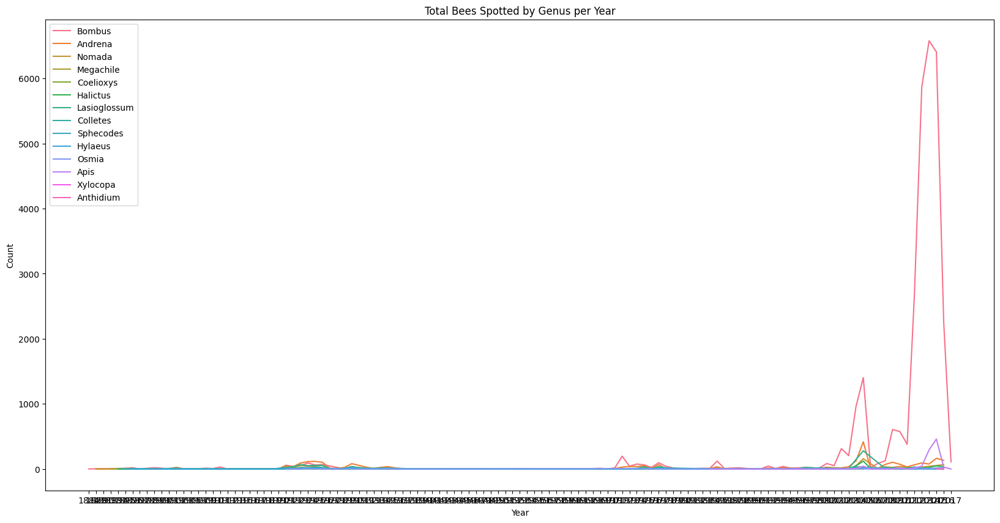

In [10]:
bees_per_month(df_base, df_base['year'], df_base['Count'], 'genus', "Total Bees Spotted by Genus per Year", "Year")

Wow, ok, so it looks like the majority of the sightings logged here happened in the last 17 years. 

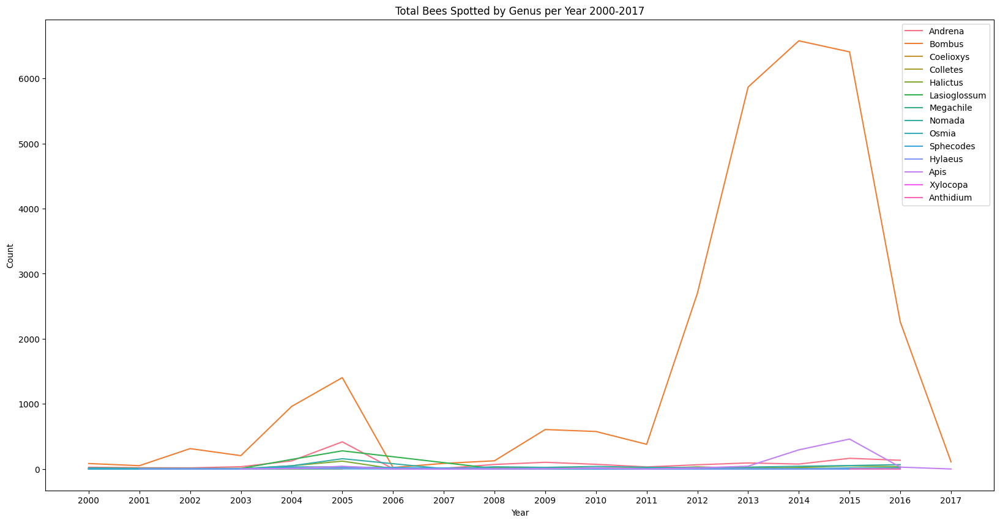

In [11]:
df_base_2000 = df_base.loc[(df_base['year'] >= '2000')]
bees_per_month(df_base_2000, df_base_2000['year'], df_base_2000['Count'], 'genus', "Total Bees Spotted by Genus per Year 2000-2017", "Year")

Since this dataframe is a collection of bee sightings from multiple sources over time, I want to look for the years with the most consistent overall numbers to work with. Having said that, I choose to work with the data in years 2013-2015.

### Making a base dataframe
First we isolate all the info between 2013 and 2015, when the sightings were most consistent overall. Then we will make a subset of that with the eventDate, genus, and species spotted. 

In [12]:
#Cut out all years other than 2013-2015
df_subset = df_orig.loc[(df_orig['year'] >= 2013) & (df_orig['year'] <= 2015)]

#Make a new dataframe of just the genus, species, and eventDate sighted 
df = df_subset[['genus', 'species', 'eventDate']].copy()
#convert date to datetime
df['eventDate'] = pd.to_datetime(df['eventDate'])
#set index to said datetime
df.set_index('eventDate', inplace=True)
# make a new column with the month and year
df["date"] = df.index
#Add in a column with the single value of "1", which we will use later as needed
df['Count'] = 1
#turning genus and species into strings
df['genus'] = df['genus'].astype(str)
df['species'] = df['species'].astype(str)

df.index = pd.to_datetime(df.index)
df.head()

,genus,species,date,Count
eventDate,,,,
2015-04-05,Andrena,Andrena cineraria,2015-04-05,1
2015-04-03,Andrena,Andrena cineraria,2015-04-03,1
2015-04-06,Andrena,Andrena cineraria,2015-04-06,1
2015-05-21,Osmia,Osmia aurulenta,2015-05-21,1
2015-05-24,Sphecodes,Sphecodes ephippius,2015-05-24,1


In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 20300 entries, 2015-04-05 to 2015-10-09
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   genus    20300 non-null  object        
 1   species  20300 non-null  object        
 2   date     20300 non-null  datetime64[ns]
 3   Count    20300 non-null  int64         
dtypes: datetime64[ns](1), int64(1), object(2)
memory usage: 793.0+ KB


### Cleaning and Nan-ing
This dataset is pretty squeaky clean for what we need, however, let's just take a moment to check for the dreaded Nans. 

In [14]:
#checking for null values
print("There are", df['genus'].isna().sum(), 'null values.')

There are 0 null values.


Awesome! We're in the clear! Let's dive in!

## Exploring the Data Further

### Genus Exploration
Let's take a look at just how many genuses we are working with in this dataset. 

In [15]:
#how many genuses are we working with?
print("There are", len(pd.unique(df['genus'])), 'genus types.')
#how many species are we working with?
print("For future reference, there are also", len(pd.unique(df['species'])), 'species.')

There are 12 genus types.
For future reference, there are also 61 species.


Wow, so many! Let's check them out.

In [16]:
df['genus'].unique()

array(['Andrena', 'Osmia', 'Sphecodes', 'Nomada', 'Lasioglossum',
       'Bombus', 'Colletes', 'Halictus', 'Megachile', 'Apis', 'Anthidium',
       'Hylaeus'], dtype=object)

**What a mix! Let's explore for a moment!**


*   **Bombus** - The fuzzy bumblebee. These often nest in the ground of old animal burrows and sometimes in cavities found above ground. Ireland has 21 species of the humble bumble, 6 of which are cuckoo bumblebees, saddling their young with true bumblebees to raise. 

*  **Apis** - The delightful honey bee! While Ireland has it's own native honeybee, the dark European honeybee Apis mellifera mellifera, diseases in the early 1900's led to a decline in the native captive populations, leading to the import of non-native honeybees from other parts of Europe. Today there are efforts underway by the [Galtee Bee Breeding Group](https://bibba.com/galtee-bee-breeding-group-2/) to help educate the public, improve the native strains, and help with conservation. These bees live in hives and, as their name implies, produce honey. In the wild, they will commonly nest in hollow cavities such as trees and abandoned spaces.

*   **Halictus** - More commonly known as sweat bees. Solitary bees that don't have hives or colonies. 

*   **Andrena** - The solitary mining bees. Ireland has 29 species of this genus. These bees are very prolific pollinators, but don't live in colonies and don't produce honey. They prefer sandy soils, dugging little tunnels to lay their eggs in. Typically these species are only active for a few weeks out of the year. Many are host-plant specialists, and have specialized morphological and behavioral adaptations.

*   **Nomada** - Known as cuckoo bees, they are parasitic bees that will often lay their eggs on other bee hosts nests. They are typically considered poor pollinators. 

*   **Lasioglossum** - I like to refer to this genus as the 'wildcard group'. It is full of bees that vary greatly in their appearance and actions. For example, some are cleptoparasites, some are nocturnal, and some are oligolectic. While Ireland has 5 species that are either vulnerable or near threatened, the vast majority of these bees are listed under least concern in the [Regional Red List of Irish Bees](chrome-extension://efaidnbmnnnibpcajpcglclefindmkaj/https://researchrepository.ucd.ie/server/api/core/bitstreams/1a3254f3-6b32-483d-b455-b81713d78f39/content)

*  **Colletes** - Plasterer or Polyester Bees. Solitary bees that sometimes build near each other in aggregations. They are known to plaster the walls of their underground cells with a cellophane-like plastic secretion. Very cool. 

*  **Osmia** - Another one of my favorites, the mason bee! These solitary bees will use mud or other "masonry" products in constructing their nests. These are popluar with people wanting low maintanence pet bees and do well with bee houses made of tubes and hollowed out sticks. In nature they will look for naturally occurring gaps such as between cracks in stones or other small dark cavities. They will lay their eggs in little mud-capped cavities they have stuffed with pollen for their offspring. Prolific pollinators. 

*  **Megachile** - The delightful and tiny solitary leafcutter bees. They will often stuff their nests with little cut up peices of leaves and flowers. Also popular with non-honey bee keepers. 

*  **Hylaeus** - Yellow-faced bees or masked bees. Solitary and will nest in available dead twigs or plant stems, or other similarly small natural cavities.

*  **Sphecodes** - These bees are generally black and red and known as Blood bees. These are kleptoparasitic on other bees (meaning they steal their goods), especially bees in the genera Lasioglossum, Halictus and Andrena. Because of their theiving, they are not known to be great pollinators. However, because these bees rely on other bees, it would be understable that if the other bees population increases or decline, so would theirs. 

*  **Anthidium** - These are known as carder or potter bees, that use various natural ingrediants like conifer resin, leif cuttings, plant fibers, mud, or a mix to build nests. They are mostly solitary and make nests in the ground, walls or trees. Curiously, these bees don't show up on the Regional Red List of Irish Bees.










#### Days Worth of Sightings per Genus

In [17]:
#Make a temporary series listing the total amount of days spottings of each kind of genus occured
tempt_series = df.groupby(['date','genus'])["Count"].count()
#convert back to a beautiful dataframe
df_bee = tempt_series.to_frame().reset_index()
df_bee.head()

,date,genus,Count
0,2013-01-05,Bombus,1
1,2013-01-10,Bombus,1
2,2013-02-04,Apis,1
3,2013-02-17,Bombus,1
4,2013-02-18,Bombus,1


Great, now let's get a quick visual on how the genus distribution looks overall. Remember, this is not overall number of sightings, just how many days there were sightings over our three year period. This can offer some insight on how long the seasons of each genus can be. 

In [18]:
df_bee['genus'].value_counts()

Bombus          769
Apis            296
Andrena         129
Nomada           68
Halictus         56
Osmia            23
Colletes         22
Megachile        15
Lasioglossum     12
Hylaeus           5
Anthidium         3
Sphecodes         2
Name: genus, dtype: int64

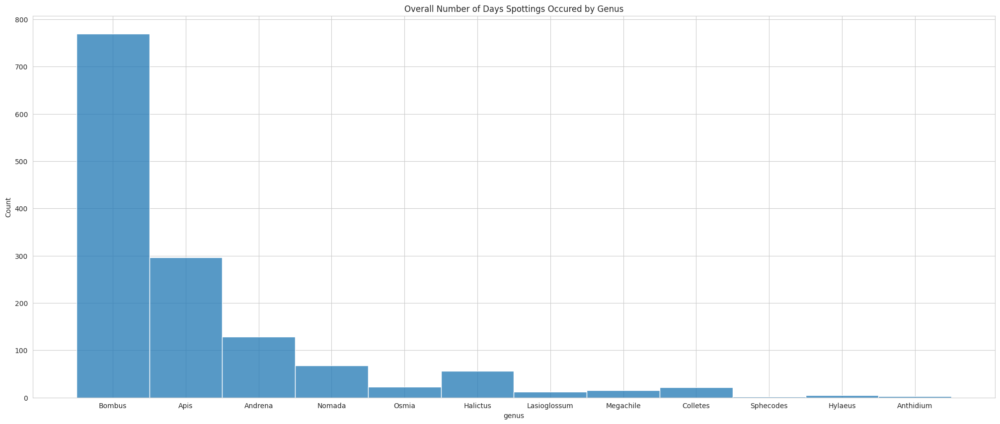

In [19]:
sns.set_style("whitegrid")
plt.figure(figsize=(25,10))
plt.title('Overall Number of Days Spottings Occured by Genus')
sns.histplot(df_bee['genus']);

#### **Taking this into account...**

Based on this, I would be tempted to want to focus on bumblebees, honey bees, and mining bees, since they have the most data available, and their needs are varied but distinct. 

Between the groups, there are 7 species that are endangered or critically endangered, 15 that at vulnerable or near threatened, and 2 are regionally extinct. It should be noted that for these three groups, 8 do not have enough data to assign a ranking, and 2 were not evaluated for the Red List.

I won't be looking into sweat bees (Halictus) for now, since their genus has two species with one listed as Least Concern, and the other only Near Threatened. 

Since Nomada (cuckoo bees) and Sphecodes (blood bees) rely on other bees (Lasioglossum, Halictus and Andrena), I won't be including them in this model since their dependent relationship with their host bee species will mean that if their host bees population change, it is predicable that their population would face a similar change. In addition, these genuses have a very low count, and likely won't give a very accurate model.

### Exploratory Visuals

#### Total Genus Overview

Let's take a look at how many sightings of each genus compare to each other over time. 


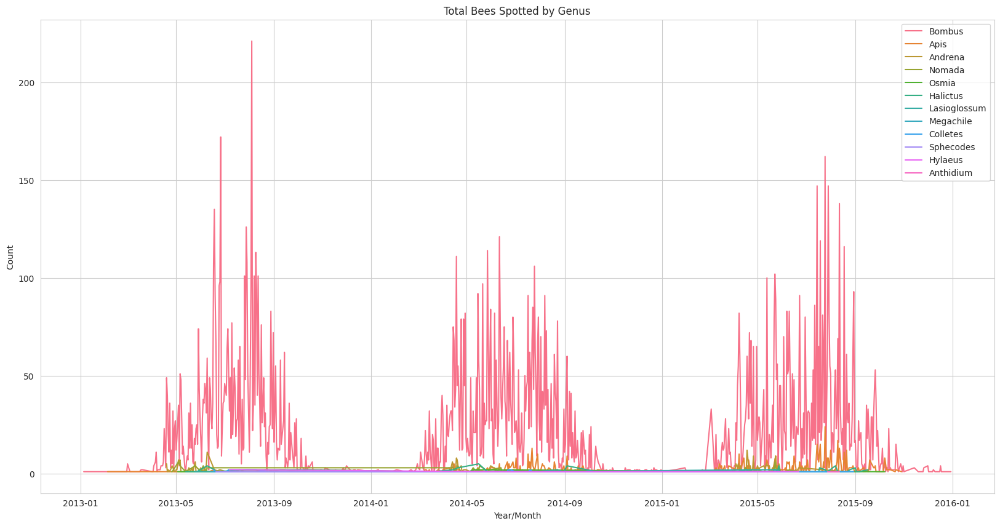

In [20]:
bees_per_month(df_bee, df_bee['date'], df_bee['Count'], 'genus', "Total Bees Spotted by Genus", "Year/Month")

It's pretty apparant that the bumblebees are in a league of their own and have a very distinct cycle. Let's separate them from the rest of the bees. 

### Bombus - The Humble Bumble

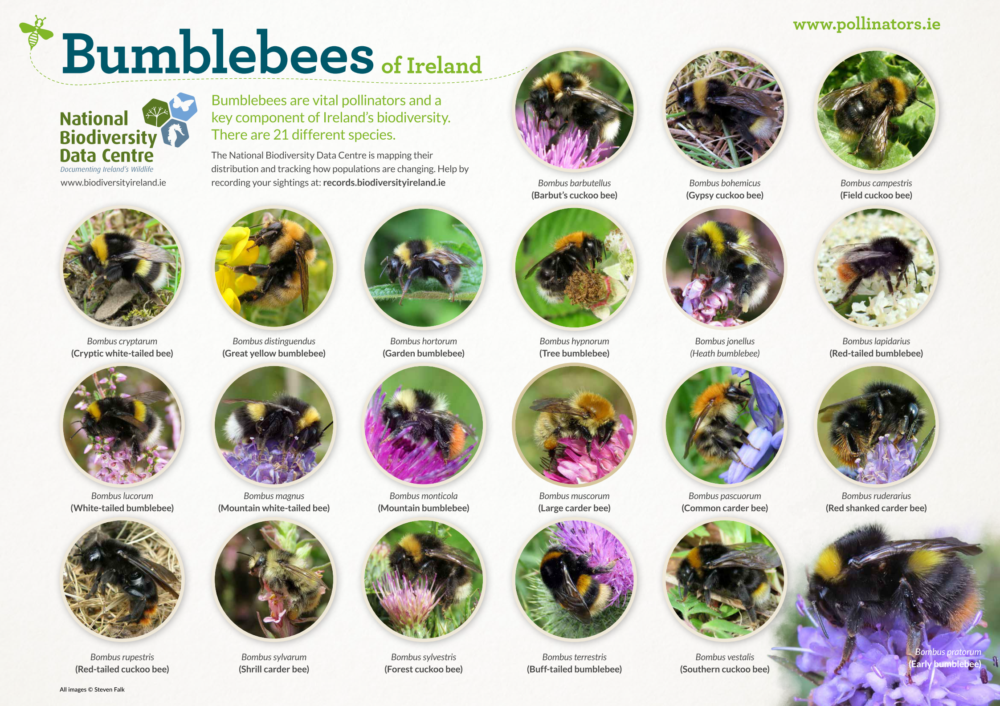

With 21 varieties of bumblebees, Ireland has an excellent variety of the fluffy fliers

#### Total Bumble Bee Sightings

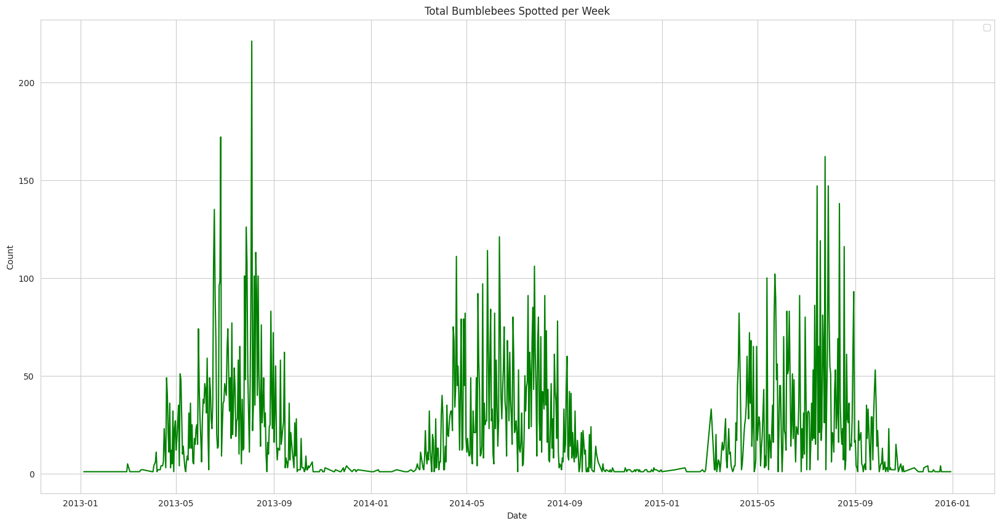

In [21]:
#name the value we want - Bombus
bombus = ['Bombus']
#Make a new df of just the bombus figures
df_bum = df_bee[df_bee['genus'].isin(bombus)]

bees_per_week(df_bum, df_bum['date'], df_bum['Count'], "Total Bumblebees Spotted per Week", "Date")

I'd really like to take a moment to check out this genus specifically. Of the 21 species of bumblebees in Ireland, [4 are endangered and 5 are either near threatened or vulnerable](chrome-extension://efaidnbmnnnibpcajpcglclefindmkaj/https://researchrepository.ucd.ie/server/api/core/bitstreams/1a3254f3-6b32-483d-b455-b81713d78f39/content).  

#### Bumblebee by Species

First we will look at how many of the bumblebee species are present in this dataset by making a bumblebee specific dataframe, then checking it out through some visuals and take it from there. 

In [22]:
#Select only the bumbles
df_subset = df.loc[(df['genus'] == 'Bombus')]

#Make a new dataframe of just the genus and date sighted 
bumble_main = df_subset[['genus', 'species','Count', 'date']].copy()
#Add a Week timestamp
bumble_main["Week"] = bumble_main["date"].dt.to_period("W").dt.to_timestamp()
bumble_main

,genus,species,Count,date,Week
eventDate,,,,,
2015-05-07,Bombus,Bombus terrestris,1,2015-05-07,2015-05-04
2015-03-18,Bombus,Bombus terrestris,1,2015-03-18,2015-03-16
2015-02-24,Bombus,Bombus terrestris,1,2015-02-24,2015-02-23
2014-04-01,Bombus,Bombus terrestris,1,2014-04-01,2014-03-31
2014-04-05,Bombus,Bombus terrestris,1,2014-04-05,2014-03-31
...,...,...,...,...,...
2013-06-24,Bombus,Bombus lapidarius,1,2013-06-24,2013-06-24
2013-08-09,Bombus,Bombus lucorum,1,2013-08-09,2013-08-05
2013-08-14,Bombus,Bombus pascuorum,1,2013-08-14,2013-08-12


In [23]:
bumble_main['species'].value_counts()

Bombus lucorum          5427
Bombus pascuorum        5103
Bombus lapidarius       2217
Bombus pratorum         1774
Bombus terrestris       1640
Bombus hortorum         1087
Bombus jonellus          571
Bombus muscorum          563
Bombus sylvestris         81
Bombus sylvarum           80
Bombus bohemicus          76
Bombus monticola          58
Bombus distinguendus      47
Bombus ruderarius         41
Bombus rupestris          32
Bombus campestris         27
Bombus barbutellus        12
Bombus magnus              9
Bombus vestalis            2
Bombus cryptarum           1
Name: species, dtype: int64

Now, this is 20 of 21 varieties of bumblebees of Ireland, but we want to focus on the bumblebees that are of concern. According to the Red List, the following species are of Least Concern and can be axed from this list:


1.   Bombus (P.) sylvestris
2.   Bombus hortorum
3. Bombus jonellus
4. Bombus lucorum
5. Bombus monticola
6. Bombus pascuorum
7. Bombus pratorum
8. Bombus terrestris

In addition, we will also be taking of the following since they are either not on the Red List at all, or listed as "Data Deficient" or "Not Evaluated" on the Red List:



1.   Bombus (P.) vestalis
2.   Bombus cryptarum
3. Bombus magnus
4. Bombus sylvestris

Lastly, we will exclude any cuckoo bumblebee, since their populations will rely on the "true" bumblebees population and will likely follow suit if the "true" bumblebees population fluctuates. These are:



1. Bombus barbutellus
2. Bombus bohemicus
3. Bombus campestris
4. Bombus rupestris







In [24]:
#name the value we want to axe for Bombus
LC_Bombus = ['Bombus (P.) sylvestris',
'Bombus hortorum', 'Bombus jonellus',
'Bombus lucorum',
'Bombus monticola',
'Bombus pascuorum',
'Bombus pratorum',
'Bombus terrestris',
'Bombus vestalis',
'Bombus cryptarum',
'Bombus magnus',
'Bombus sylvestris',
'Bombus barbutellus',
'Bombus bohemicus',
'Bombus campestris',
'Bombus rupestris']
#Make a new df of just the bombus figures
threatened_bums_df = bumble_main[bumble_main.species.isin(LC_Bombus) == False]

In [25]:
totalspeciessightings(threatened_bums_df)

There were 47 sightings of Bombus distinguendus .
There were 2217 sightings of Bombus lapidarius .
There were 563 sightings of Bombus muscorum .
There were 41 sightings of Bombus ruderarius .
There were 80 sightings of Bombus sylvarum .


Based on the available data, I want to focus on Lapidarius or Muscorum. Let's look a little closer.

##### Battle of the Bumbles

##### Bombus Muscorum - Large Carder Bee

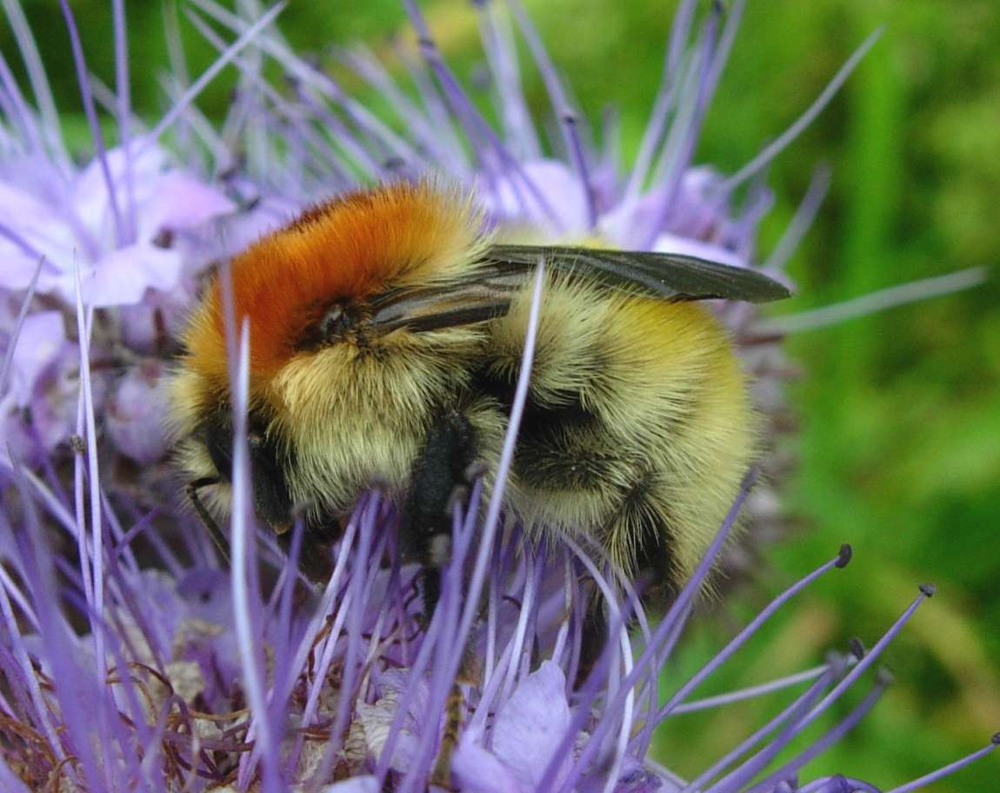

Photo credit: Nick Withers

Also known as The Moss Carder bee, this bee is very rare in most locations due to it's localized behaviors, but windespread in the species total range. 

Dependent on native grassland plants, it loves flower-rich dunes, machair or grasslands, and can be found in flower-rich bogs and heaths and urban locations where there are large meadows in urban parks. 

Their nests are naturally small, and they don't travel far from said nests, making them more vulnerable to decline.

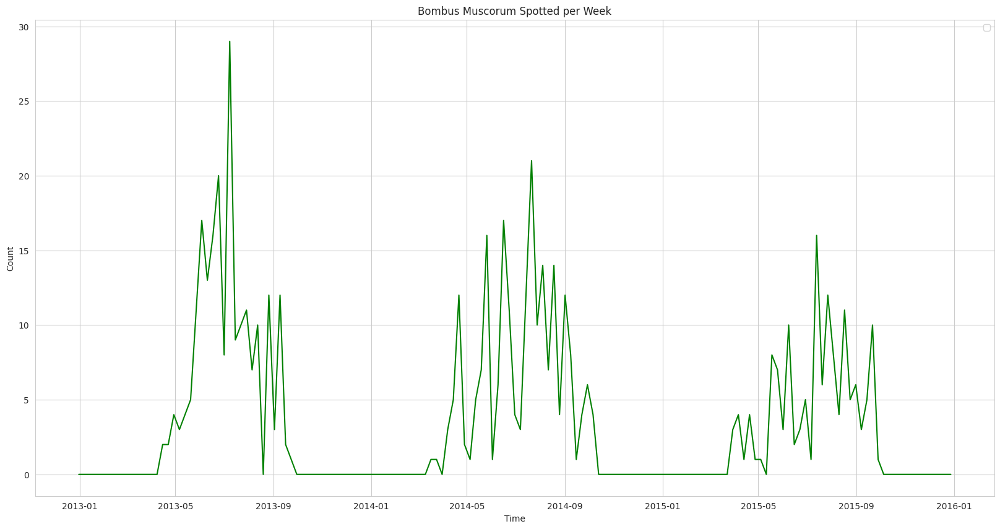

In [26]:
#Make a new df of just the bombus muscorum
mus_vis = series_to_df(df, 'Bombus muscorum')
bees_per_week(mus_vis, mus_vis['Week'], mus_vis['Count'], "Bombus Muscorum Spotted per Week", "Time")

In [27]:
mus_vis.describe() 

,Count
count,157.000000
mean,3.585987
std,5.366139
min,0.000000
25%,0.000000
50%,0.000000
75%,5.000000
max,29.000000


While it is unsurprising that the lowest sightings would be 0, I find it very interesting that for one week, there was a total of 29 sightings.

##### Bombus Lapidarius - Red-Tailed Bumblebee

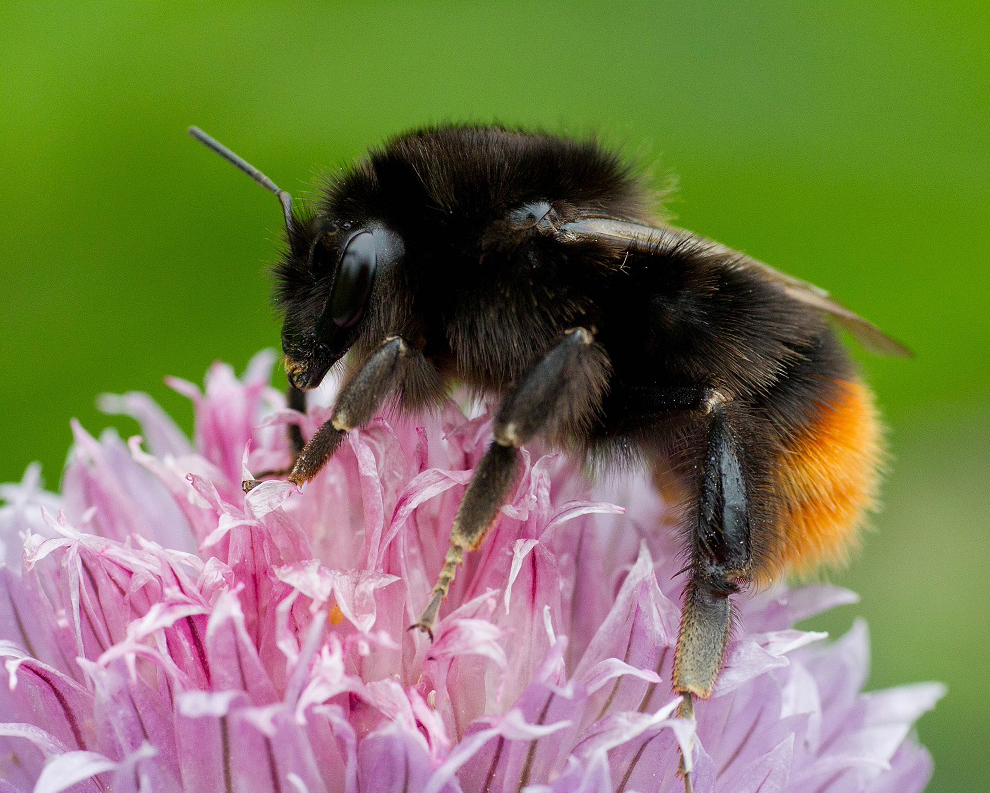

Queen Red-tailed bumblebee (Bombus lapidarius) Photo credit: Tessa Bramall.

Unlike the Large Carder Bee, the [Red-Tailed Bumblebee](https://en.wikipedia.org/wiki/Bombus_lapidarius) is known as an intermediate distance forrager, with the average foraging distance being 500m (or about .3 miles) to about 1,500m (about .9 miles), though some studies suggest they could go further. These bees live in colonies with a queen, worker bees, and male bees. They are known to display "patch fidelty", meaning a bee is, for lack of better words, a creature of habit and will be likely to return to a specific location. 

It plays host to the Red-tailed cuckoo bumblebee (Bombus rupestris). 

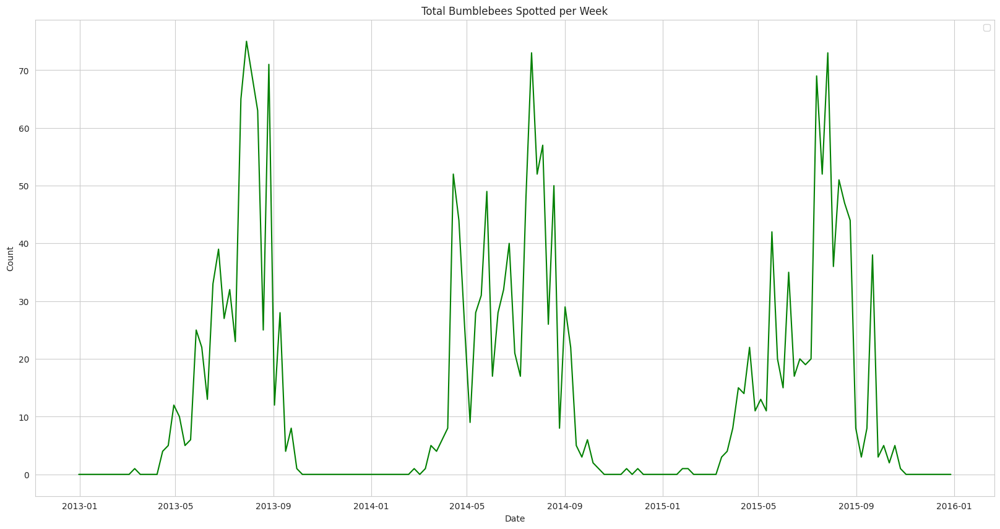

In [28]:
#make df for Bombus Lapidarius
lapidarius = series_to_df(df, 'Bombus lapidarius')
bees_per_week(lapidarius, lapidarius['Week'], lapidarius['Count'], "Total Bumblebees Spotted per Week", "Date")

In [29]:
lapidarius.describe() 

,Count
count,157.000000
mean,14.121019
std,19.896962
min,0.000000
25%,0.000000
50%,4.000000
75%,22.000000
max,75.000000


Unsurpsingly, this species is a bit more prolific, so the max is considerably higher than with out other Bumble.

After comparing the two, I have decided to target the Bombus Muscorum (Large Carder Bee), since it's range and small nest size make it especially vulnerable. 

### Apis - The Honey Bee

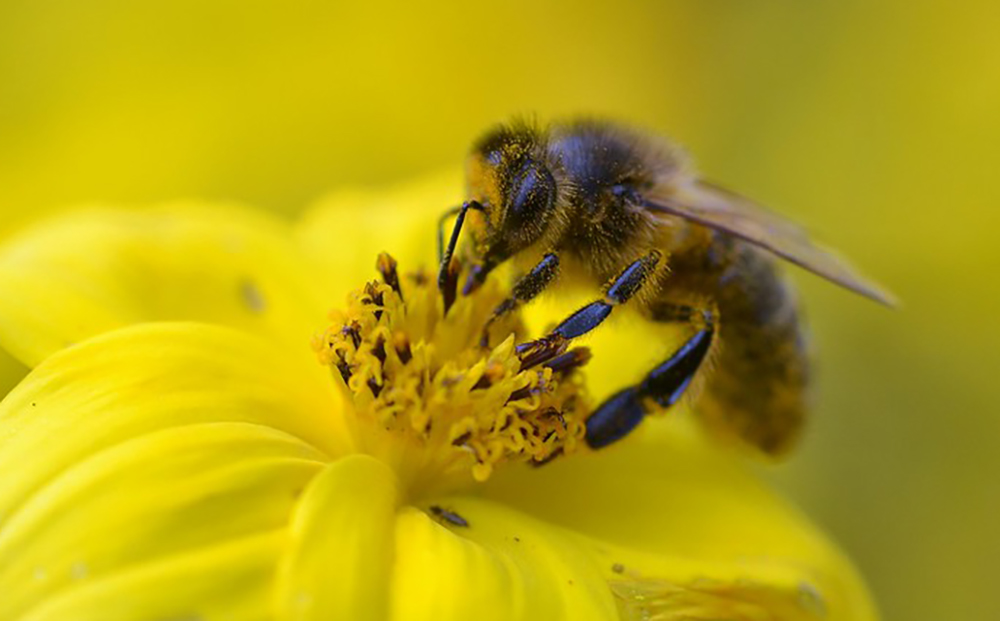
Photo from [The Native Irish Honey Bee Society](https://nihbs.org/)

Now let's try again with the honey bee. Since Ireland only has one species of honey bee, this will be a rather simple setup.

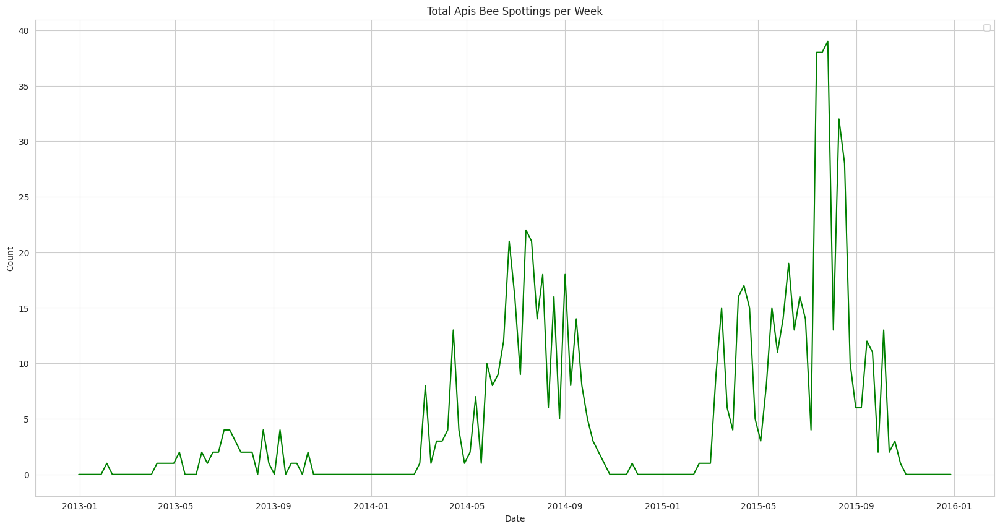

In [30]:
#Make a new df of just the apis figures
df_apis = series_to_df(df, 'Apis mellifera')
bees_per_week(df_apis, df_apis['Week'], df_apis['Count'], "Total Apis Bee Spottings per Week", "Date")

We can see here that Apis (commpnly known as the honey bee), is making a steady increase, and presenta a pretty predictable periodic pattern. Like the bumblebee, it seems the honey bee is first seen around February or March, and wrapping up around October or November. There is only one species of honey bee, so we don't need to break this down further. 

### andrena - The Mighty Mining Bee


Now let's check out the andrena genus.

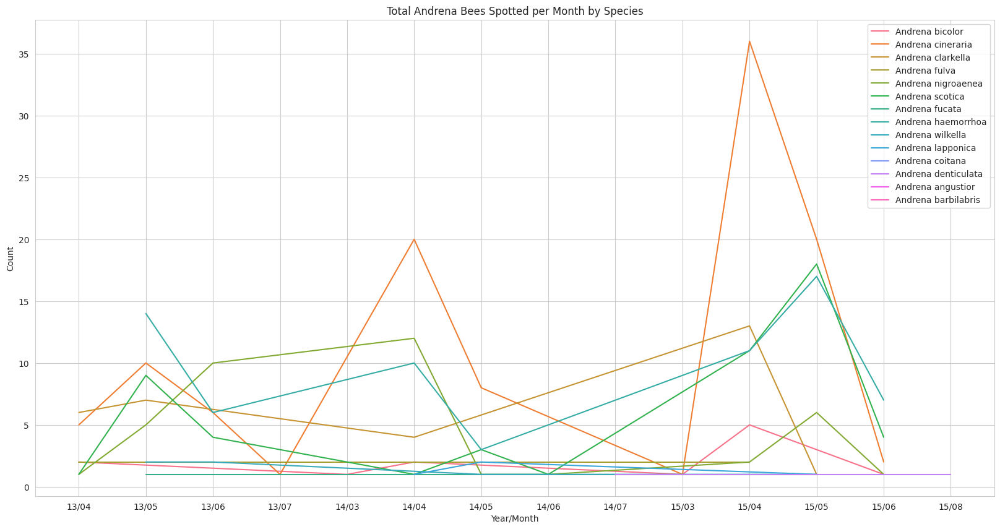

There were 1 sightings of Andrena angustior .
There were 1 sightings of Andrena barbilabris .
There were 12 sightings of Andrena bicolor .
There were 109 sightings of Andrena cineraria .
There were 31 sightings of Andrena clarkella .
There were 2 sightings of Andrena coitana .
There were 2 sightings of Andrena denticulata .
There were 3 sightings of Andrena fucata .
There were 6 sightings of Andrena fulva .
There were 68 sightings of Andrena haemorrhoa .
There were 4 sightings of Andrena lapponica .
There were 39 sightings of Andrena nigroaenea .
There were 52 sightings of Andrena scotica .
There were 6 sightings of Andrena wilkella .


In [31]:
#Cut out all years other than 2013-2015
df_subset = df_orig.loc[(df_orig['year'] >= 2013) & (df_orig['year'] <= 2015)]

#Make a new dataframe of just the genus and date sighted 
andrena = df_subset[['genus', 'eventDate', 'species']].copy()
#convert date to datetime
andrena['eventDate'] = pd.to_datetime(andrena['eventDate'])
#set index to said datetime
andrena.set_index('eventDate', inplace=False)
#andrena.head()
# The bottom 8
andrena_bee = ['Andrena' ]
#Make a new df of just the bummy_bee figures
df_andrena = andrena[andrena['genus'].isin(andrena_bee)]


#________________________________________________________________________________________
# make a new column with the month and year
df_andrena["date"] = df_andrena["eventDate"].dt.strftime('%y/%m')
df_andrena["month"] = df_andrena["eventDate"].dt.strftime('%m')

#Add in a column with the single value of "1"
df_andrena['Count'] = '1'

tempt_series1 = df_andrena.groupby(["month", 'species'])["Count"].count()
#convert back to a beautiful dataframe
df_andrena_month = tempt_series1.to_frame().reset_index()


#Make a temporary series listing the total amount of each kind of genus spotted per month
tempt_series = df_andrena.groupby(["date", 'species'])["Count"].count()
#convert back to a beautiful dataframe
df_andrena = tempt_series.to_frame().reset_index()
df_andrena.head()

#________________________________________________________________________________________



bees_per_month(df_andrena, df_andrena['date'], df_andrena['Count'], 'species', "Total Andrena Bees Spotted per Month by Species", "Year/Month")
totalspeciessightings(df_andrena)

At first blush, such few sightings may seem a bit dismal and overall unhelpful, but it's important to remember that since these are solitary bees, their active period is much shorter than other, more social, bees. Many solitary bees are only active for a few weeks or a few months.

Let's take a quick look at the month ranges for each species.

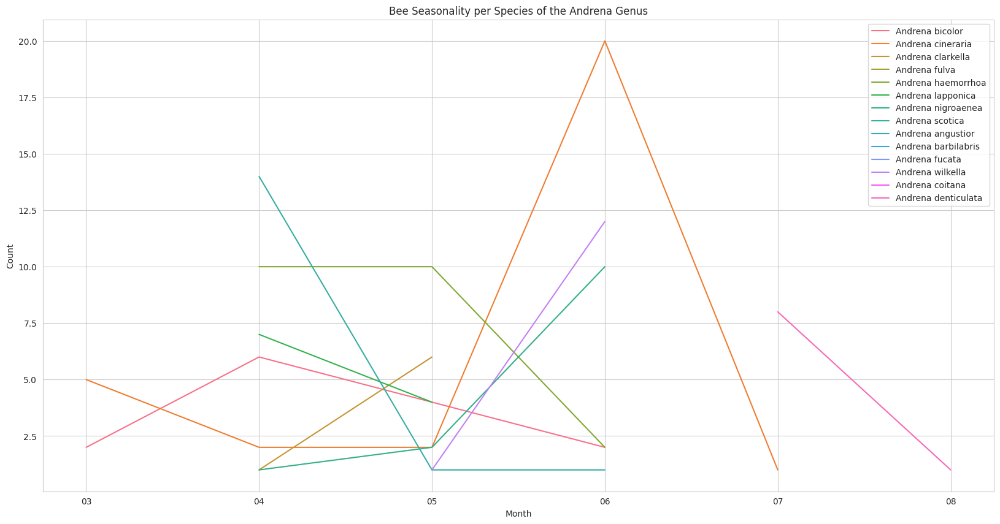

In [32]:
bees_per_month(df_andrena_month, df_andrena_month['month'], df_andrena['Count'], 'species', "Bee Seasonality per Species of the Andrena Genus", "Month")


We can see here that there are some spikes around May for genus Nomada, first showing up around April, then dipping in June. However, the others don't seem to have as a pronounced periodic pattern. Since all but the Nomada have only single digit sightings, it's not surprising that a more distinct pattern doesn't emerge.

We are going to choose [**Andrena haemorrhoa**](https://www.bwars.com/bee/andrenidae/andrena-haemorrhoa).

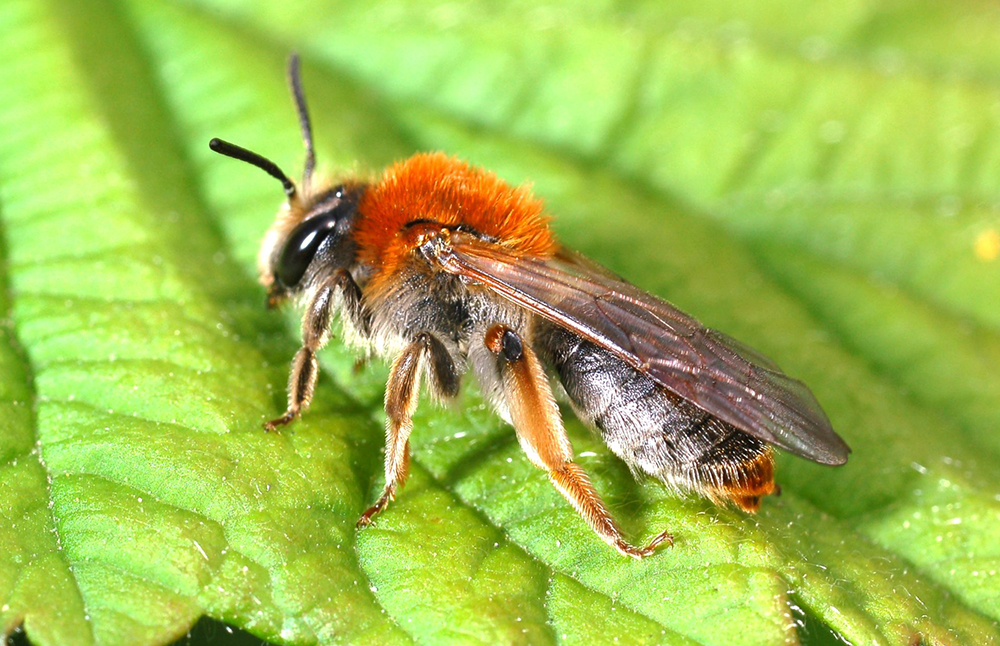


 Known as the Orange-tailed Mining Bee, this little bee is active from March to June, has small nests in shallow grassy areas, loves Hawthorn flowers, and is a host to the cleptoparasitic Nomada ruficornis (Linnaeus).

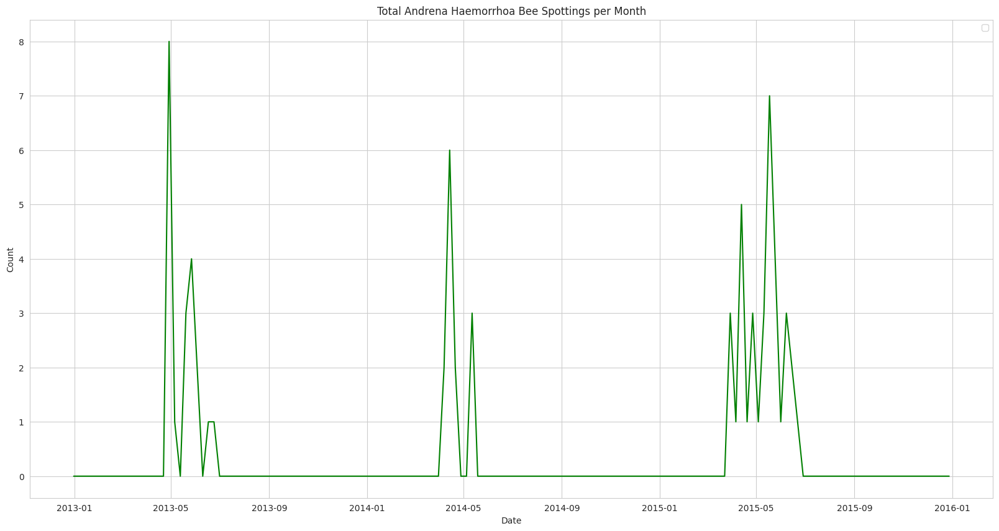

In [33]:
#Make a new df of just the andrena figures
andrena_haemorrhoa = series_to_df(df, 'Andrena haemorrhoa')
bees_per_week(andrena_haemorrhoa, andrena_haemorrhoa['Week'], andrena_haemorrhoa['Count'], "Total Andrena Haemorrhoa Bee Spottings per Month", "Date")

### Checking for Stationarity, Skewness and Kurtosis

Because of the nature of this dataframe, we can conclude that all three subdatasets lack normality. However, we will test for **stationarity**, or that the statistical properties of the process do not change over time. To find this, we will run a Dicky-Fuller test to get a p-value that will let us either reject or fail to reject the null hyposisthis. In this case, the null hypothesis is the series in question is *NOT* stationary.

And just for informational purposes, we will also test for kurtosis and skewness.

**Kurtosis**: A measure of the tailedness (how often outliers occur) of a distribution. Low kurtosis ( < 3, thin tails) are platykurtic, medium kurtosis (3, medium tails) are mesokurtic, and high kurtosis ( > 3, fat tails) are leptokurtic.

**Skewness** : A measure of the asymmetry of a distribution. A negative value for skewness indicates that the tail is on the left side of the distribution, while a positive value for skewness indicates that the tail is on the right side of the distribution. If it is higher that 1 or less than -1, it is considerded highly skewed, while -1 to -.5 and .5 to 1 would be considered moderate and between -.5 and .5 would be approximately symmetric.

#### Bombus Muscorum - Large Carder Bee


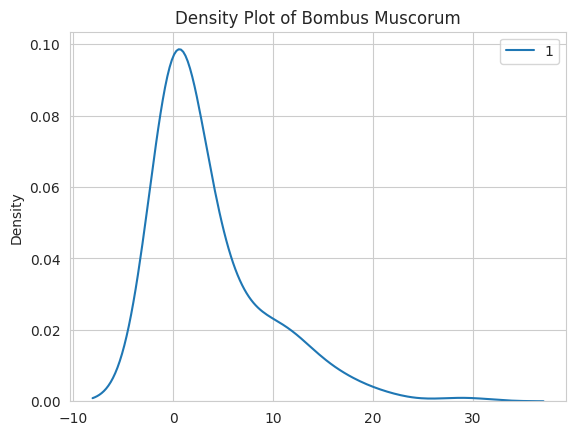

In [34]:
#plot density plot
bombus_mus = series_to_df(df, 'Bombus muscorum')
sns.kdeplot(np.array(bombus_mus), bw=0.5)
plt.title('Density Plot of Bombus Muscorum')
plt.show()

In [35]:
bombus_mus.describe()

,Count
count,157.000000
mean,3.585987
std,5.366139
min,0.000000
25%,0.000000
50%,0.000000
75%,5.000000
max,29.000000


Our distribution looks a pretty pointy which can be expected considering the nature of our dataset. There is definitely a right-sided, positive skew in our data as our lowest amount doesn't sit at 0, clocking in around -8. Let's do some math and see where it stands.

In [36]:
kur = kurtosis(bombus_mus['Count'], fisher=True)
sk=skew(bombus_mus['Count'])
print(f"The value for kurtosis for this sample is: {kur}.\nThe value of skewness for this sample is:{sk}.")

The value for kurtosis for this sample is: 3.351662979751791.
The value of skewness for this sample is:1.7971108870157468.


In [37]:
dftest = adfuller(bombus_mus['Count'])

dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
for key,value in dftest[4].items():
      dfoutput['Critical Value (%s)'%key] = value
print (dfoutput)

Test Statistic                  -2.735571
p-value                          0.068083
#Lags Used                       5.000000
Number of Observations Used    151.000000
Critical Value (1%)             -3.474416
Critical Value (5%)             -2.880878
Critical Value (10%)            -2.577081
dtype: float64


##### **Stationarity**
With a p-value of .06, we can say that we fail reject the null hypothesis, and therefore say that our sample is **NOT** stationary.
##### **Kurtosis**
With a Kurtosis value of 3.35, we have a leptokurtic example distribution with fat tails.
##### **Skewness**
The value of 1.79 for skew indicates that our distribution is highly skewed.

#### Apis mellifera mellifera - European Dark Bee


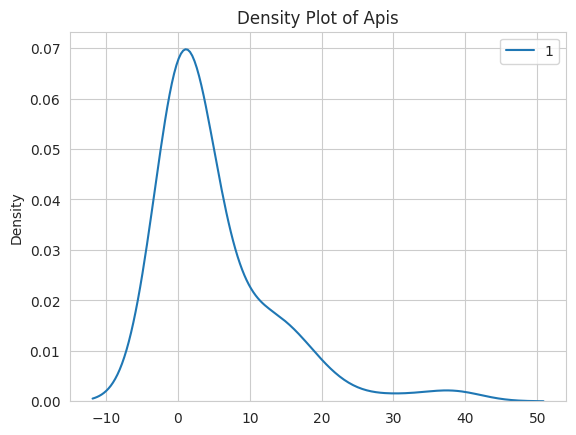

In [38]:
# Plot a density plot
sns.kdeplot(np.array(df_apis), bw=0.5)
plt.title('Density Plot of Apis')
plt.show()

Our distribution looks pointy. There is definitely a right-sided, positive skew in our data as our lowest amount doesn't sit anywhere near 0, landing around -11 or -12. Let's do some math and see where it stands.

In [39]:
k2, p = stats.normaltest(df_apis['Count'])
kur = kurtosis(df_apis['Count'], fisher=True)
sk=skew(df_apis['Count'])
print(f"The value for kurtosis for this sample is: {kur}.\nThe value of skewness for this sample is: {sk}.")

The value for kurtosis for this sample is: 5.171992130056335.
The value of skewness for this sample is: 2.174998631145632.


In [40]:
dftest = adfuller(df_apis['Count'])

dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
for key,value in dftest[4].items():
      dfoutput['Critical Value (%s)'%key] = value
print (dfoutput)

Test Statistic                  -2.918040
p-value                          0.043290
#Lags Used                      10.000000
Number of Observations Used    146.000000
Critical Value (1%)             -3.475953
Critical Value (5%)             -2.881548
Critical Value (10%)            -2.577439
dtype: float64


##### **Stationarity**
With a p-value of .04, we can say that we reject the null hypothesis and say that our sample is stationary.
##### **Kurtosis**
With a Kurtosis value of 5.17, we have a  leptokurtic example distribution with fat tails.
##### **Skewness**
The value of 2.17 for skew indicates that our distribution is *highly* skewed.

#### Andrena haemorrhoa - Orange-tailed Mining Bee


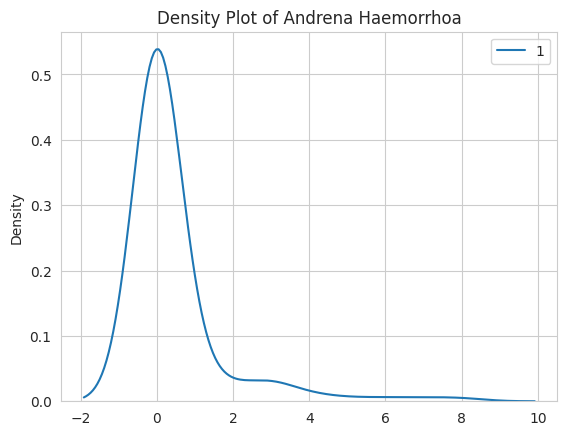

In [41]:
# Plot a density plot
sns.kdeplot(np.array(andrena_haemorrhoa), bw=0.5)
plt.title('Density Plot of Andrena Haemorrhoa')
plt.show()

Our distribution looks so very, very pointy. There is definitely a right-sided, positive skew in our data as our lowest amount is hitting around -2.

In [42]:
kur = kurtosis(andrena_haemorrhoa['Count'], fisher=True)
sk=skew(andrena_haemorrhoa['Count'])
print(f"The value for kurtosis for this sample is: {kur}.\nThe value of skewness for this sample is: {sk}.")

The value for kurtosis for this sample is: 14.31824656603915.
The value of skewness for this sample is: 3.6483348937585665.


In [43]:
from statsmodels.tsa.stattools import adfuller
dftest = adfuller(andrena_haemorrhoa['Count'])

dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
for key,value in dftest[4].items():
      dfoutput['Critical Value (%s)'%key] = value
print (dfoutput)

Test Statistic                  -3.141697
p-value                          0.023617
#Lags Used                       3.000000
Number of Observations Used    153.000000
Critical Value (1%)             -3.473830
Critical Value (5%)             -2.880623
Critical Value (10%)            -2.576945
dtype: float64


##### **Stationarity**
With a p-value of 0.02, we can say that we reject the null hypothesis, and say that our sample **is stationary**.
##### **Kurtosis**
With a Kurtosis value of 14, we have a  leptokurtic example distribution with fat tails.
##### **Skewness**
The value of 3.6 for skew indicates that our distribution is *highly* skewed.

####**In Conclusion:**
All of but one of our three datasets show stationarity, high kurtosis, and high skew. Interestingly, though not surprisingly, each set has a lower p-value, higher kurtosis value, and higher skewness than the previous. This is likely due to the shorter time periods and/or less frequency of bee sightings per species selected, which Bombus Muscorum being the most sighted, Apis mellifera mellifera being the second, and Andrena haemorrhoa being the third and therefore least sighted with such a short seaon. 

## 3. Exploratory Data Analysis<a id='Dataprep'></a>

### Bombus Muscorum - Large Carder Bee

#### Test/Train Split

In [44]:
#make new df of muscorum info
muscorum = series_to_df(df, 'Bombus muscorum')
#set index to date
muscorum = muscorum.set_index('Week')
#Make a series of the mus data:
mus = muscorum.squeeze()
mus.head()

Week
2012-12-31    0
2013-01-07    0
2013-01-14    0
2013-01-21    0
2013-01-28    0
Name: Count, dtype: int64

In [45]:
# Definig the 80% cutoff for the split train - test
mus_80 = round(mus.shape[0]*0.8)

#making the train
train = mus[:(mus_80+1)] # to avoid gaps in the series, we add a +1
test=mus[mus_80:]
#Make a copy *just in case* we want an untouched set for later
train_bom_orig = train.copy()
test_bom_orig = test.copy()

In [46]:
train


Week
2012-12-31    0
2013-01-07    0
2013-01-14    0
2013-01-21    0
2013-01-28    0
             ..
2015-05-04    1
2015-05-11    0
2015-05-18    8
2015-05-25    7
2015-06-01    3
Name: Count, Length: 127, dtype: int64

Now that we have made the trai and test, let's see it!

In [47]:
test

Week
2015-06-01     3
2015-06-08    10
2015-06-15     2
2015-06-22     3
2015-06-29     5
2015-07-06     1
2015-07-13    16
2015-07-20     6
2015-07-27    12
2015-08-03     8
2015-08-10     4
2015-08-17    11
2015-08-24     5
2015-08-31     6
2015-09-07     3
2015-09-14     5
2015-09-21    10
2015-09-28     1
2015-10-05     0
2015-10-12     0
2015-10-19     0
2015-10-26     0
2015-11-02     0
2015-11-09     0
2015-11-16     0
2015-11-23     0
2015-11-30     0
2015-12-07     0
2015-12-14     0
2015-12-21     0
2015-12-28     0
Name: Count, dtype: int64

Text(0.5, 0, 'Date Spotted')

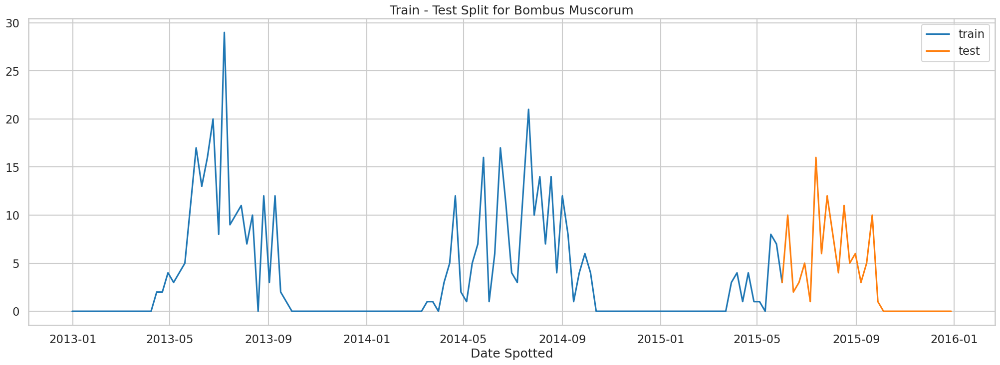

In [48]:
sns.set_context("talk")
fig, ax = plt.subplots(figsize=(25, 8))
ax.plot(train, label='train')
ax.plot(test, label='test')
ax.set_title('Train - Test Split for Bombus Muscorum');
plt.legend()
plt.xlabel("Date Spotted")

So cool! Now let's go ahead and make a validation set as an added layer of cross validation.

#### Validation Set
Instead of taking only one validation set as part of the test set, we chose to use the TimeSeriesSpit() function to create splits of train and validation, that can be used for a cross validation.

We can see from the indeces below that the default number of splits is 5, and that the validation set always comes right after the train set, but the train set is increasing in size with every split.
The size of the validation set remains the same.
We will use this later to do cross validation on our models

In [49]:
split = TimeSeriesSplit()

for train_ind, val_ind in split.split(train):
    print(train_ind, val_ind)

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21] [22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42] [43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63] [64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71
 72 73 74 75 76 77 78 79 80 81 82 83 84] [ 85  86  87  88  89  90  91  92  93  94  95  96  97  98  99 100 101 102
 103 104 105]
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  

Now that we have our test, train, and validation set, we will explore the data to see how best build a model for it.

#### Stationarity
Stationality refers to a flat looking series, without trend, constant variance over time, a constant autocorrelation structure over time and no periodic fluctuations. We can find this by running the Dickey-Fuller test. 

In [50]:
dftest = adfuller(train)

dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
for key,value in dftest[4].items():
      dfoutput['Critical Value (%s)'%key] = value
print (dfoutput)

Test Statistic                  -2.478406
p-value                          0.120817
#Lags Used                       5.000000
Number of Observations Used    121.000000
Critical Value (1%)             -3.485585
Critical Value (5%)             -2.885739
Critical Value (10%)            -2.579676
dtype: float64


The Null Hypothesis is that the series **is not** stationary, and with the p-value > 0.05, we fail to reject the null hypothesis and the series can be considered not stationary.

####Testing for Heteroscedasticity
Before we move on, we need to test for heteroscedasticity using the Breusch-Pagan test. With this test, we have a null hypothesis that homoscedasticity is present (the residuals are distributed with equal variance) and and alternative hypothesis that heteroscedasticity is present (the residuals are not distributed with equal variance). Like other tests, we will use .05 as the significance level.

In [51]:
#First, we’ll fit a multiple linear regression model:

import statsmodels.formula.api as smf

#fit regression model
fit = smf.ols('Count ~ Week', data=mus_vis).fit()

#view model summary
print(fit.summary())

                            OLS Regression Results                            
Dep. Variable:                  Count   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 05 Apr 2023   Prob (F-statistic):                nan
Time:                        18:03:43   Log-Likelihood:                 4724.0
No. Observations:                 157   AIC:                            -9134.
Df Residuals:                       0   BIC:                            -8654.
Df Model:                         156                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

In [52]:
#Perform a Breusch-Pagan test.

from statsmodels.compat import lzip
import statsmodels.stats.api as sms

#perform Bresuch-Pagan test
names = ['Lagrange multiplier statistic', 'p-value',
        'f-value', 'f p-value']
test_bp = sms.het_breuschpagan(fit.resid, fit.model.exog)

lzip(names, test_bp)


[('Lagrange multiplier statistic', 157.0),
 ('p-value', 0.46246426563583504),
 ('f-value', nan),
 ('f p-value', nan)]

With a p-value of >.05, we fail to reject the null that we have homoscedasticity, and confirm that our data is homoscedastic. 

Ok, so we don't have stationarity but we are homoscedastic. Let's tackle the stationarity issue with subtracting the rolling mean.

#### Subtracting Rolling Mean
Next we are going to try to make the series stationary by subtracting the rolling mean, which tells us of the dependence of the series values on the previous values in the past.

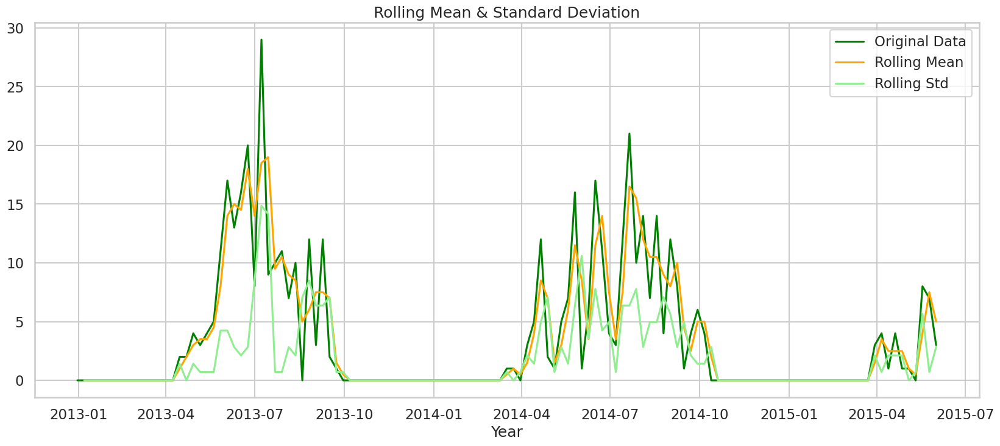

In [53]:
#Calculate rolling mean and std
roll_mean = train.rolling(window=2, center=False).mean()
roll_std = train.rolling(window=2, center=False).std()

#Visualize it!
fig = plt.figure(figsize=(20,8))
plt.plot(train, color='green', label='Original Data')
plt.plot(roll_mean, color='orange', label='Rolling Mean')
plt.plot(roll_std, color='lightgreen', label = 'Rolling Std')
plt.legend(loc='best')
plt.title('Rolling Mean & Standard Deviation')
plt.xlabel("Year");

While there wasn't a lot of noise in this data, however, we can see the rolling mean has helped get rid of some of the noise that was present.

We can confirm this by subtracting the rolling mean from the series and we can check if the residulas are stationary, again with the Dickey Fuller test: 

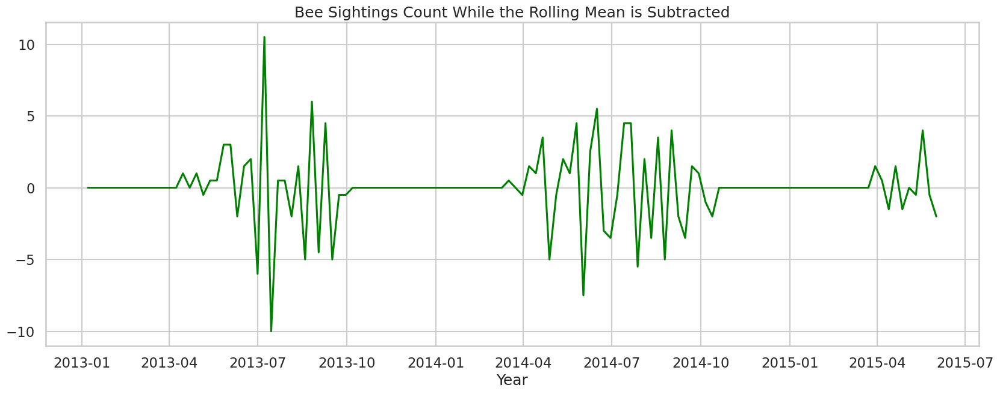

In [54]:
roll_mean_nat = train.rolling(window=2, center=False).mean()
# Subtract the moving average from the original data
data_mrm_nat = train - roll_mean_nat
# Drop the missing values from time series calculated above
data_mrm_nat.dropna(inplace=True)
# Plot sales with rolling mean subtracted
fig = plt.figure(figsize=(20,7))
plt.plot(data_mrm_nat, color='green')#,label='Count - rolling mean')
plt.title('Bee Sightings Count While the Rolling Mean is Subtracted')
plt.xlabel("Year")
plt.show();

In [55]:
dftest = adfuller(data_mrm_nat)
#results
dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
for key,value in dftest[4].items():
      dfoutput['Critical Value (%s)'%key] = value
print (dfoutput)

Test Statistic                  -4.897711
p-value                          0.000035
#Lags Used                       4.000000
Number of Observations Used    121.000000
Critical Value (1%)             -3.485585
Critical Value (5%)             -2.885739
Critical Value (10%)            -2.579676
dtype: float64


The Null Hypothesis is that the series is not stationary, and with the p-value < 0.05, we reject the null hypothesis and the series can be considered stationary.

#### Series Decompostion

For informational purposes, we can break it down further via seasonal_decompose( ), breaking up the time series into trend, seasonality and residuals and take a look!


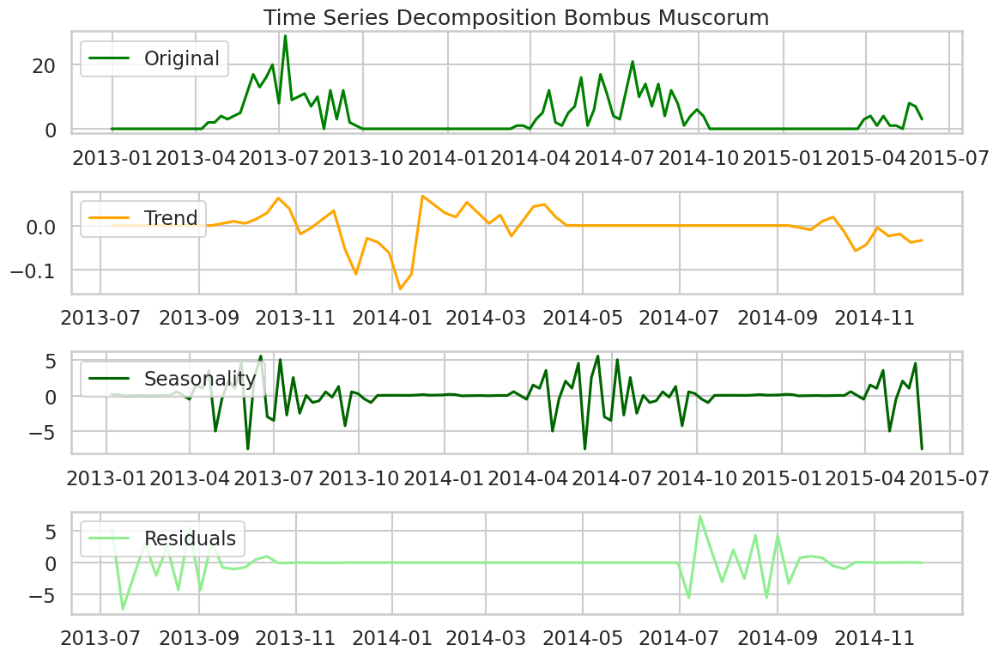

In [56]:
decomposition = seasonal_decompose(data_mrm_nat)

# Gather the trend, seasonality, and residuals 
trend = decomposition.trend
seasonal = decomposition.seasonal
residual = decomposition.resid

# Plot gathered statistics
plt.figure(figsize=(12,8))
plt.subplot(411)
plt.title('Time Series Decomposition Bombus Muscorum')
plt.plot(train, label='Original', color='green')
plt.legend(loc='upper left')
plt.subplot(412)
plt.plot(trend, label='Trend', color='orange')
plt.legend(loc='upper left')
plt.subplot(413)
plt.plot(seasonal,label='Seasonality', color='darkgreen')
plt.legend(loc='upper left')
plt.subplot(414)
plt.plot(residual, label='Residuals', color='lightgreen')
plt.legend(loc='upper left')

plt.tight_layout();


So with this, we can see that the trend is relatively flat, there is definite seasonality appearing with a lag every year around April, and residuals look relatively inconsistent, though we will need to run another test to confirm.

In [57]:
#drop nans
residual.dropna(inplace=True)
#define
dftest = adfuller(residual)
#results
dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
for key,value in dftest[4].items():
      dfoutput['Critical Value (%s)'%key] = value
print (dfoutput)

Test Statistic                -5.988186e+00
p-value                        1.771438e-07
#Lags Used                     5.000000e+00
Number of Observations Used    6.800000e+01
Critical Value (1%)           -3.530399e+00
Critical Value (5%)           -2.905087e+00
Critical Value (10%)          -2.590001e+00
dtype: float64


Great! It appears our residuals are lower than .05, so we can reject the null, and say it's stationary!

In [58]:
#Now that we've made sure we are stationary, let's reassign our train
train = data_mrm_nat

####Testing for Autocorrelation
Autocorrelation is calculated between the variable and itself at previous time steps. Visualizing it can help show patterns in the data and help us decide what kind of model we will try out!

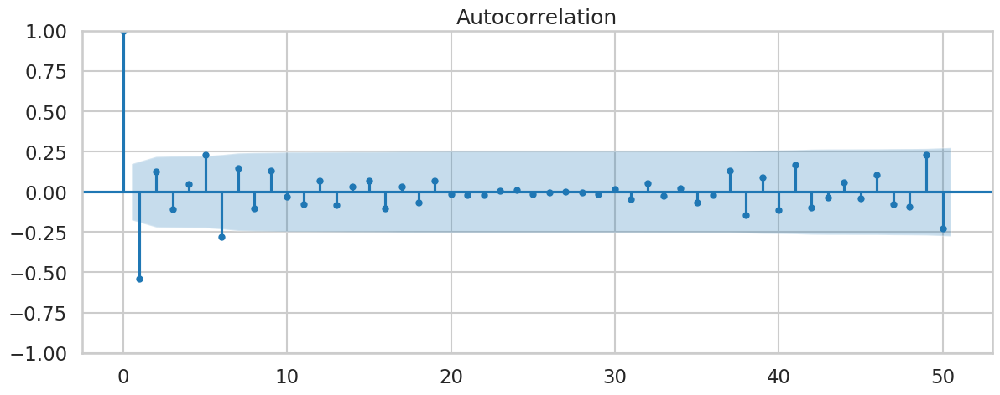

In [59]:
#Plot Autocorrelation Function
rcParams['figure.figsize'] = 14, 5

plot_acf(train, lags=50);

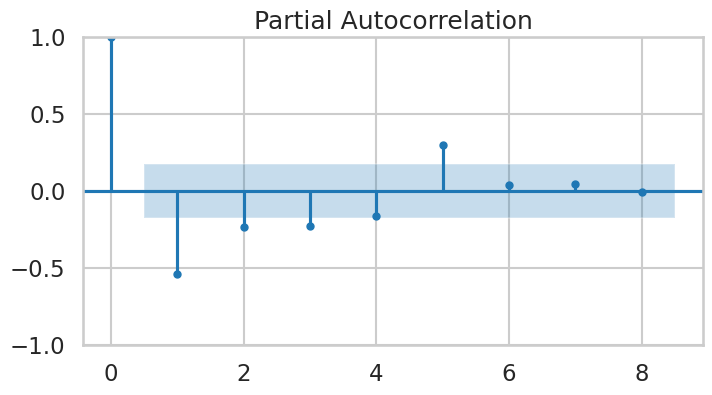

In [60]:
from statsmodels.graphics.tsaplots import plot_pacf
fig, ax = plt.subplots(figsize=(8,4))
plot_pacf (train,ax=ax, lags=8) ;

Looks like we have a bit of a pattern here as we might expect, rising and falling at a measurably predictable rate. Based on this, I will fit an ARMA model with (1,0,0).

### Apis Mellifera Mellifera - Dark European Bee

#### Test/Train Split

In [61]:
#make new df of apis info
df_apis = series_to_df(df, 'Apis mellifera')
#set index to date
apis = df_apis.set_index('Week')
#Make a series of the apis data:
apis = apis.squeeze()
apis.head()

Week
2012-12-31    0
2013-01-07    0
2013-01-14    0
2013-01-21    0
2013-01-28    0
Name: Count, dtype: int64

In [62]:
# Definig the 80% cutoff for the split train - test
apis_80 = round(apis.shape[0]*0.8)

#making the train
train_apis = apis[:(apis_80+1)] # to avoid gaps in the series, we add a +1
test_apis = apis[apis_80:]
#Make a copy *just in case* we want an untouched set for later
train_apis_orig = train_apis.copy()
test_apis_orig = test_apis.copy()

In [63]:
train_apis


Week
2012-12-31     0
2013-01-07     0
2013-01-14     0
2013-01-21     0
2013-01-28     0
              ..
2015-05-04     3
2015-05-11     8
2015-05-18    15
2015-05-25    11
2015-06-01    14
Name: Count, Length: 127, dtype: int64

Now that we have made the train and test, let's see it!

In [64]:
test_apis

Week
2015-06-01    14
2015-06-08    19
2015-06-15    13
2015-06-22    16
2015-06-29    14
2015-07-06     4
2015-07-13    38
2015-07-20    38
2015-07-27    39
2015-08-03    13
2015-08-10    32
2015-08-17    28
2015-08-24    10
2015-08-31     6
2015-09-07     6
2015-09-14    12
2015-09-21    11
2015-09-28     2
2015-10-05    13
2015-10-12     2
2015-10-19     3
2015-10-26     1
2015-11-02     0
2015-11-09     0
2015-11-16     0
2015-11-23     0
2015-11-30     0
2015-12-07     0
2015-12-14     0
2015-12-21     0
2015-12-28     0
Name: Count, dtype: int64

Now let's get a visual of where the split occurs.

Text(0.5, 0, 'Date Spotted')

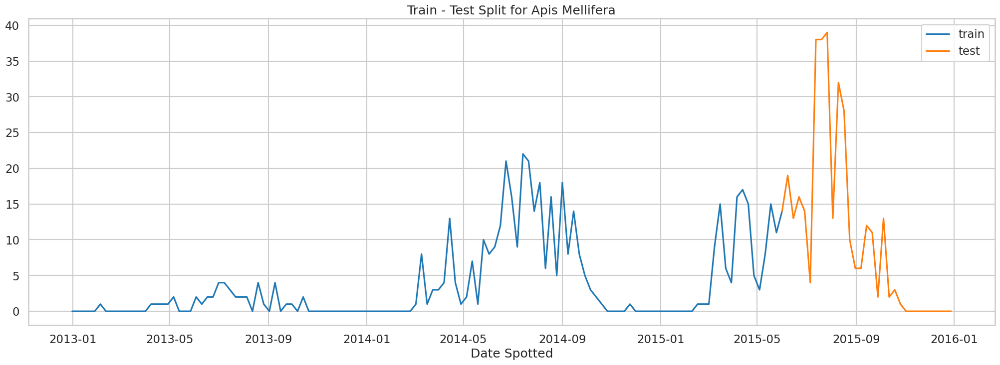

In [65]:
sns.set_context("talk")
fig, ax = plt.subplots(figsize=(25, 8))
ax.plot(train_apis, label='train')
ax.plot(test_apis, label='test')
ax.set_title('Train - Test Split for Apis Mellifera');
plt.legend()
plt.xlabel("Date Spotted")

So cool! Now let's go ahead and make a validation set as an added layer of cross validation.

#### Validation Set
Instead of taking only one validation set as part of the test set, we chose to use the TimeSeriesSpit() function to create splits of train and validation, that can be used for a cross validation.

We can see from the indeces below that the default number of splits is 5, and that the validation set always comes right after the train set, but the train set is increasing in size with every split.
The size of the validation set remains the same.
We will use this later to do cross validation on our models

In [66]:
split = TimeSeriesSplit()

for train_apis_ind, val_ind_apis in split.split(train_apis):
    print(train_apis_ind, val_ind_apis)

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21] [22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42] [43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63] [64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71
 72 73 74 75 76 77 78 79 80 81 82 83 84] [ 85  86  87  88  89  90  91  92  93  94  95  96  97  98  99 100 101 102
 103 104 105]
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  

Now that we have our test, train_apis, and validation set, we will explore the data to see how best build a model for it.

#### Stationarity
Stationality refers to a flat looking series, without trend, constant variance over time, a constant autocorrelation structure over time and no periodic fluctuations. We can find this by running the Dickey-Fuller test. 

In [67]:
dftest = adfuller(train_apis)

dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
for key,value in dftest[4].items():
      dfoutput['Critical Value (%s)'%key] = value
print (dfoutput)

Test Statistic                  -1.512974
p-value                          0.527084
#Lags Used                       3.000000
Number of Observations Used    123.000000
Critical Value (1%)             -3.484667
Critical Value (5%)             -2.885340
Critical Value (10%)            -2.579463
dtype: float64


The Null Hypothesis is that the series **is not** stationary, and with the p-value > 0.05, we fail to reject the null hypothesis and the series can be considered not stationary.

####Testing for Heteroscedasticity
Before we move on, we need to test for heteroscedasticity using the Breusch-Pagan test. With this test, we have a null hypothesis that homoscedasticity is present (the residuals are distributed with equal variance) and and alternative hypothesis that heteroscedasticity is present (the residuals are not distributed with equal variance). Like other tests, we will use .05 as the significance level.

In [68]:
#First, we’ll fit a multiple linear regression model:

import statsmodels.formula.api as smf

#fit regression model
fit = smf.ols('Count ~ Week', data=df_apis).fit()

#view model summary
print(fit.summary())

                            OLS Regression Results                            
Dep. Variable:                  Count   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 05 Apr 2023   Prob (F-statistic):                nan
Time:                        18:04:00   Log-Likelihood:                 4712.4
No. Observations:                 157   AIC:                            -9111.
Df Residuals:                       0   BIC:                            -8631.
Df Model:                         156                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

In [69]:
#Perform a Breusch-Pagan test.

from statsmodels.compat import lzip
import statsmodels.stats.api as sms

#perform Bresuch-Pagan test
names = ['Lagrange multiplier statistic', 'p-value',
        'f-value', 'f p-value']
test_bp = sms.het_breuschpagan(fit.resid, fit.model.exog)

lzip(names, test_bp)


[('Lagrange multiplier statistic', 157.0),
 ('p-value', 0.46246426563583504),
 ('f-value', nan),
 ('f p-value', nan)]

With a p-value of >.05, we fail to reject the null that we have homoscedasticity, and confirm that our data is homoscedastic. 

Ok, so we don't have stationarity but we are homoscedastic. Let's tackle the stationarity issue with  

#### Subtracting Rolling Mean
Next we are going to try to make the series stationary by subtracting the rolling mean, which tells us of the dependence of the series values on the previous values in the past.

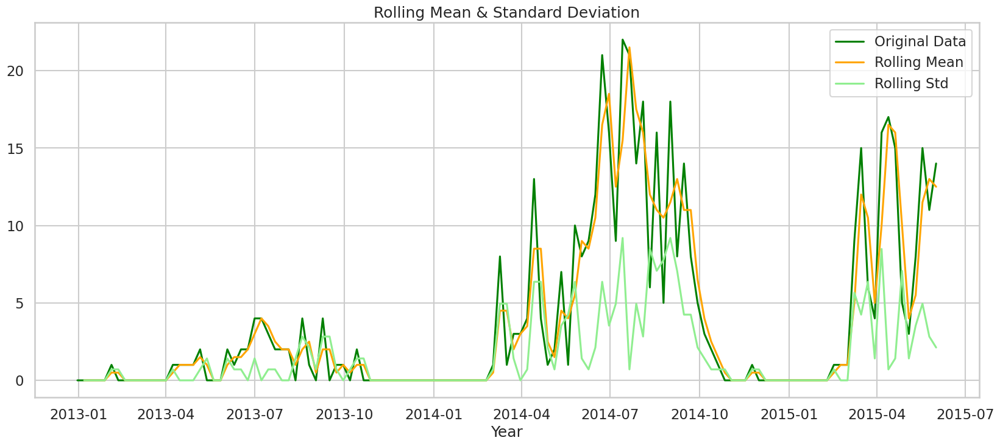

In [70]:
#Calculate rolling mean and std
roll_mean = train_apis.rolling(window=2, center=False).mean()
roll_std = train_apis.rolling(window=2, center=False).std()

#Visualize it!
fig = plt.figure(figsize=(20,8))
plt.plot(train_apis, color='green', label='Original Data')
plt.plot(roll_mean, color='orange', label='Rolling Mean')
plt.plot(roll_std, color='lightgreen', label = 'Rolling Std')
plt.legend(loc='best')
plt.title('Rolling Mean & Standard Deviation')
plt.xlabel("Year");

While there wasn't a lot of noise in this data, however, we can see the rolling mean has helped get rid of some of the noise that was present.

We can confirm this by subtracting the rolling mean from the series and we can check if the residulas are stationary, again with the Dickey Fuller test: 

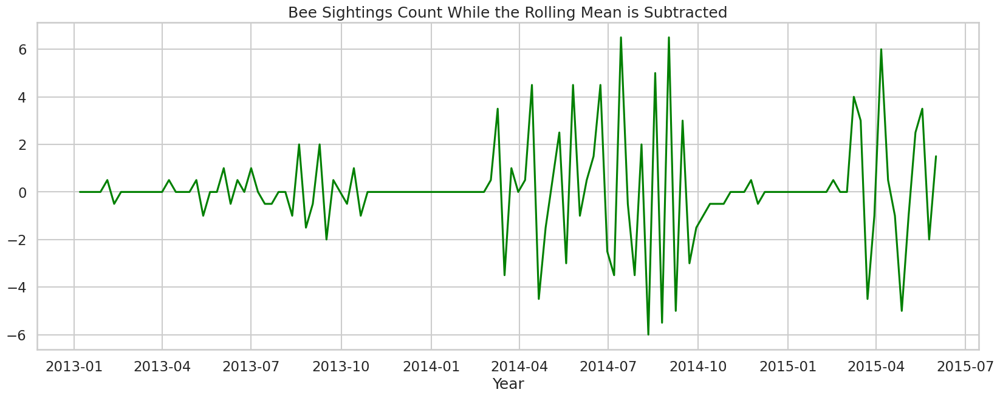

In [71]:
roll_mean_nat = train_apis.rolling(window=2, center=False).mean()
# Subtract the moving average from the original data
data_mrm_nat = train_apis - roll_mean_nat
# Drop the missing values from time series calculated above
data_mrm_nat.dropna(inplace=True)
# Plot sales with rolling mean subtracted
fig = plt.figure(figsize=(20,7))
plt.plot(data_mrm_nat, color='green')#,label='Count - rolling mean')
plt.title('Bee Sightings Count While the Rolling Mean is Subtracted')
plt.xlabel("Year")
plt.show();

In [72]:
dftest = adfuller(data_mrm_nat)
#results
dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
for key,value in dftest[4].items():
      dfoutput['Critical Value (%s)'%key] = value
print (dfoutput)

Test Statistic                -1.030631e+01
p-value                        3.272024e-18
#Lags Used                     2.000000e+00
Number of Observations Used    1.230000e+02
Critical Value (1%)           -3.484667e+00
Critical Value (5%)           -2.885340e+00
Critical Value (10%)          -2.579463e+00
dtype: float64


The Null Hypothesis is that the series is not stationary, and with the p-value < 0.05, we reject the null hypothesis and the series can be considered stationary.

#### Series Decompostion

For informational purposes, we can break it down further via seasonal_decompose( ), breaking up the time series into trend, seasonality and residuals and take a look!


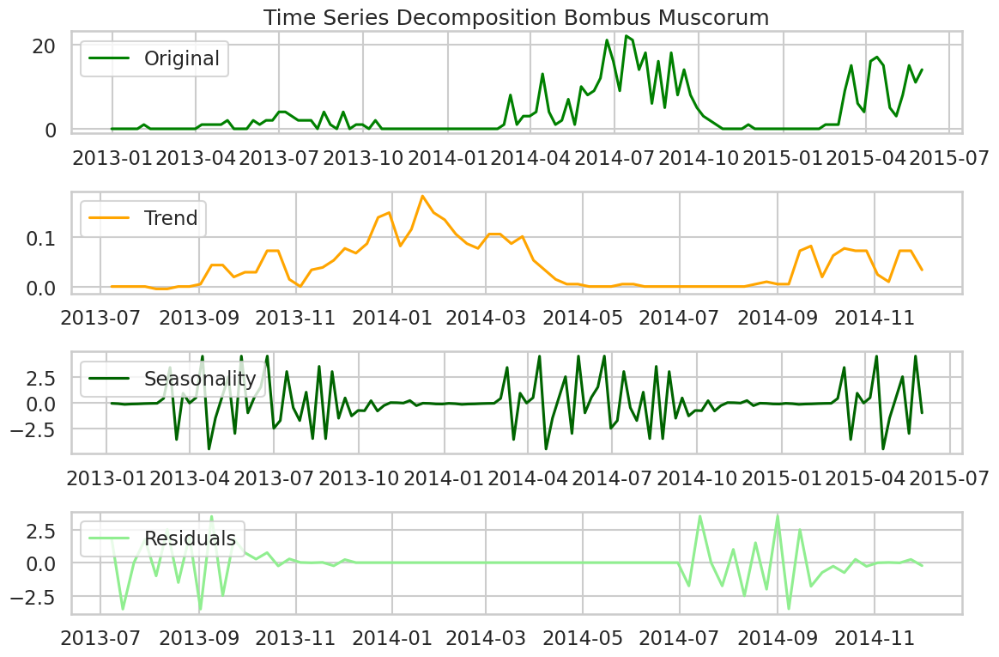

In [73]:
decomposition = seasonal_decompose(data_mrm_nat)

# Gather the trend, seasonality, and residuals 
trend = decomposition.trend
seasonal = decomposition.seasonal
residual = decomposition.resid

# Plot gathered statistics
plt.figure(figsize=(12,8))
plt.subplot(411)
plt.title('Time Series Decomposition Bombus Muscorum')
plt.plot(train_apis, label='Original', color='green')
plt.legend(loc='upper left')
plt.subplot(412)
plt.plot(trend, label='Trend', color='orange')
plt.legend(loc='upper left')
plt.subplot(413)
plt.plot(seasonal,label='Seasonality', color='darkgreen')
plt.legend(loc='upper left')
plt.subplot(414)
plt.plot(residual, label='Residuals', color='lightgreen')
plt.legend(loc='upper left')

plt.tight_layout();


So with this, we can see that the trend, while not very flat, is pretty consistent overall. There is definite seasonality appearing with a lag every year around March, and residuals look relatively consistent, though we will need to run another test to confirm.

In [74]:
#drop nans
residual.dropna(inplace=True)
#define
dftest = adfuller(residual)
#results
dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
for key,value in dftest[4].items():
      dfoutput['Critical Value (%s)'%key] = value
print (dfoutput)

Test Statistic                -21.205539
p-value                         0.000000
#Lags Used                      0.000000
Number of Observations Used    73.000000
Critical Value (1%)            -3.523284
Critical Value (5%)            -2.902031
Critical Value (10%)           -2.588371
dtype: float64


Great! It appears our residuals are lower than .05, so we can reject the null, and say it's stationary!

In [75]:
#Reasign train now that it has been made stationary
train_apis=data_mrm_nat

####Testing for Autocorrelation
Autocorrelation is calculated between the variable and itself at previous time steps. Visualizing it can help show patterns in the data and help us decide what kind of model we will try out!

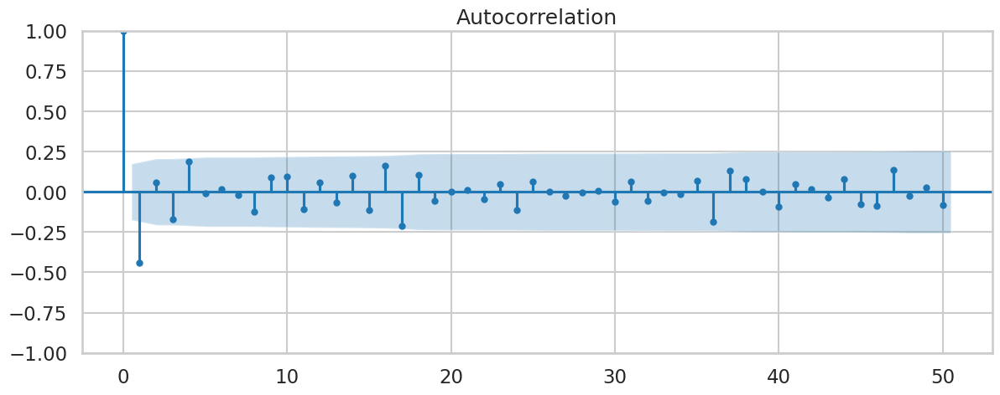

In [76]:
#Plot Autocorrelation Function
rcParams['figure.figsize'] = 14, 5

plot_acf(train_apis, lags=50);

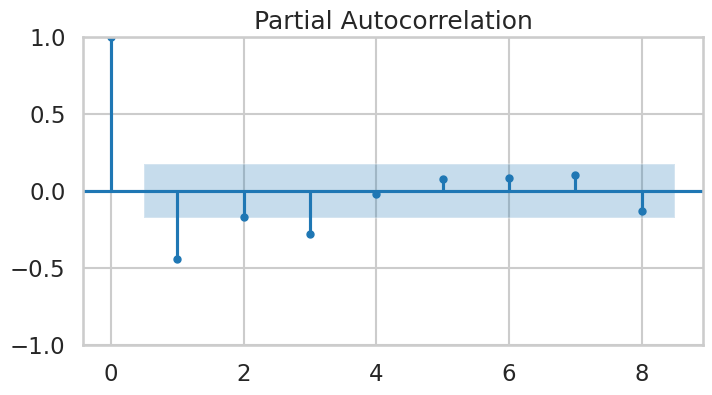

In [77]:
from statsmodels.graphics.tsaplots import plot_pacf
fig, ax = plt.subplots(figsize=(8,4))
plot_pacf (train_apis,ax=ax, lags=8) ;

Looks like we have a bit of a pattern here as we might expect, rising and falling at a measurably predictable rate. Based on this, I will fit an ARMA model with (1,0,0).

### Andrena haemorrhoa - Orange Tailed Mining Bee


#### Test/Train Split

In [78]:
#make new df of andrena info
andrena = series_to_df(df, 'Andrena haemorrhoa')
#set index to date
andrena = andrena.set_index('Week')
#Make a series of the andrena data:
andrena = andrena.squeeze()
len(andrena)

157

In [79]:
# Definig the 80% cutoff for the split train - test
andrena_80 = round(andrena.shape[0]*0.8)

#making the train
train_andrena = andrena[:(andrena_80+1)] # to avoid gaps in the series, we add a +1
test_andrena = andrena[andrena_80:]
#Make a copy *just in case* we want an untouched set for later
train_andrena_orig = train_andrena.copy()
test_andrena_orig = test_andrena.copy()

In [80]:
train_andrena


Week
2012-12-31    0
2013-01-07    0
2013-01-14    0
2013-01-21    0
2013-01-28    0
             ..
2015-05-04    1
2015-05-11    3
2015-05-18    7
2015-05-25    4
2015-06-01    1
Name: Count, Length: 127, dtype: int64

Now that we have made the trai and test, let's see it!

In [81]:
test_andrena

Week
2015-06-01    1
2015-06-08    3
2015-06-15    2
2015-06-22    1
2015-06-29    0
2015-07-06    0
2015-07-13    0
2015-07-20    0
2015-07-27    0
2015-08-03    0
2015-08-10    0
2015-08-17    0
2015-08-24    0
2015-08-31    0
2015-09-07    0
2015-09-14    0
2015-09-21    0
2015-09-28    0
2015-10-05    0
2015-10-12    0
2015-10-19    0
2015-10-26    0
2015-11-02    0
2015-11-09    0
2015-11-16    0
2015-11-23    0
2015-11-30    0
2015-12-07    0
2015-12-14    0
2015-12-21    0
2015-12-28    0
Name: Count, dtype: int64

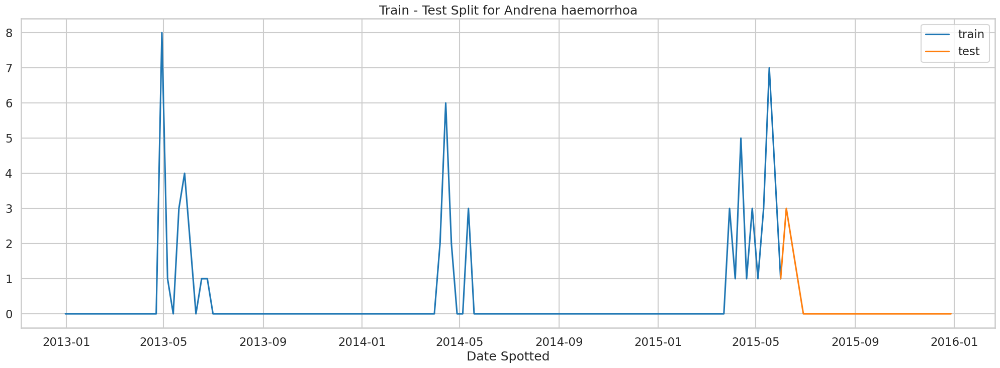

In [82]:
sns.set_context("talk")
fig, ax = plt.subplots(figsize=(25, 8))
ax.plot(train_andrena, label='train')
ax.plot(test_andrena, label='test')
ax.set_title('Train - Test Split for Andrena haemorrhoa');
plt.legend()
plt.xlabel("Date Spotted");

So cool! Now let's go ahead and make a validation set as an added layer of cross validation.

#### Validation Set
Instead of taking only one validation set as part of the test set, we chose to use the TimeSeriesSpit() function to create splits of train and validation, that can be used for a cross validation.

We can see from the indeces below that the default number of splits is 5, and that the validation set always comes right after the train set, but the train set is increasing in size with every split.
The size of the validation set remains the same.
We will use this later to do cross validation on our models

In [83]:
split = TimeSeriesSplit()

for train_andrena_ind, val_ind_andrena in split.split(train_andrena):
    print(train_andrena_ind, val_ind_andrena)

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21] [22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42] [43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63] [64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71
 72 73 74 75 76 77 78 79 80 81 82 83 84] [ 85  86  87  88  89  90  91  92  93  94  95  96  97  98  99 100 101 102
 103 104 105]
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  

Now that we have our test, train_andrena, and validation set, we will explore the data to see how best build a model for it.

#### Stationarity
Stationality refers to a flat looking series, without trend, constant variance over time, a constant autocorrelation structure over time and no periodic fluctuations. We can find this by running the Dickey-Fuller test. 

In [84]:
dftest = adfuller(train_andrena)

dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
for key,value in dftest[4].items():
      dfoutput['Critical Value (%s)'%key] = value
print (dfoutput)

Test Statistic                  -1.952741
p-value                          0.307671
#Lags Used                       3.000000
Number of Observations Used    123.000000
Critical Value (1%)             -3.484667
Critical Value (5%)             -2.885340
Critical Value (10%)            -2.579463
dtype: float64


The Null Hypothesis is that the series **is not** stationary, and with the p-value > 0.05, we fail to reject the null hypothesis and the series can be considered not stationary.

####Testing for Heteroscedasticity
Before we move on, we need to test for heteroscedasticity using the Breusch-Pagan test. With this test, we have a null hypothesis that homoscedasticity is present (the residuals are distributed with equal variance) and and alternative hypothesis that heteroscedasticity is present (the residuals are not distributed with equal variance). Like other tests, we will use .05 as the significance level.

In [85]:
#First, we’ll fit a multiple linear regression model:

import statsmodels.formula.api as smf

#fit regression model
fit = smf.ols('Count ~ Week', data=andrena_haemorrhoa).fit()


In [86]:
#Perform a Breusch-Pagan test.

from statsmodels.compat import lzip
import statsmodels.stats.api as sms

#perform Bresuch-Pagan test
names = ['Lagrange multiplier statistic', 'p-value',
        'f-value', 'f p-value']
test_bp = sms.het_breuschpagan(fit.resid, fit.model.exog)

lzip(names, test_bp)


[('Lagrange multiplier statistic', 157.0),
 ('p-value', 0.46246426563583504),
 ('f-value', nan),
 ('f p-value', nan)]

With a p-value of >.05, we fail to reject the null that we have homoscedasticity, and confirm that our data is homoscedastic. 

Ok, so we don't have stationarity but we are homoscedastic. Let's tackle the stationarity issue by using Subtracting Rolling Mean.  

#### Subtracting Rolling Mean
Next we are going to try to make the series stationary by subtracting the rolling mean, which tells us of the dependence of the series values on the previous values in the past.

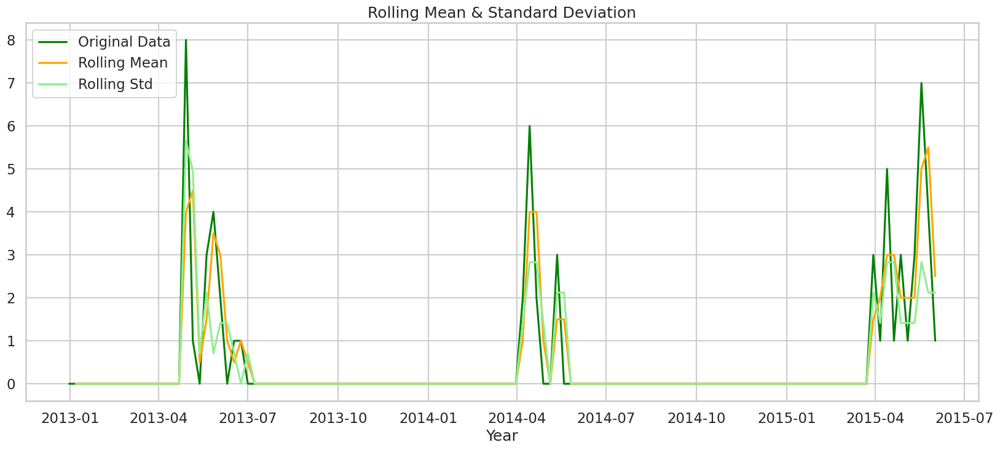

In [87]:
#Calculate rolling mean and std
roll_mean = train_andrena.rolling(window=2, center=False).mean()
roll_std = train_andrena.rolling(window=2, center=False).std()

#Visualize it!
fig = plt.figure(figsize=(20,8))
plt.plot(train_andrena, color='green', label='Original Data')
plt.plot(roll_mean, color='orange', label='Rolling Mean')
plt.plot(roll_std, color='lightgreen', label = 'Rolling Std')
plt.legend(loc='best')
plt.title('Rolling Mean & Standard Deviation')
plt.xlabel("Year");

While there wasn't a lot of noise in this data, however, we can see the rolling mean has helped get rid of some of the noise that was present.

We can confirm this by subtracting the rolling mean from the series and we can check if the residulas are stationary, again with the Dickey Fuller test: 

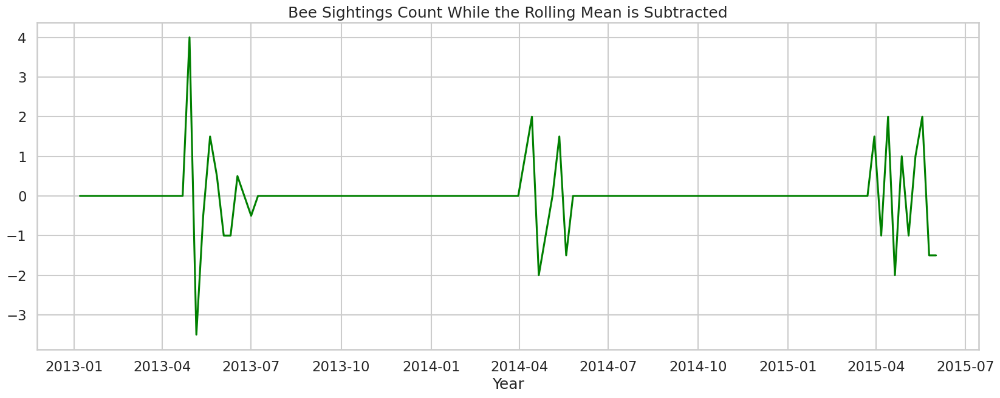

In [88]:
roll_mean_nat = train_andrena.rolling(window=2, center=False).mean()
# Subtract the moving average from the original data
data_mrm_nat = train_andrena - roll_mean_nat
# Drop the missing values from time series calculated above
data_mrm_nat.dropna(inplace=True)
# Plot sales with rolling mean subtracted
fig = plt.figure(figsize=(20,7))
plt.plot(data_mrm_nat, color='green')#,label='Count - rolling mean')
plt.title('Bee Sightings Count While the Rolling Mean is Subtracted')
plt.xlabel("Year")
plt.show();

In [89]:
dftest = adfuller(data_mrm_nat)
#results
dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
for key,value in dftest[4].items():
      dfoutput['Critical Value (%s)'%key] = value
print (dfoutput)

Test Statistic                -1.232738e+01
p-value                        6.542709e-23
#Lags Used                     2.000000e+00
Number of Observations Used    1.230000e+02
Critical Value (1%)           -3.484667e+00
Critical Value (5%)           -2.885340e+00
Critical Value (10%)          -2.579463e+00
dtype: float64


The Null Hypothesis is that the series is not stationary, and with the p-value < 0.05, we reject the null hypothesis and the series can be considered stationary.

#### Series Decompostion

For informational purposes, we can break it down further via seasonal_decompose( ), breaking up the time series into trend, seasonality and residuals and take a look!


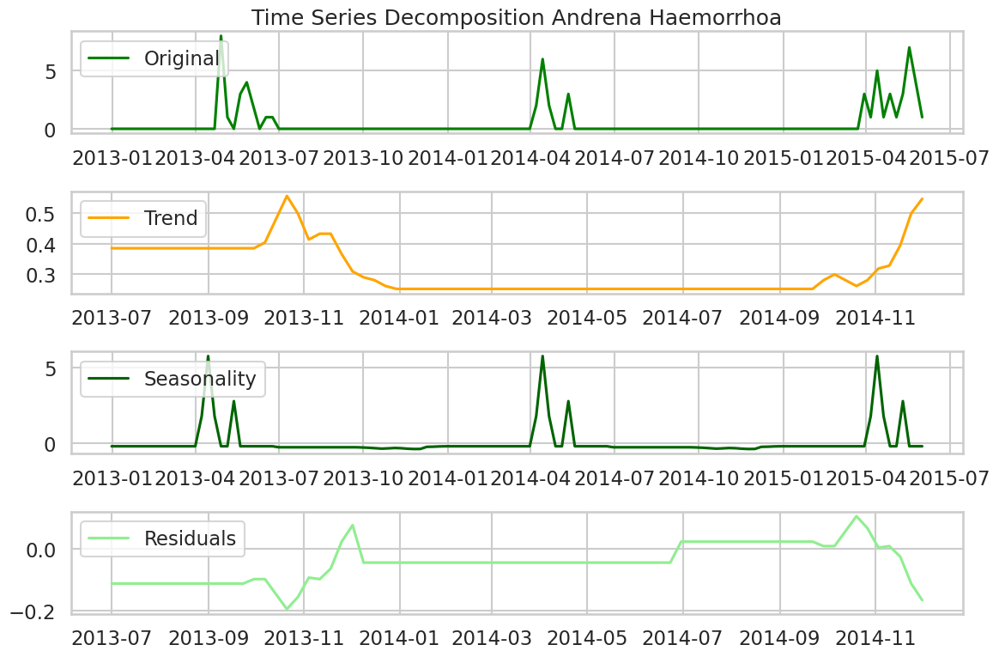

In [90]:
decomposition = seasonal_decompose(train_andrena)

# Gather the trend, seasonality, and residuals 
trend = decomposition.trend
seasonal = decomposition.seasonal
residual = decomposition.resid

# Plot gathered statistics
plt.figure(figsize=(12,8))
plt.subplot(411)
plt.title('Time Series Decomposition Andrena Haemorrhoa')
plt.plot(train_andrena, label='Original', color='green')
plt.legend(loc='upper left')
plt.subplot(412)
plt.plot(trend, label='Trend', color='orange')
plt.legend(loc='upper left')
plt.subplot(413)
plt.plot(seasonal,label='Seasonality', color='darkgreen')
plt.legend(loc='upper left')
plt.subplot(414)
plt.plot(residual, label='Residuals', color='lightgreen')
plt.legend(loc='upper left')

plt.tight_layout();


So with this, we can see that the trend is relatively pretty consistent overall, there is definite seasonality appearing with a lag every year around April, and residuals look relatively consistent, though we will need to run another test to confirm.

In [91]:
#drop nans
residual.dropna(inplace=True)
#define
dftest = adfuller(residual)
#results
dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
for key,value in dftest[4].items():
      dfoutput['Critical Value (%s)'%key] = value
print (dfoutput)

Test Statistic                 -1.909350
p-value                         0.327675
#Lags Used                      5.000000
Number of Observations Used    69.000000
Critical Value (1%)            -3.528890
Critical Value (5%)            -2.904440
Critical Value (10%)           -2.589656
dtype: float64


Great! It appears our residuals are lower than .05, so we can reject the null, and say it's stationary!

####Testing for Autocorrelation
Autocorrelation is calculated between the variable and itself at previous time steps. Visualizing it can help show patterns in the data and help us decide what kind of model we will try out!

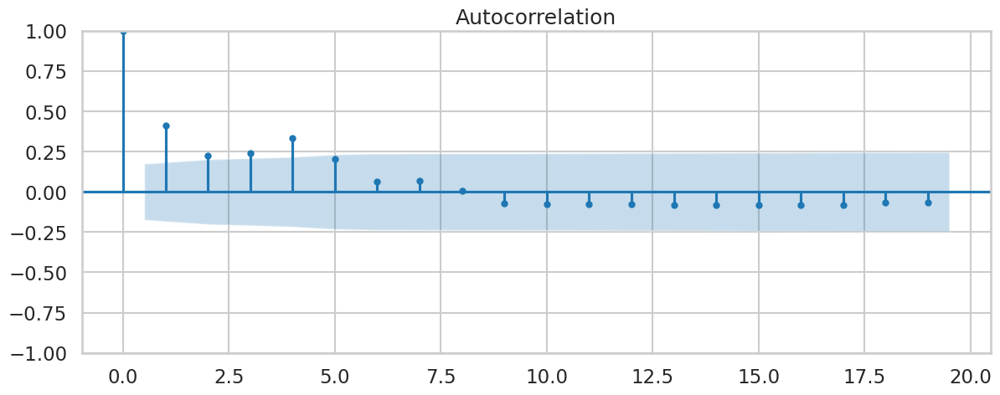

In [92]:
#Plot Autocorrelation Function
rcParams['figure.figsize'] = 14, 5

plot_acf(train_andrena, lags=19);

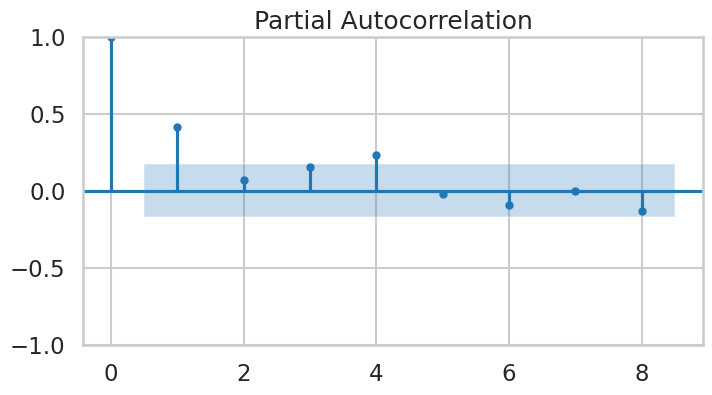

In [93]:
from statsmodels.graphics.tsaplots import plot_pacf
fig, ax = plt.subplots(figsize=(8,4))
plot_pacf (train_andrena,ax=ax, lags=8) ;

Looks like we have a *tiny* bit of a pattern here as we might expect, but not much. Still, I will fit an ARMA model with (1,0,0).

## 4. Models<a id='Modeling'></a>

We are going to play around with some different types of models, and tweak them and their hyperparameters to see how they fair. We will go in this order:
1. Baseline Naive Model
    
2. Auto-Regressive Moving Average Model (ARIMA)
   * GridSearch (GridSearchCV) - To help find the best parameters to use in our model
3. Seasonal Autoregressive Integrated Moving Average Exogenous Model (SARIMAX)
   * GridSearch (GridSearchCV) - To help find the best parameters to use in our model
4. Prophet

### Bombus Muscorum - Large Carder Bee<a id='lr'></a>

#### Model #1: Baseline Model

To start, we will build a baseline naive model, which predicts the data to be equal to the day before, via a shift to the original time series.

In [94]:
#basic naive model
naive = train.shift(1)
naive

Week
2013-01-07    NaN
2013-01-14    0.0
2013-01-21    0.0
2013-01-28    0.0
2013-02-04    0.0
             ... 
2015-05-04   -1.5
2015-05-11    0.0
2015-05-18   -0.5
2015-05-25    4.0
2015-06-01   -0.5
Name: Count, Length: 126, dtype: float64

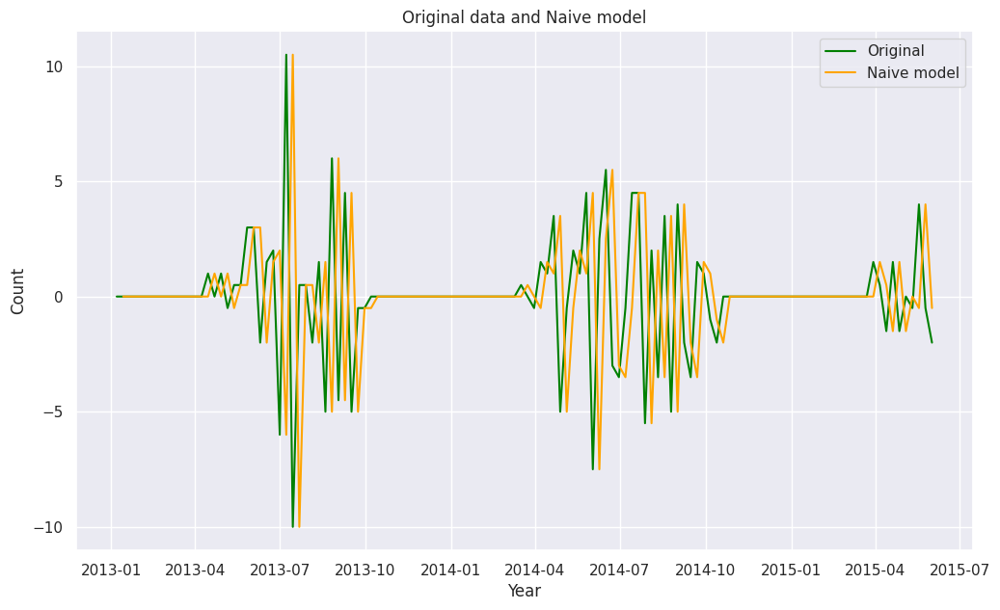

In [95]:
fig = plt.figure(figsize=(12,7))
sns.set(font_scale=1)
plt.plot(train, color='green', label='Original')
plt.plot(naive, color='orange', label='Naive model')
plt.legend(loc='best')
plt.title('Original data and Naive model')
plt.xlabel("Year", )
plt.ylabel("Count")
plt.show(block=False)

To compare to future models, we can calculate this models RMSE, or The Root Mean Squared Error.

The Root Mean Squared Error calculates the difference between the value predicted by our model and the true value, making it a great judge, though it offers no safeguards from overfitting.

In [96]:
RMSE_naiv=round(np.sqrt(mean_squared_error(train[1:], naive.dropna())),2)
print(f'The RMSE for the naive baseline model is in Count: {RMSE_naiv}')


The RMSE for the naive baseline model is in Count: 4.4


#### Model #2: ARMA (Auto-Regressive Moving Average) Model

An autoregression model uses data from the same input variable at previous time steps.

In [97]:
#Simple model with our order of 1 
mod_ar = ARIMA(train, order=(1,0,0))
# Fit
res_ar = mod_ar.fit()
# Print out model summary
print(res_ar.summary())

                               SARIMAX Results                                
Dep. Variable:                  Count   No. Observations:                  126
Model:                 ARIMA(1, 0, 0)   Log Likelihood                -272.611
Date:                Wed, 05 Apr 2023   AIC                            551.222
Time:                        18:04:17   BIC                            559.731
Sample:                    01-07-2013   HQIC                           554.679
                         - 06-01-2015                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0175      0.125      0.140      0.889      -0.228       0.263
ar.L1         -0.5369      0.042    -12.648      0.000      -0.620      -0.454
sigma2         4.4219      0.377     11.727      0.0

In [98]:
y_hat = res_ar.predict(typ='levels')
RMSE_ARIMA1 = np.sqrt(mean_squared_error(train, y_hat))
print(f'The RMSE for the ARIMA(1,0,0) model: {RMSE_ARIMA1}')
RMSE_AIC1 = res_ar.aic
print(f'The AIC for the ARIMA(1,0,0) model: {RMSE_AIC1}')

The RMSE for the ARIMA(1,0,0) model: 2.1028431326531827
The AIC for the ARIMA(1,0,0) model: 551.2217248698613


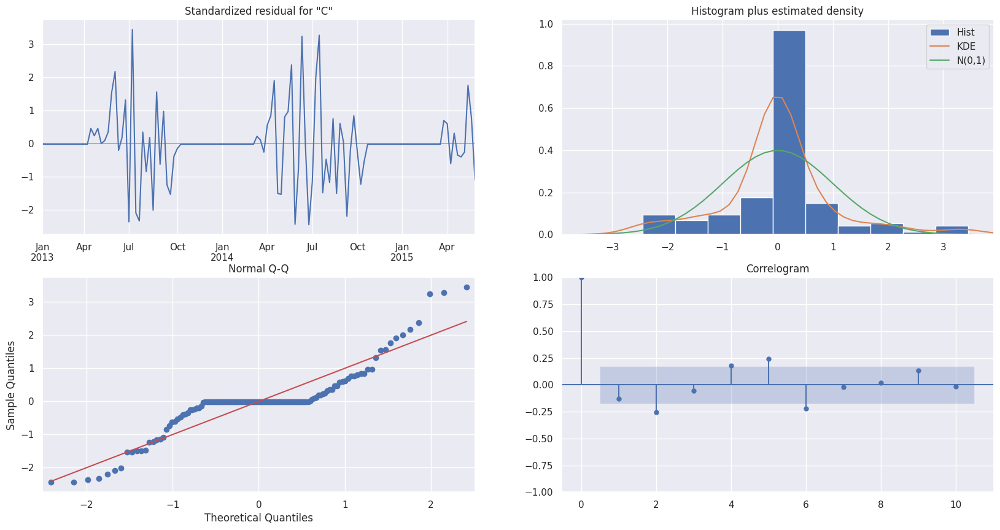

Results of Dickey-Fuller test: 

Test Statistic                  -4.049330
p-value                          0.001173
#Lags Used                       4.000000
Number of Observations Used    121.000000
Critical Value (1%)             -3.485585
Critical Value (5%)             -2.885739
Critical Value (10%)            -2.579676
dtype: float64
4.378601849949841
0.10911036323555853
3.5788191107618865
1.6255913774335824
1.1902383710821016
Mean of RMSE after cross validation: 2.18


In [99]:
#plotting residuals 
res_ar.plot_diagnostics(figsize=(20,10))
plt.show()
# Make a df of residuals
residuals = pd.DataFrame(res_ar.resid)
residuals.dropna(inplace=True)
#Run Dickey-Fuller Test
dftest = adfuller(residuals)
dfoutput = pd.Series(dftest[0:4], index=['Test Statistic',\
        'p-value', '#Lags Used', 'Number of Observations Used'])
for key,value in dftest[4].items():
    dfoutput['Critical Value (%s)'%key] = value
print ('Results of Dickey-Fuller test: \n')
print(dfoutput)
#Cross Validation
train_with_ind = train.reset_index()
cv=[]
for train_ind, val_ind in split.split(train_with_ind):
    #fitting on the train from the train-validation split
    ar = ARIMA(endog=train_with_ind.iloc[train_ind, -1], order=(1, 0, 0)).fit()
    #predicting on the validation part of the sample
    preds = ar.predict(typ='levels', start=val_ind[0], end=val_ind[-1])
    true = train_with_ind.iloc[val_ind, -1]
    cv.append(round(np.sqrt(mean_squared_error(true, preds)),2))
    #comparing validation and predictions on validation
    print(np.sqrt(mean_squared_error(true, preds)))
mean=round(np.mean(cv),2)
print(f'Mean of RMSE after cross validation: {mean}')

Looking at these diagnostics tells me that this isn't a super great model. The residuals are stationary, but there isn't a lot of noise in there. Let's tweak and see if we can do better.

##### Second ARIMA Model

In [100]:
#Upping our order
mod_ar = ARIMA(train, order=(2,0,1))
# Fit
res_ar = mod_ar.fit()
# Print out model summary
print(res_ar.summary())


                               SARIMAX Results                                
Dep. Variable:                  Count   No. Observations:                  126
Model:                 ARIMA(2, 0, 1)   Log Likelihood                -269.034
Date:                Wed, 05 Apr 2023   AIC                            548.067
Time:                        18:04:19   BIC                            562.249
Sample:                    01-07-2013   HQIC                           553.829
                         - 06-01-2015                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0015      0.031     -0.047      0.962      -0.062       0.059
ar.L1          0.3532      0.075      4.733      0.000       0.207       0.499
ar.L2          0.4291      0.055      7.799      0.0

In [101]:
y_hat = res_ar.predict(typ='levels')
RMSE_ARIMA1 = np.sqrt(mean_squared_error(train, y_hat))
print(f'The RMSE for the ARIMA(2,0,1) model: {RMSE_ARIMA1}')
RMSE_AIC1 = res_ar.aic
print(f'The AIC for the ARIMA(2,0,1) model: {RMSE_AIC1}')

The RMSE for the ARIMA(2,0,1) model: 2.0417638511586307
The AIC for the ARIMA(2,0,1) model: 548.0673641266839


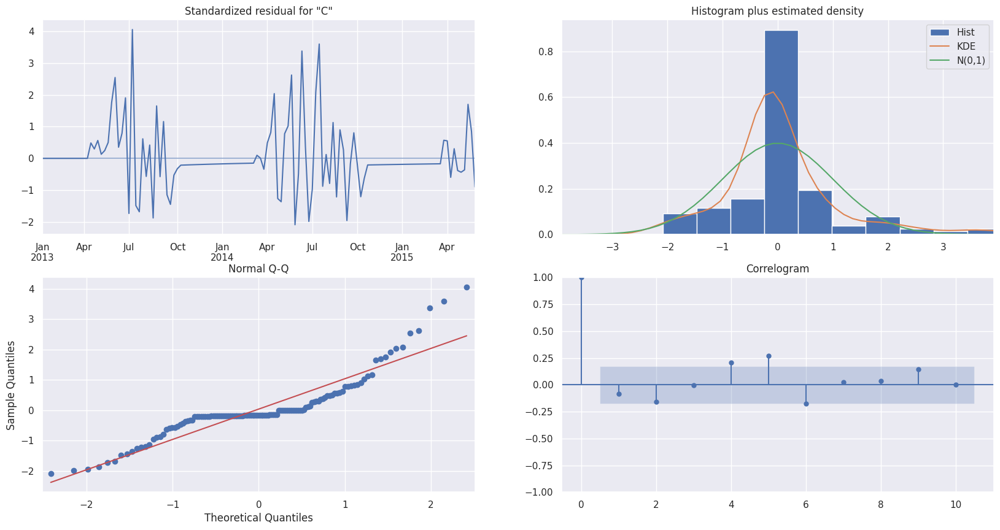

Results of Dickey-Fuller test: 

Test Statistic                  -3.160583
p-value                          0.022383
#Lags Used                       4.000000
Number of Observations Used    121.000000
Critical Value (1%)             -3.485585
Critical Value (5%)             -2.885739
Critical Value (10%)            -2.579676
dtype: float64
4.4622444623077735
0.5370457982066195
3.6425560705562083
1.658644350890356
1.1936297609134858
Mean of RMSE after cross validation: 2.3


In [102]:
#Plotting Residuals 
res_ar.plot_diagnostics(figsize=(20,10))
residuals = pd.DataFrame(res_ar.resid)
plt.show()

#Run Dickey-Fuller Test
dftest = adfuller(residuals)
dfoutput = pd.Series(dftest[0:4], index=['Test Statistic',\
        'p-value', '#Lags Used', 'Number of Observations Used'])
for key,value in dftest[4].items():
    dfoutput['Critical Value (%s)'%key] = value
print ('Results of Dickey-Fuller test: \n')
print(dfoutput)
#Cross Validation
train_with_ind = train.reset_index()
cv=[]
for train_ind, val_ind in split.split(train_with_ind):
    #fitting on the train from the train-validation split
    ar = ARIMA(endog=train_with_ind.iloc[train_ind, -1], order=(2,0,1)).fit()
    #predicting on the validation part of the sample
    preds = ar.predict(typ='levels', start=val_ind[0], end=val_ind[-1])
    true = train_with_ind.iloc[val_ind, -1]
    cv.append(round(np.sqrt(mean_squared_error(true, preds)),2))
    #comparing validation and predictions on validation
    print(np.sqrt(mean_squared_error(true, preds)))
mean=round(np.mean(cv),2)
print(f'Mean of RMSE after cross validation: {mean}')

##### Hmmm...
Our model has slightly improved with a lower AIC and the lowest RSME as of yet. Our residuals are still stationary, and our distribution looks a little pointy but still Guassian.

Still, I wonder if we can do better. Let's do a grid search to find a combo with the lowest RSME we can, then we will run a summary and check the AIC again. 

##### Grid Search for best ARIMA hyperparameters

For this grid search, we will be using functions (thought tweaked for our use) from Jason Brownlees article "[How to Grid Search ARIMA Model Hyperparameters with Python](https://machinelearningmastery.com/grid-search-arima-hyperparameters-with-python/)."

In [103]:
# evaluate combinations of p, d and q values for an ARIMA model
def evaluate_models(dataset, p_values, d_values, q_values):
 #dataset = dataset.astype('float32')
 best_score, best_cfg = float("inf"), None
 for p in p_values:
  for d in d_values:
    for q in q_values:
      order = (p,d,q)
      try:
        model = ARIMA(dataset, order=order)
        model_fit = model.fit()
        y_hat = model_fit.predict(typ='levels')
        rmse = np.sqrt(mean_squared_error(train, y_hat))
        if rmse < best_score:
          best_score, best_cfg = rmse, order
        print('ARIMA%s RMSE=%.3f' % (order,rmse))
      except:
        continue
  print('Best ARIMA%s RMSE=%.3f' % (best_cfg, best_score))

In [104]:
# evaluate parameters
p_values = [0, 1, 2, 4, 6, 8, 10]
d_values = range(0, 3)
q_values = range(0, 3)
warnings.filterwarnings("ignore")
evaluate_models(train.values, p_values, d_values, q_values)

ARIMA(0, 0, 0) RMSE=2.498
ARIMA(0, 0, 1) RMSE=2.038
ARIMA(0, 0, 2) RMSE=2.002
ARIMA(0, 1, 0) RMSE=4.378
ARIMA(0, 1, 1) RMSE=2.529
ARIMA(0, 1, 2) RMSE=2.081
ARIMA(0, 2, 0) RMSE=8.109
ARIMA(0, 2, 1) RMSE=4.435
ARIMA(0, 2, 2) RMSE=2.714
Best ARIMA(0, 0, 2) RMSE=2.002
ARIMA(1, 0, 0) RMSE=2.103
ARIMA(1, 0, 1) RMSE=2.010
ARIMA(1, 0, 2) RMSE=1.971
ARIMA(1, 1, 0) RMSE=3.055
ARIMA(1, 1, 1) RMSE=2.127
ARIMA(1, 1, 2) RMSE=2.035
ARIMA(1, 2, 0) RMSE=4.907
ARIMA(1, 2, 1) RMSE=3.091
ARIMA(1, 2, 2) RMSE=2.192
Best ARIMA(1, 0, 2) RMSE=1.971
ARIMA(2, 0, 0) RMSE=2.044
ARIMA(2, 0, 1) RMSE=2.042
ARIMA(2, 0, 2) RMSE=1.991
ARIMA(2, 1, 0) RMSE=2.720
ARIMA(2, 1, 1) RMSE=2.068
ARIMA(2, 1, 2) RMSE=2.086
ARIMA(2, 2, 0) RMSE=4.003
ARIMA(2, 2, 1) RMSE=2.750
ARIMA(2, 2, 2) RMSE=2.138
Best ARIMA(1, 0, 2) RMSE=1.971
ARIMA(4, 0, 0) RMSE=1.970
ARIMA(4, 0, 1) RMSE=1.926
ARIMA(4, 0, 2) RMSE=1.923
ARIMA(4, 1, 0) RMSE=2.073
ARIMA(4, 1, 1) RMSE=1.971
ARIMA(4, 1, 2) RMSE=1.951
ARIMA(4, 2, 0) RMSE=2.903
ARIMA(4, 2, 1) RMSE=2.1

Looks like our best model parameters turned out the be (10, 0, 2) with an RMSE of 1.586. Let's run the model and check for it's AIC value.

##### Best ARIMA model

In [105]:
#Upping our order
mod_ar = ARIMA(train, order=(10,0,2))
# Fit
res_ar = mod_ar.fit()
# Print out model summary
print(res_ar.summary())

                               SARIMAX Results                                
Dep. Variable:                  Count   No. Observations:                  126
Model:                ARIMA(10, 0, 2)   Log Likelihood                -256.154
Date:                Wed, 05 Apr 2023   AIC                            540.308
Time:                        18:04:53   BIC                            580.016
Sample:                    01-07-2013   HQIC                           556.440
                         - 06-01-2015                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0237      0.127      0.187      0.851      -0.225       0.272
ar.L1          0.1412      0.117      1.207      0.227      -0.088       0.371
ar.L2         -0.6774      0.099     -6.873      0.0

Interesting enough, our AIC only improved marginally from our previous model ARIMA(2, 0, 0) of 505. Still, this is our best model as of yet. Let's take a look at the diagnostics.

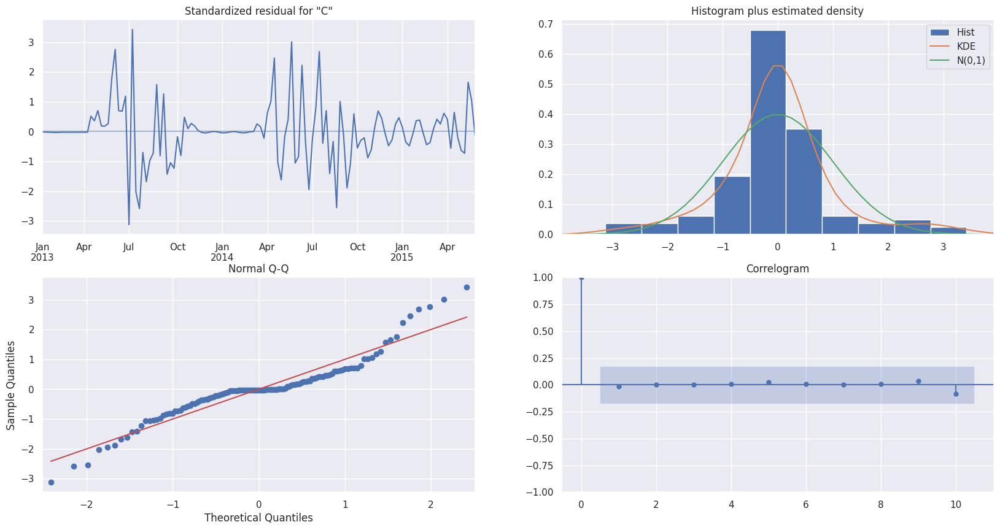

Results of Dickey-Fuller test: 

Test Statistic                -1.126362e+01
p-value                        1.599446e-20
#Lags Used                     0.000000e+00
Number of Observations Used    1.250000e+02
Critical Value (1%)           -3.483779e+00
Critical Value (5%)           -2.884954e+00
Critical Value (10%)          -2.579257e+00
dtype: float64
4.5370095707447256
0.3535985228762208
3.573140862876327
2.617252425965217
1.403287556295378
Mean of RMSE after cross validation: 2.5


In [106]:
#plotting residuals 
res_ar.plot_diagnostics(figsize=(20,10))
residuals = pd.DataFrame(res_ar.resid)
plt.show()

#Run Dickey-Fuller Test
dftest = adfuller(residuals)
dfoutput = pd.Series(dftest[0:4], index=['Test Statistic',\
        'p-value', '#Lags Used', 'Number of Observations Used'])
for key,value in dftest[4].items():
    dfoutput['Critical Value (%s)'%key] = value
print ('Results of Dickey-Fuller test: \n')
print(dfoutput)
#Cross Validation
train_with_ind = train.reset_index()
cv=[]
for train_ind, val_ind in split.split(train_with_ind):
    #fitting on the train from the train-validation split
    ar = ARIMA(endog=train_with_ind.iloc[train_ind, -1], order=(10, 0, 2)).fit()
    #predicting on the validation part of the sample
    preds = ar.predict(typ='levels', start=val_ind[0], end=val_ind[-1])
    true = train_with_ind.iloc[val_ind, -1]
    cv.append(round(np.sqrt(mean_squared_error(true, preds)),2))
    #comparing validation and predictions on validation
    print(np.sqrt(mean_squared_error(true, preds)))
mean=round(np.mean(cv),2)
print(f'Mean of RMSE after cross validation: {mean}')

Our RSME for our cross validation is 2.23, our residuals are still stationary, and our 

#### Model #3: SARIMAX<a id='rf'></a>

SARIMAX, or **S**easonal **A**uto-**R**egressive **I**ntegrated **M**oving **A**verage with e**X**ogenous factors, is an updated version of the ARIMA model but with 4 additional orders, but the first three are variations of the three orders of the ARIMA model with the fourth order being the length of the cycle being studied. Let's take a stab at it and see how it does. 

In [107]:
import statsmodels.api as sm
#Fitting the model
sarimax=sm.tsa.statespace.SARIMAX(train,order=(1, 0, 0),seasonal_order=(1,0,0,12))
sarimax_mo=sarimax.fit()
# Print out model summary
print(sarimax_mo.summary())
#Get that RSME!
y_hat = sarimax_mo.predict(typ='levels')
RMSE_ARIMA1 = np.sqrt(mean_squared_error(train, y_hat))
print(f'The RMSE for the SARIMAX(1,0,0)(1,0,0,12) model: {RMSE_ARIMA1}')

                                     SARIMAX Results                                      
Dep. Variable:                              Count   No. Observations:                  126
Model:             SARIMAX(1, 0, 0)x(1, 0, 0, 12)   Log Likelihood                -272.621
Date:                            Wed, 05 Apr 2023   AIC                            551.242
Time:                                    18:05:02   BIC                            559.751
Sample:                                01-07-2013   HQIC                           554.699
                                     - 06-01-2015                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5367      0.044    -12.083      0.000      -0.624      -0.450
ar.S.L12       0.0015      0.094   

Not bad, essentially the same as our first ARIMA model. Let's do a gridsearch to really kick things into gear. 

##### Gridsearch Optimization for SARIMAX Model <a id='gscv_rf'></a>

Originally I attempted to replicate our earlier gridesearch code, expanding it to suit our new SARIMAX needs, but ran into some issues. So we are going to borrow some code from [Tuning and Forecasting with (S)ARIMA Models](https://mins.space/blog/2020-09-14-tuning-forecasting-sarima-models/) on SARIMAX grid searches. 

##### Gridsearch Definitions and Functions

In [108]:
#import
from itertools import product
#define our orders
ps = range(0, 2)
qs = range(3, 6)

p = 0
d = 1 
q = 4

Ps = range(0, 2)
Qs = range(0, 3)

P = 0
D = 1 
Q = 1
s = 12

parameters = product(ps, qs, Ps, Qs)
parameters_list = list(parameters)
len(parameters_list)

36

In [109]:
def gs_arima(series, parameters_list, d, D, s, opt_method='powell'):
    """
        Return dataframe with parameters and corresponding AIC, and the best model according to AIC
        
        parameters_list - list with (p, q, P, Q) tuples
        d - integration order in ARIMA model
        D - seasonal integration order 
        s - length of season
    """
    
    results = []
    models = {}
    best_aic = float("inf")

    for param in parameters_list:
        # we need try-except because on some combinations model might fail to converge
        try:
            model = sm.tsa.statespace.SARIMAX(
                series, 
                order=(param[0], d, param[1]), 
                seasonal_order=(param[2], D, param[3], s)).fit(method=opt_method, disp=False)
        except:
            continue

        aic = model.aic
        if aic < best_aic:
            best_model = model
            best_aic = aic
            best_param = param
        results.append([param, model.aic])

    result_table = pd.DataFrame(results)
    result_table.columns = ['parameters', 'aic']
    result_table = result_table.sort_values(by='aic', ascending=True).reset_index(drop=True)
    
    return result_table, best_model

##### Gridsearch in Action

In [110]:
result_table, best_model = gs_arima(test, parameters_list, d, D, s)

In [111]:
result_table.head(10)

,parameters,aic
0,"(0, 3, 0, 1)",120.417278
1,"(0, 3, 1, 0)",120.421900
2,"(0, 3, 0, 0)",120.494311
3,"(0, 4, 0, 0)",120.779235
4,"(1, 4, 0, 0)",121.667314
5,"(1, 3, 0, 0)",121.680466
6,"(1, 4, 1, 0)",122.283940
7,"(0, 4, 1, 0)",122.346941
8,"(0, 4, 0, 1)",122.376787
9,"(0, 3, 0, 2)",122.417331


In [112]:
# Print out model summary
print(best_model.summary())

                                      SARIMAX Results                                       
Dep. Variable:                                Count   No. Observations:                   31
Model:             SARIMAX(0, 1, 3)x(0, 1, [1], 12)   Log Likelihood                 -55.209
Date:                              Wed, 05 Apr 2023   AIC                            120.417
Time:                                      18:05:32   BIC                            124.869
Sample:                                  06-01-2015   HQIC                           121.031
                                       - 12-28-2015                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.7266      0.946     -0.768      0.442      -2.580       1.127
ma.L2          0.26

##### Best SARIMAX Model

In [113]:
#Fitting the model
sarimax=sm.tsa.statespace.SARIMAX(train,order=(0, 1, 3),seasonal_order=(0,1,1,12))
sarimax_mo=sarimax.fit()
# Print out model summary
print(sarimax_mo.summary())
#Get that RSME!
y_hat = sarimax_mo.predict(typ='levels')
RMSE_sarimax_mo = np.sqrt(mean_squared_error(train, y_hat))
print(f'The RMSE for the SARIMAX(0, 1, 3)(0,1,1,12) model: {RMSE_sarimax_mo}')

                                      SARIMAX Results                                       
Dep. Variable:                                Count   No. Observations:                  126
Model:             SARIMAX(0, 1, 3)x(0, 1, [1], 12)   Log Likelihood                -258.274
Date:                              Wed, 05 Apr 2023   AIC                            526.547
Time:                                      18:05:34   BIC                            540.184
Sample:                                  01-07-2013   HQIC                           532.081
                                       - 06-01-2015                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -1.6681      0.085    -19.666      0.000      -1.834      -1.502
ma.L2          0.87

With an AIC lower than any other model yet, I'd say we are on a good start. Let's take a look at the residuals for a moment.

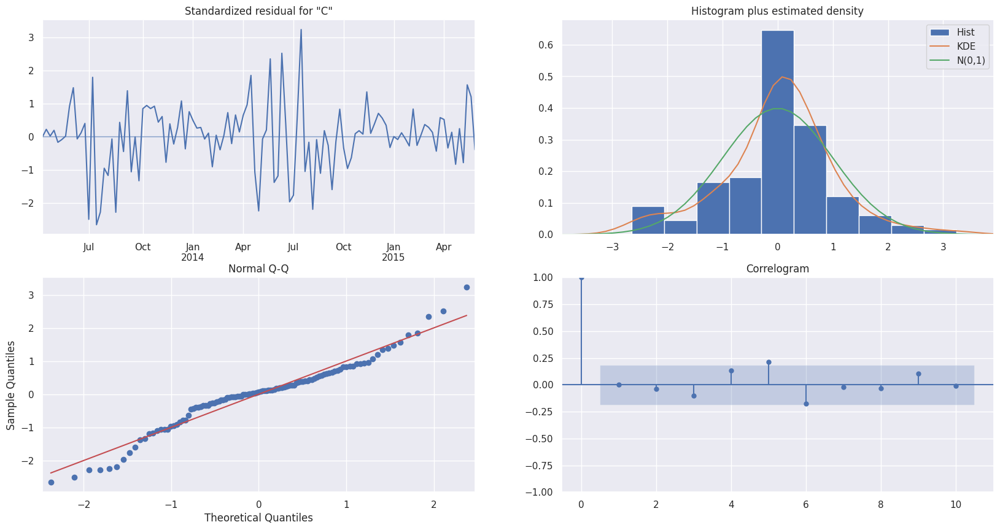

Results of Dickey-Fuller test: 

Test Statistic                  -4.114789
p-value                          0.000915
#Lags Used                       5.000000
Number of Observations Used    120.000000
Critical Value (1%)             -3.486056
Critical Value (5%)             -2.885943
Critical Value (10%)            -2.579785
dtype: float64


In [114]:
sarimax_mo.plot_diagnostics(figsize=(20, 10))
plt.show()
# Make a df of residuals
residuals = pd.DataFrame(sarimax_mo.resid)
residuals.dropna(inplace=True)
#Run Dickey-Fuller Test
dftest = adfuller(residuals)
dfoutput = pd.Series(dftest[0:4], index=['Test Statistic',\
        'p-value', '#Lags Used', 'Number of Observations Used'])
for key,value in dftest[4].items():
    dfoutput['Critical Value (%s)'%key] = value
print ('Results of Dickey-Fuller test: \n')
print(dfoutput)

***Cool!***

Our residuals look pretty noisy even with a few spikes, they are stationary (ala the DF test), and our distribution is pretty guassian, thought a little left tail heavy.

###### Cross Validation

In [115]:
train_with_ind = train.reset_index()
cv=[]
for train_ind, val_ind in split.split(train_with_ind):
    #fitting on the train from the train-validation split
    ar = SARIMAX(endog=train_with_ind.iloc[train_ind, -1],order=(0, 1, 3),seasonal_order=(0,1,1,12)).fit()
    #predicting on the validation part of the sample
    preds = ar.predict(typ='levels', start=val_ind[0], end=val_ind[-1])
    true = train_with_ind.iloc[val_ind, -1]
    cv.append(round(np.sqrt(mean_squared_error(true, preds)),2))
    #comparing validation and predictions on validation
    print(np.sqrt(mean_squared_error(true, preds)))

7.316206036216252
1.7738921845100692
3.9256301037885457
1.5555199196526868
1.6833394115823457


In [116]:
mean=round(np.mean(cv),2)
print(f'Mean of RMSE after cross validation: {mean}')

Mean of RMSE after cross validation: 3.25


##### Predictions on Test Set

Now we are going to go ahead and run some predictions on the test set. We haven't used any of the test data to train, so this should give us an idea on how well our model will work outside the training set. 

In [117]:
#Fit the model
sari_mod =SARIMAX(train,
                  order=(0, 1, 3),
                  seasonal_order=(0, 1, 1, 12),
                  enforce_stationarity=False,
                  enforce_invertibility=False).fit()

In [118]:
#make some calculations we will need later
for train_ind, val_ind in split.split(train_with_ind):
    sarimax = SARIMAX(endog=train_with_ind.iloc[train_ind, -1],
                      order=(0, 1, 3),
                     seasonal_order=(0, 1, 1, 12),
                     enforce_stationarity=False,
                     enforce_invertibility=False).fit()
    preds = sarimax.predict(typ='levels', start=val_ind[0], end=val_ind[-1])
    true = train_with_ind.iloc[val_ind, -1]
    print(np.sqrt(mean_squared_error(true, preds)))

6.687764235666024
1.93549191658278
3.922052991554018
1.5579464569133077
1.725706896588255


Let's plot the model against our test.

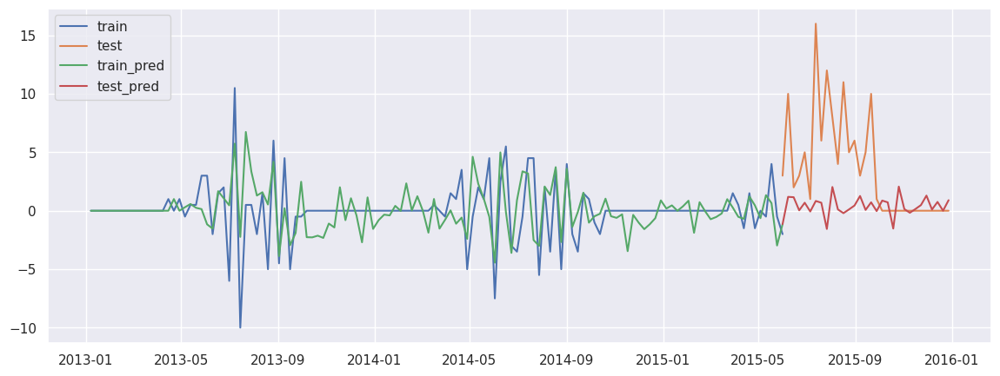

In [119]:
y_hat_train = sari_mod.predict(typ='levels')
y_hat_test = sari_mod.predict(start=test.index[0], end=test.index[-1],typ='levels')

fig, ax = plt.subplots()
ax.plot(train, label='train')
ax.plot(test, label='test')
ax.plot(y_hat_train, label='train_pred')
ax.plot(y_hat_test, label='test_pred')

plt.legend();

In [120]:
sari_mod = SARIMAX(train,
                  order=(0, 1, 3),
                  seasonal_order=(0, 1, 1, 12),
                  enforce_stationarity=False,
                  enforce_invertibility=False).fit()

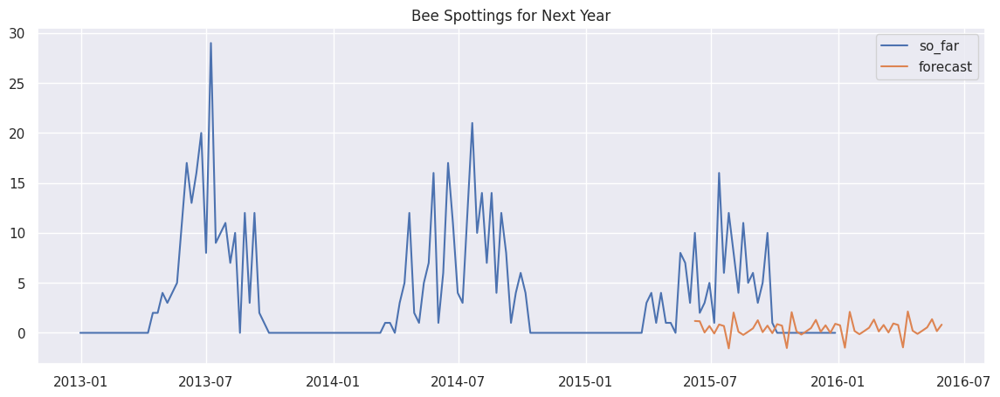

In [121]:
forecast = sari_mod.forecast(steps=52)
fig, ax = plt.subplots()
ax.plot(muscorum, label='so_far')
ax.plot(forecast, label='forecast')
ax.set_title('Bee Spottings for Next Year')

plt.legend();

I'm actually pretty surprised at how poorly this model is running. We can see that the prediction doesn't change from the winter months we would expect 0 to the spring months where we would expect the bees to emerge.

#### Model #4:  Meta's Prophet<a id='proph'></a>

Now we're going to get wild and try something a little different. We are going to try out Metas Prophet and see how it fairs.

Prophet uses an additive model where non-linear trends are fit with yearly, weekly, and daily seasonality, plus holiday effects to help make predictions with time series data. It's especially great with data that has strong seasonal effects and several seasons of historical data.

Sounds right up our alley!

In [122]:
from prophet import Prophet as ph
from prophet.plot import plot_plotly, plot_components_plotly
#rename some data - make a copy first, then rename
train_df = pd.DataFrame(train)
train_df['ds'] = train_df.index
data = train_df.rename(columns={'Count': 'y'})
#name that model!
model = ph()
#fit it!
pro_model = model.fit(data)


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp689kvv81/ua064biz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp689kvv81/s4z9x01j.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=62318', 'data', 'file=/tmp/tmp689kvv81/ua064biz.json', 'init=/tmp/tmp689kvv81/s4z9x01j.json', 'output', 'file=/tmp/tmp689kvv81/prophet_modeldvzllh7x/prophet_model-20230405180545.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:05:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:05:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Make some future dates in a dataframe!

In [123]:
future_dates = model.make_future_dataframe(periods=80,freq='W')
future_dates.tail(10)

,ds
196,2016-10-09
197,2016-10-16
198,2016-10-23
199,2016-10-30
200,2016-11-06
201,2016-11-13
202,2016-11-20
203,2016-11-27
204,2016-12-04
205,2016-12-11


Use those futures dates and put them through the model to make some actual predictions.

In [124]:
future = model.predict(future_dates)

In [125]:
future[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(10)

,ds,yhat,yhat_lower,yhat_upper
196,2016-10-09,-1.082436,-4.255349,2.012924
197,2016-10-16,-1.292330,-4.490288,1.709450
198,2016-10-23,-1.489776,-4.751109,1.450571
199,2016-10-30,-1.290148,-4.397990,1.857766
200,2016-11-06,-0.860811,-3.782946,2.300460
201,2016-11-13,-0.680416,-3.805198,2.367016
202,2016-11-20,-0.922063,-4.151076,2.326353
203,2016-11-27,-1.244340,-4.350852,1.981821
204,2016-12-04,-1.232843,-4.370250,1.912147
205,2016-12-11,-0.916071,-4.422690,2.027354


And now we plot it!

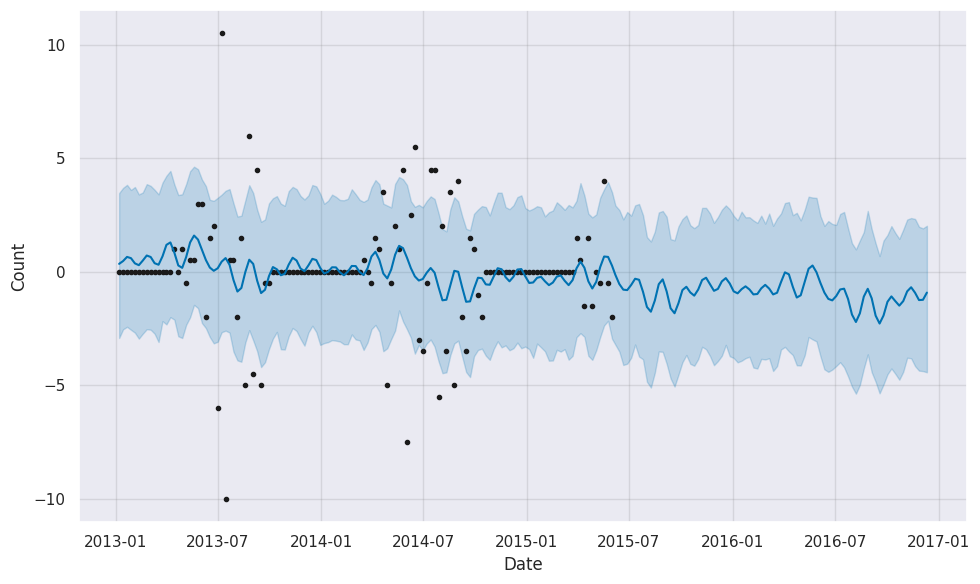

In [126]:
fig2 = model.plot(future, ylabel=("Count"), xlabel=("Date"))


Hmmm, it looks like the model is predicting a lowering population. Let's use an interactive model to get a closer look. 

In [127]:
plot_plotly(model, future, ylabel=("Count"), xlabel=("Date"))

In [128]:
# calculate RMSE between expected and predicted values
y_true = data['y'].values
y_pred = future['yhat'][:126].values
rms = mean_squared_error(y_true, y_pred, squared=False)
print('RMSE: %.3f' % rms)

RMSE: 2.469


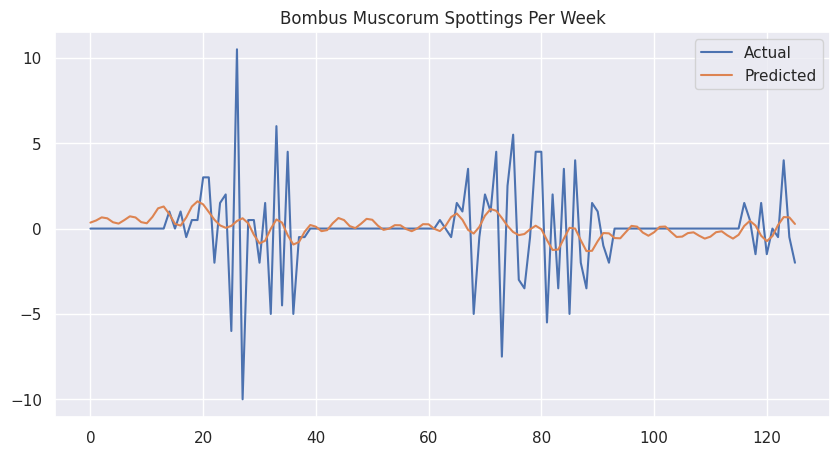

In [129]:
plt.figure(figsize=(10,5))
# plot expected vs actual
plt.plot(y_true, label='Actual')
plt.plot(y_pred, label='Predicted')
plt.title("Bombus Muscorum Spottings Per Week")
plt.grid(True)
plt.legend()
plt.show()

#### Results
This model looks really promising, but it's RMSE is quite higher than our other models. However, it does a great job of spotting the trends, rather than just going off into a trend that doesn't respect the seasonality. 

### Apis Mellifera - European Dark Bee<a id='lr'></a>

#### Model #1: Baseline Model

To start, we will build a baseline naive model, which predicts the data to be equal to the day before, via a shift to the original time series.

In [130]:
#basic naive model
naive = train_apis.shift(1)
naive

Week
2013-01-07    NaN
2013-01-14    0.0
2013-01-21    0.0
2013-01-28    0.0
2013-02-04    0.0
             ... 
2015-05-04   -5.0
2015-05-11   -1.0
2015-05-18    2.5
2015-05-25    3.5
2015-06-01   -2.0
Name: Count, Length: 126, dtype: float64

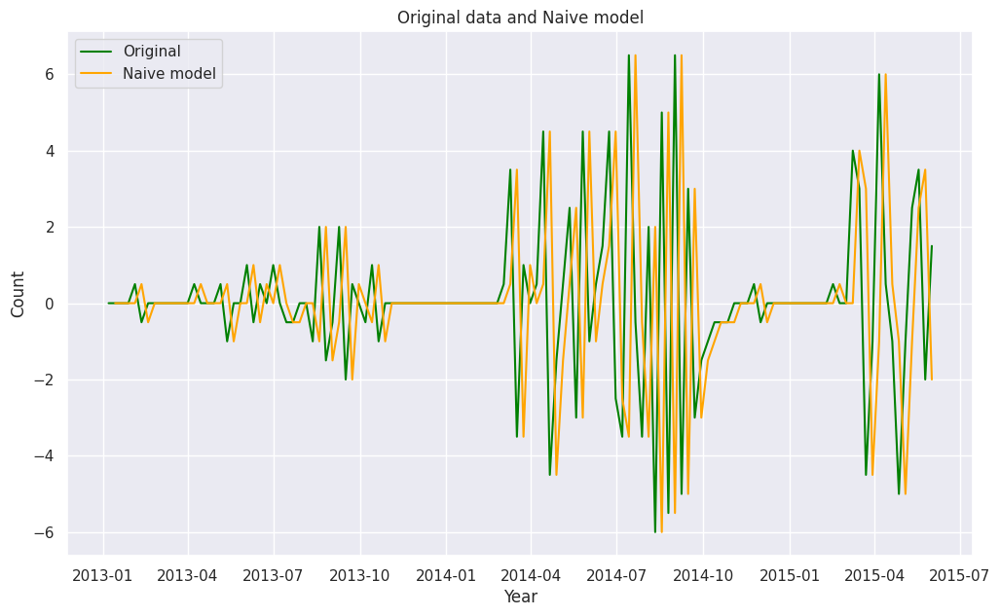

In [131]:
fig = plt.figure(figsize=(12,7))
sns.set(font_scale=1)
plt.plot(train_apis, color='green', label='Original')
plt.plot(naive, color='orange', label='Naive model')
plt.legend(loc='best')
plt.title('Original data and Naive model')
plt.xlabel("Year", )
plt.ylabel("Count")
plt.show(block=False)

To compare to future models, we can calculate this models RMSE, or The Root Mean Squared Error.

The Root Mean Squared Error calculates the difference between the value predicted by our model and the true value, making it a great judge, though it offers no safeguards from overfitting.

In [132]:
RMSE_naiv=round(np.sqrt(mean_squared_error(train_apis[1:], naive.dropna())),2)
print(f'The RMSE for the naive baseline model is in Count: {RMSE_naiv}')


The RMSE for the naive baseline model is in Count: 3.54


#### Model #2: ARMA (Auto-Regressive Moving Average) Model

An autoregression model uses data from the same input variable at previous time steps.

In [133]:
#Simple model with our order of 1 
mod_ar = ARIMA(train_apis, order=(1,0,0))
# Fit
res_ar = mod_ar.fit()
# Print out model summary
print(res_ar.summary())

                               SARIMAX Results                                
Dep. Variable:                  Count   No. Observations:                  126
Model:                 ARIMA(1, 0, 0)   Log Likelihood                -257.335
Date:                Wed, 05 Apr 2023   AIC                            520.671
Time:                        18:05:48   BIC                            529.179
Sample:                    01-07-2013   HQIC                           524.127
                         - 06-01-2015                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0522      0.117      0.446      0.656      -0.177       0.282
ar.L1         -0.4389      0.054     -8.138      0.000      -0.545      -0.333
sigma2         3.4733      0.313     11.090      0.0

In [134]:
y_hat = res_ar.predict(typ='levels')
RMSE_ARIMA1 = np.sqrt(mean_squared_error(train_apis, y_hat))
print(f'The RMSE for the ARIMA(1,0,0) model: {RMSE_ARIMA1}')
RMSE_AIC1 = res_ar.aic
print(f'The AIC for the ARIMA(1,0,0) model: {RMSE_AIC1}')

The RMSE for the ARIMA(1,0,0) model: 1.8636862509507832
The AIC for the ARIMA(1,0,0) model: 520.6705475233132


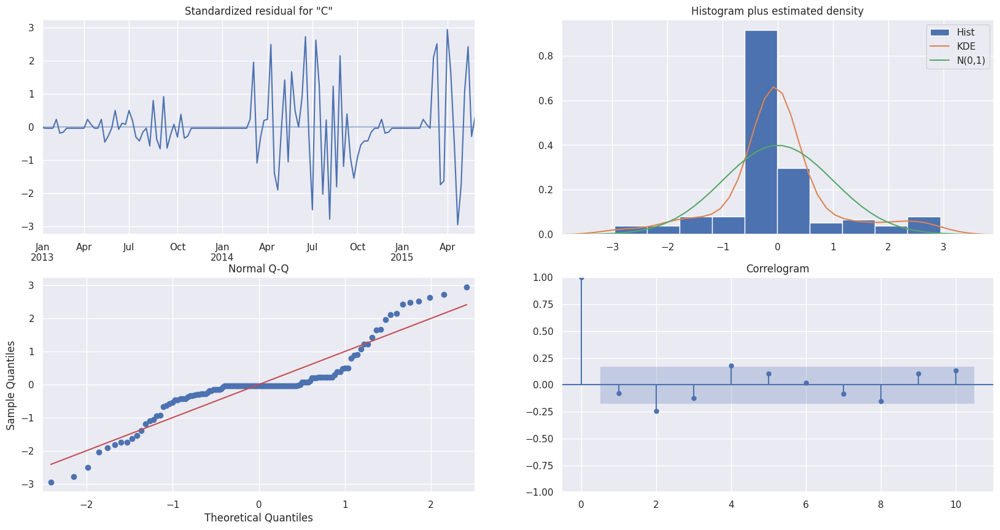

Results of Dickey-Fuller test: 

Test Statistic                  -4.114789
p-value                          0.000915
#Lags Used                       5.000000
Number of Observations Used    120.000000
Critical Value (1%)             -3.486056
Critical Value (5%)             -2.885943
Critical Value (10%)            -2.579785
dtype: float64
1.0000001075661982
1.0967047092151119
3.311879970438571
2.23170035622935
2.5307640608454793
Mean of RMSE after cross validation: 2.03


In [135]:
#plotting residuals 
res_ar.plot_diagnostics(figsize=(20,10))
plt.show()

#Run Dickey-Fuller Test
dftest = adfuller(residuals)
dfoutput = pd.Series(dftest[0:4], index=['Test Statistic',\
        'p-value', '#Lags Used', 'Number of Observations Used'])
for key,value in dftest[4].items():
    dfoutput['Critical Value (%s)'%key] = value
print ('Results of Dickey-Fuller test: \n')
print(dfoutput)
#Cross Validation
train_apis_with_ind = train_apis.reset_index()
cv=[]
for train_apis_ind, val_ind in split.split(train_apis_with_ind):
    #fitting on the train_apis from the train_apis-validation split
    ar = ARIMA(endog=train_apis_with_ind.iloc[train_apis_ind, -1], order=(1, 0, 0)).fit()
    #predicting on the validation part of the sample
    preds = ar.predict(typ='levels', start=val_ind[0], end=val_ind[-1])
    true = train_apis_with_ind.iloc[val_ind, -1]
    cv.append(round(np.sqrt(mean_squared_error(true, preds)),2))
    #comparing validation and predictions on validation
    print(np.sqrt(mean_squared_error(true, preds)))
mean=round(np.mean(cv),2)
print(f'Mean of RMSE after cross validation: {mean}')

Looking at these diagnostics tells me that this isn't a super great model. The residuals are stationary, but there isn't a lot of extremes in there. Let's tweak and see if we can do better.

##### Second ARIMA Model

In [136]:
#Upping our order
mod_ar = ARIMA(train_apis, order=(2,0,1))
# Fit
res_ar = mod_ar.fit()
# Print out model summary
print(res_ar.summary())


                               SARIMAX Results                                
Dep. Variable:                  Count   No. Observations:                  126
Model:                 ARIMA(2, 0, 1)   Log Likelihood                -253.136
Date:                Wed, 05 Apr 2023   AIC                            516.272
Time:                        18:05:50   BIC                            530.453
Sample:                    01-07-2013   HQIC                           522.033
                         - 06-01-2015                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0499      0.083      0.604      0.546      -0.112       0.212
ar.L1         -0.0536      0.177     -0.302      0.762      -0.401       0.294
ar.L2         -0.0066      0.115     -0.057      0.9

In [137]:
y_hat = res_ar.predict(typ='levels')
RMSE_ARIMA1 = np.sqrt(mean_squared_error(train_apis, y_hat))
print(f'The RMSE for the ARIMA(2,0,1) model: {RMSE_ARIMA1}')
RMSE_AIC1 = res_ar.aic
print(f'The AIC for the ARIMA(2,0,1) model: {RMSE_AIC1}')

The RMSE for the ARIMA(2,0,1) model: 1.801471558549387
The AIC for the ARIMA(2,0,1) model: 516.2718092007822


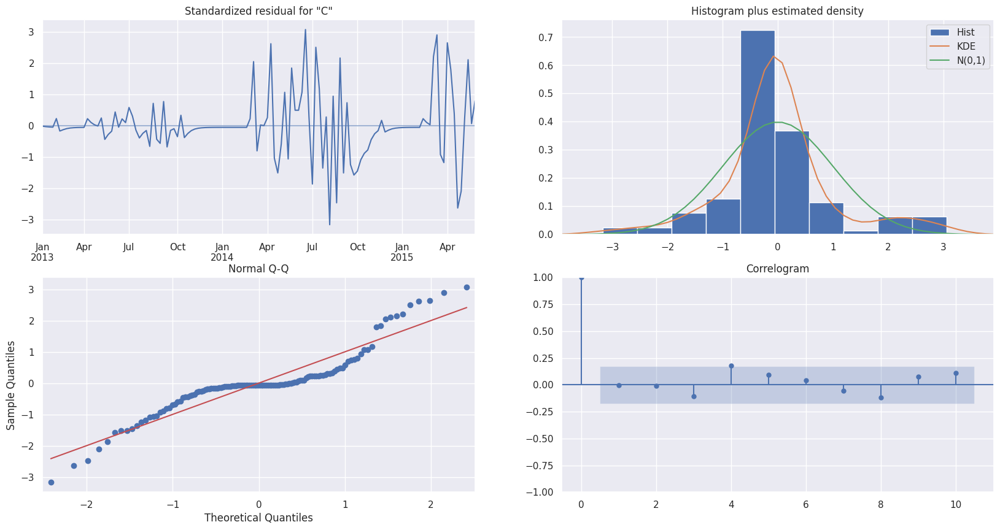

Results of Dickey-Fuller test: 

Test Statistic                  -4.114789
p-value                          0.000915
#Lags Used                       5.000000
Number of Observations Used    120.000000
Critical Value (1%)             -3.486056
Critical Value (5%)             -2.885943
Critical Value (10%)            -2.579785
dtype: float64
0.9931356581673997
1.0983779640303315
3.1423923111334457
2.6344840937273584
2.5307652528410016
Mean of RMSE after cross validation: 2.08


In [138]:
#Plotting Residuals 
res_ar.plot_diagnostics(figsize=(20,10))
plt.show()
#Run Dickey-Fuller Test
dftest = adfuller(residuals)
dfoutput = pd.Series(dftest[0:4], index=['Test Statistic',\
        'p-value', '#Lags Used', 'Number of Observations Used'])
for key,value in dftest[4].items():
    dfoutput['Critical Value (%s)'%key] = value
print ('Results of Dickey-Fuller test: \n')
print(dfoutput)
#Cross Validation
train_apis_with_ind = train_apis.reset_index()
cv=[]
for train_apis_ind, val_ind in split.split(train_apis_with_ind):
    #fitting on the train_apis from the train_apis-validation split
    ar = ARIMA(endog=train_apis_with_ind.iloc[train_apis_ind, -1], order=(2,0,1)).fit()
    #predicting on the validation part of the sample
    preds = ar.predict(typ='levels', start=val_ind[0], end=val_ind[-1])
    true = train_apis_with_ind.iloc[val_ind, -1]
    cv.append(round(np.sqrt(mean_squared_error(true, preds)),2))
    #comparing validation and predictions on validation
    print(np.sqrt(mean_squared_error(true, preds)))
mean=round(np.mean(cv),2)
print(f'Mean of RMSE after cross validation: {mean}')

##### Hmmm...
Our model has slightly improved with a lower AIC and the lowest RSME as of yet. Our residuals are still stationary, and our distribution looks a little pointy but still Guassian.

Still, I wonder if we can do better. Let's do a grid search to find a combo with the lowest RSME we can, then we will run a summary and check the AIC again. 

##### Grid Search for best ARIMA hyperparameters

For this grid search, we will be using functions (thought tweaked for our use) from Jason Brownlees article "[How to Grid Search ARIMA Model Hyperparameters with Python](https://machinelearningmastery.com/grid-search-arima-hyperparameters-with-python/)."

In [139]:
# evaluate combinations of p, d and q values for an ARIMA model
def evaluate_models(dataset, p_values, d_values, q_values):
 #dataset = dataset.astype('float32')
 best_score, best_cfg = float("inf"), None
 for p in p_values:
  for d in d_values:
    for q in q_values:
      order = (p,d,q)
      try:
        model = ARIMA(dataset, order=order)
        model_fit = model.fit()
        y_hat = model_fit.predict(typ='levels')
        rmse = np.sqrt(mean_squared_error(train_apis, y_hat))
        if rmse < best_score:
          best_score, best_cfg = rmse, order
        print('ARIMA%s RMSE=%.3f' % (order,rmse))
      except:
        continue
  print('Best ARIMA%s RMSE=%.3f' % (best_cfg, best_score))

In [140]:
# evaluate parameters
p_values = [0, 1, 2, 4, 6, 8, 10]
d_values = range(0, 3)
q_values = range(0, 3)
warnings.filterwarnings("ignore")
evaluate_models(train_apis.values, p_values, d_values, q_values)

ARIMA(0, 0, 0) RMSE=2.077
ARIMA(0, 0, 1) RMSE=1.802
ARIMA(0, 0, 2) RMSE=1.801
ARIMA(0, 1, 0) RMSE=3.523
ARIMA(0, 1, 1) RMSE=2.090
ARIMA(0, 1, 2) RMSE=1.814
ARIMA(0, 2, 0) RMSE=6.434
ARIMA(0, 2, 1) RMSE=3.547
ARIMA(0, 2, 2) RMSE=2.113
Best ARIMA(0, 0, 2) RMSE=1.801
ARIMA(1, 0, 0) RMSE=1.864
ARIMA(1, 0, 1) RMSE=1.801
ARIMA(1, 0, 2) RMSE=1.792
ARIMA(1, 1, 0) RMSE=2.604
ARIMA(1, 1, 1) RMSE=1.875
ARIMA(1, 1, 2) RMSE=1.813
ARIMA(1, 2, 0) RMSE=4.050
ARIMA(1, 2, 1) RMSE=2.621
ARIMA(1, 2, 2) RMSE=1.901
Best ARIMA(1, 0, 2) RMSE=1.792
ARIMA(2, 0, 0) RMSE=1.837
ARIMA(2, 0, 1) RMSE=1.801
ARIMA(2, 0, 2) RMSE=1.792
ARIMA(2, 1, 0) RMSE=2.426
ARIMA(2, 1, 1) RMSE=1.849
ARIMA(2, 1, 2) RMSE=1.874
ARIMA(2, 2, 0) RMSE=3.559
ARIMA(2, 2, 1) RMSE=2.441
ARIMA(2, 2, 2) RMSE=1.877
Best ARIMA(2, 0, 2) RMSE=1.792
ARIMA(4, 0, 0) RMSE=1.763
ARIMA(4, 0, 1) RMSE=1.761
ARIMA(4, 0, 2) RMSE=1.710
ARIMA(4, 1, 0) RMSE=1.980
ARIMA(4, 1, 1) RMSE=1.774
ARIMA(4, 1, 2) RMSE=1.773
ARIMA(4, 2, 0) RMSE=2.703
ARIMA(4, 2, 1) RMSE=1.9

Looks like our best model parameters turned out the be (10, 0, 2) with an RMSE of 1.586. Let's run the model and check for it's AIC value.

##### Best ARIMA model

In [141]:
#Upping our order
mod_ar = ARIMA(train_apis, order=(10,0,2))
# Fit
res_ar = mod_ar.fit()
# Print out model summary
print(res_ar.summary())

                               SARIMAX Results                                
Dep. Variable:                  Count   No. Observations:                  126
Model:                ARIMA(10, 0, 2)   Log Likelihood                -244.370
Date:                Wed, 05 Apr 2023   AIC                            516.740
Time:                        18:06:21   BIC                            556.448
Sample:                    01-07-2013   HQIC                           532.872
                         - 06-01-2015                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0398      0.027      1.486      0.137      -0.013       0.092
ar.L1         -0.4121      0.303     -1.362      0.173      -1.005       0.181
ar.L2          0.5530      0.189      2.919      0.0

In [142]:
y_hat = res_ar.predict(typ='levels')
RMSE_ARIMA1 = np.sqrt(mean_squared_error(train_apis, y_hat))
print(f'The RMSE for the ARIMA(2,0,1) model: {RMSE_ARIMA1}')
RMSE_AIC1 = res_ar.aic
print(f'The AIC for the ARIMA(2,0,1) model: {RMSE_AIC1}')

The RMSE for the ARIMA(2,0,1) model: 1.6694724447331672
The AIC for the ARIMA(2,0,1) model: 516.740199876479


Interesting enough, our AIC only improved marginally from our previous model ARIMA(2, 0, 0) of 505. Still, this is our best model as of yet. Let's take a look at the diagnostics.

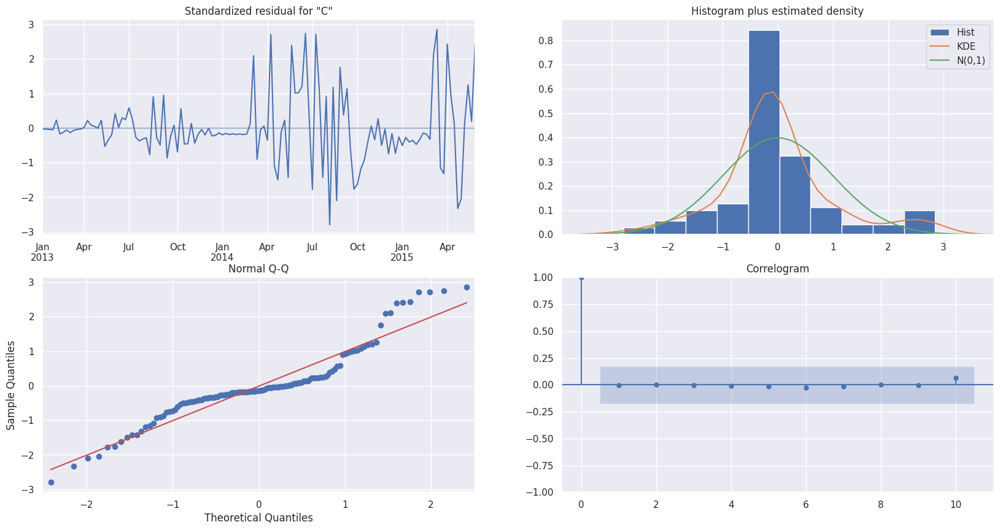

Results of Dickey-Fuller test: 

Test Statistic                  -4.114789
p-value                          0.000915
#Lags Used                       5.000000
Number of Observations Used    120.000000
Critical Value (1%)             -3.486056
Critical Value (5%)             -2.885943
Critical Value (10%)            -2.579785
dtype: float64
0.9726241498031948
1.1359861169313423
3.156090230029706
3.215895635206724
2.5268018368030836
Mean of RMSE after cross validation: 2.2


In [143]:
#plotting residuals 
res_ar.plot_diagnostics(figsize=(20,10))
plt.show()
#Run Dickey-Fuller Test
dftest = adfuller(residuals)
dfoutput = pd.Series(dftest[0:4], index=['Test Statistic',\
        'p-value', '#Lags Used', 'Number of Observations Used'])
for key,value in dftest[4].items():
    dfoutput['Critical Value (%s)'%key] = value
print ('Results of Dickey-Fuller test: \n')
print(dfoutput)
#Cross Validation
train_apis_with_ind = train_apis.reset_index()
cv=[]
for train_apis_ind, val_ind in split.split(train_apis_with_ind):
    #fitting on the train_apis from the train_apis-validation split
    ar = ARIMA(endog=train_apis_with_ind.iloc[train_apis_ind, -1], order=(10, 0, 2)).fit()
    #predicting on the validation part of the sample
    preds = ar.predict(typ='levels', start=val_ind[0], end=val_ind[-1])
    true = train_apis_with_ind.iloc[val_ind, -1]
    cv.append(round(np.sqrt(mean_squared_error(true, preds)),2))
    #comparing validation and predictions on validation
    print(np.sqrt(mean_squared_error(true, preds)))
mean=round(np.mean(cv),2)
print(f'Mean of RMSE after cross validation: {mean}')

Our RSME for our cross validation is 2.2, our residuals are still stationary, and while we have lower RSME, we have higher AIC than previous models. 

#### Model #3: SARIMAX<a id='rf'></a>

SARIMAX, or **S**easonal **A**uto-**R**egressive **I**ntegrated **M**oving **A**verage with e**X**ogenous factors, is an updated version of the ARIMA model but with 4 additional orders, but the first three are variations of the three orders of the ARIMA model with the fourth order being the length of the cycle being studied. Let's take a stab at it and see how it does. 

In [144]:
import statsmodels.api as sm
#Fitting the model
sarimax=sm.tsa.statespace.SARIMAX(train_apis,order=(1, 0, 0),seasonal_order=(1,0,0,12))
sarimax_mo=sarimax.fit()
# Print out model summary
print(sarimax_mo.summary())
#Get that RSME!
y_hat = sarimax_mo.predict(typ='levels')
RMSE_ARIMA1 = np.sqrt(mean_squared_error(train_apis, y_hat))
print(f'The RMSE for the SARIMAX(1,0,0)(1,0,0,12) model: {RMSE_ARIMA1}')

                                     SARIMAX Results                                      
Dep. Variable:                              Count   No. Observations:                  126
Model:             SARIMAX(1, 0, 0)x(1, 0, 0, 12)   Log Likelihood                -257.424
Date:                            Wed, 05 Apr 2023   AIC                            520.848
Time:                                    18:06:29   BIC                            529.357
Sample:                                01-07-2013   HQIC                           524.305
                                     - 06-01-2015                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4404      0.054     -8.140      0.000      -0.546      -0.334
ar.S.L12      -0.0166      0.103   

Not bad, essentially the same as our first ARIMA model. Let's do a gridsearch to really kick things into gear. 

##### Gridsearch Optimization for SARIMAX Model <a id='gscv_rf'></a>

Originally I attempted to replicate our earlier gridesearch code, expanding it to suit our new SARIMAX needs, but ran into some issues. So we are going to borrow some code from [Tuning and Forecasting with (S)ARIMA Models](https://mins.space/blog/2020-09-14-tuning-forecasting-sarima-models/) on SARIMAX grid searches. 

##### Gridsearch Definitions and Functions

In [145]:
#import
from itertools import product
#define our orders
ps = range(0, 2)
qs = range(3, 6)

p = 0
d = 1 
q = 4

Ps = range(0, 2)
Qs = range(0, 3)

P = 0
D = 1 
Q = 1
s = 12

parameters = product(ps, qs, Ps, Qs)
parameters_list = list(parameters)
len(parameters_list)

36

In [146]:
def gs_arima(series, parameters_list, d, D, s, opt_method='powell'):
    """
        Return dataframe with parameters and corresponding AIC, and the best model according to AIC
        
        parameters_list - list with (p, q, P, Q) tuples
        d - integration order in ARIMA model
        D - seasonal integration order 
        s - length of season
    """
    
    results = []
    models = {}
    best_aic = float("inf")

    for param in parameters_list:
        # we need try-except because on some combinations model might fail to converge
        try:
            model = sm.tsa.statespace.SARIMAX(
                series, 
                order=(param[0], d, param[1]), 
                seasonal_order=(param[2], D, param[3], s)).fit(method=opt_method, disp=False)
        except:
            continue

        aic = model.aic
        if aic < best_aic:
            best_model = model
            best_aic = aic
            best_param = param
        results.append([param, model.aic])

    result_table = pd.DataFrame(results)
    result_table.columns = ['parameters', 'aic']
    result_table = result_table.sort_values(by='aic', ascending=True).reset_index(drop=True)
    
    return result_table, best_model

##### Gridsearch in Action

In [147]:
result_table, best_model = gs_arima(train_apis, parameters_list, d, D, s)

In [148]:
result_table.head()

,parameters,aic
0,"(0, 5, 0, 2)",505.366863
1,"(0, 5, 1, 1)",505.649592
2,"(0, 5, 0, 1)",505.896575
3,"(1, 5, 0, 2)",506.819959
4,"(1, 5, 0, 1)",507.220488


In [149]:
# Print out model summary
print(best_model.summary())

                                        SARIMAX Results                                        
Dep. Variable:                                   Count   No. Observations:                  126
Model:             SARIMAX(0, 1, 5)x(0, 1, [1, 2], 12)   Log Likelihood                -244.683
Date:                                 Wed, 05 Apr 2023   AIC                            505.367
Time:                                         18:08:41   BIC                            527.186
Sample:                                     01-07-2013   HQIC                           514.221
                                          - 06-01-2015                                         
Covariance Type:                                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -1.5520      0.736     -2.109      0.035      -2.994      -0

##### Best SARIMAX Model

In [150]:
#Fitting the model
sarimax=sm.tsa.statespace.SARIMAX(train_apis,order=(0, 1, 5),seasonal_order=(0,1,2,12))
sarimax_mo=sarimax.fit()
# Print out model summary
print(sarimax_mo.summary())
#Get that RSME!
y_hat = sarimax_mo.predict(typ='levels')
RMSE_sarimax_mo = np.sqrt(mean_squared_error(train_apis, y_hat))
print(f'The RMSE for the SARIMAX(0, 1, 5)(0,1,2,12) model: {RMSE_sarimax_mo}')

                                        SARIMAX Results                                        
Dep. Variable:                                   Count   No. Observations:                  126
Model:             SARIMAX(0, 1, 5)x(0, 1, [1, 2], 12)   Log Likelihood                -244.667
Date:                                 Wed, 05 Apr 2023   AIC                            505.335
Time:                                         18:08:48   BIC                            527.154
Sample:                                     01-07-2013   HQIC                           514.189
                                          - 06-01-2015                                         
Covariance Type:                                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -1.5504      2.999     -0.517      0.605      -7.428       4

With an AIC lower than any other model yet, I'd say we are on a good start. Let's take a look at the residuals for a moment.

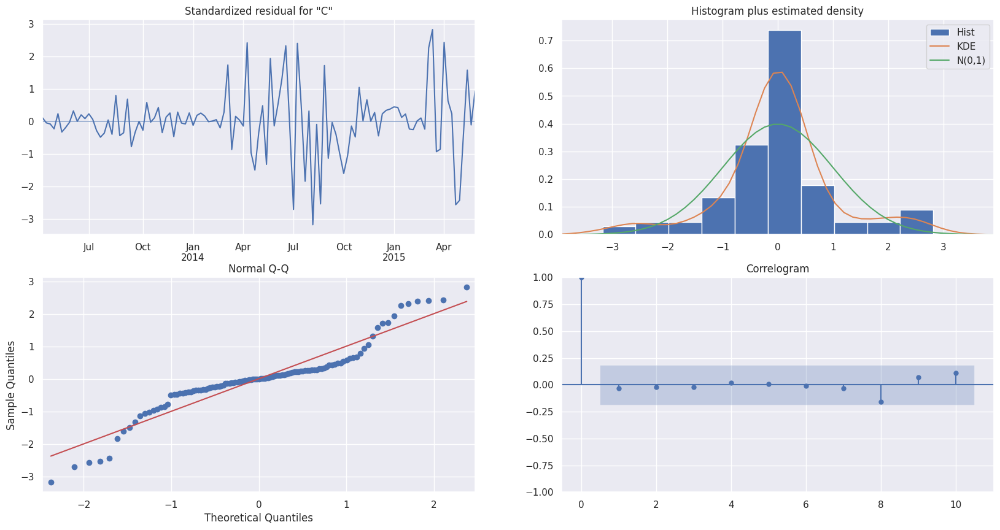

Results of Dickey-Fuller test: 

Test Statistic                -1.152173e+01
p-value                        4.024827e-21
#Lags Used                     0.000000e+00
Number of Observations Used    1.250000e+02
Critical Value (1%)           -3.483779e+00
Critical Value (5%)           -2.884954e+00
Critical Value (10%)          -2.579257e+00
dtype: float64


In [151]:
sarimax_mo.plot_diagnostics(figsize=(20, 10))
plt.show()
# Make a df of residuals
residuals = pd.DataFrame(sarimax_mo.resid)
residuals.dropna(inplace=True)
#Run Dickey-Fuller Test
dftest = adfuller(residuals)
dfoutput = pd.Series(dftest[0:4], index=['Test Statistic',\
        'p-value', '#Lags Used', 'Number of Observations Used'])
for key,value in dftest[4].items():
    dfoutput['Critical Value (%s)'%key] = value
print ('Results of Dickey-Fuller test: \n')
print(dfoutput)

***Cool!***

Our residuals look pretty noisy even with a few spikes, they are stationary (ala the DF test), and our distribution is pretty guassian, thought a little left tail heavy.

###### Cross Validation

In [152]:
train_apis_with_ind = train_apis.reset_index()
cv=[]
for train_apis_ind, val_ind in split.split(train_apis_with_ind):
    #fitting on the train_apis from the train_apis-validation split
    ar = SARIMAX(endog=train_apis_with_ind.iloc[train_apis_ind, -1],order=(0, 1, 3),seasonal_order=(0,1,1,12)).fit()
    #predicting on the validation part of the sample
    preds = ar.predict(typ='levels', start=val_ind[0], end=val_ind[-1])
    true = train_apis_with_ind.iloc[val_ind, -1]
    cv.append(round(np.sqrt(mean_squared_error(true, preds)),2))
    #comparing validation and predictions on validation
    print(np.sqrt(mean_squared_error(true, preds)))

1.046125650758418
1.1220540899763762
3.3431717219933725
3.1741481173404105
2.853733866007864


In [153]:
mean=round(np.mean(cv),2)
print(f'Mean of RMSE after cross validation: {mean}')

Mean of RMSE after cross validation: 2.31


#### Model #4:  Meta's Prophet<a id='proph'></a>

Let's try the same data in Metas Prophet.

In [154]:
#rename some data - make a copy first, then rename
train_apis_df = pd.DataFrame(train_apis_orig)
train_apis_df['ds'] = train_apis_df.index
data = train_apis_df.rename(columns={'Count': 'y'})
#name that model!
model = ph()
#fit it!
pro_model = model.fit(data)


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp689kvv81/a430rw6d.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp689kvv81/j3aky1xs.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=43215', 'data', 'file=/tmp/tmp689kvv81/a430rw6d.json', 'init=/tmp/tmp689kvv81/j3aky1xs.json', 'output', 'file=/tmp/tmp689kvv81/prophet_modeldhlo2eiz/prophet_model-20230405180853.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:08:53 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:08:53 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Like before, let's make a df of future dates, then run them through the model to get a prediction. 

In [155]:
future_dates = model.make_future_dataframe(periods=60,freq='W')
future = model.predict(future_dates)

In [156]:
future[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(10)

,ds,yhat,yhat_lower,yhat_upper
177,2016-05-22,14.720678,10.277538,19.417817
178,2016-05-29,15.529384,10.939518,20.035993
179,2016-06-05,15.565195,11.077773,20.059973
180,2016-06-12,16.214103,11.467651,20.383983
181,2016-06-19,17.881163,13.352176,22.370219
182,2016-06-26,19.572534,15.165482,24.143376
183,2016-07-03,20.258138,15.655788,24.968710
184,2016-07-10,20.083092,15.374060,24.603850
185,2016-07-17,19.888032,15.628896,24.743463
186,2016-07-24,19.852176,15.595188,24.502561


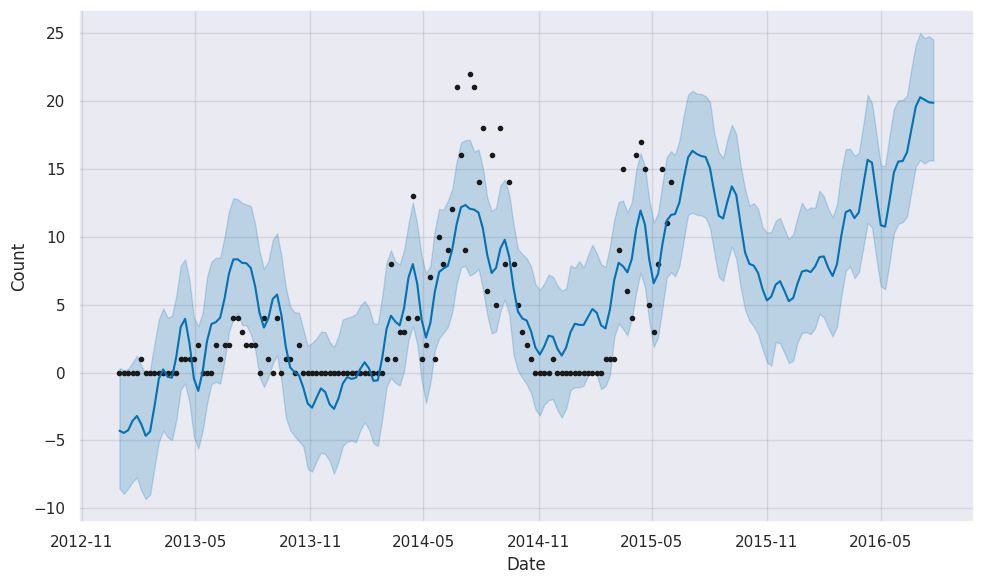

In [157]:
fig2 = model.plot(future, xlabel="Date", ylabel="Count")

In [158]:
plot_plotly(model, future, xlabel="Date", ylabel="Count")

In [159]:
# calculate RMSE between expected and predicted values
y_true = data['y'].values
y_pred = future['yhat'][:127].values
rms = mean_squared_error(y_true, y_pred, squared=False)
print('RMSE: %.3f' % rms)

RMSE: 3.592


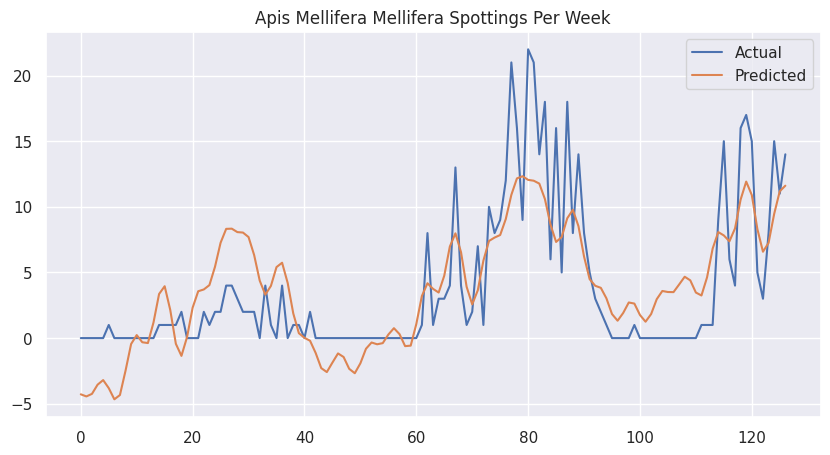

In [160]:
plt.figure(figsize=(10,5))
# plot expected vs actual
plt.plot(y_true, label='Actual')
plt.plot(y_pred, label='Predicted')
plt.title("Apis Mellifera Mellifera Spottings Per Week")
plt.grid(True)
plt.legend()
plt.show()

#### Results
This model looks promising, though perhaps not the best. It seems to have a hard time picking up the bees dormant periods, but it is showing a steady increase, which is great. RMSE is only marginally higher than our other models. 

### Andrena haemorrhoa - Orange Tailed Mining Bee
<a id='lr'></a>

#### Model #1: Baseline Model

To start, we will build a baseline naive model, which predicts the data to be equal to the day before, via a shift to the original time series.

In [161]:
#basic naive model
naive = train_andrena.shift(1)
naive

Week
2012-12-31    NaN
2013-01-07    0.0
2013-01-14    0.0
2013-01-21    0.0
2013-01-28    0.0
             ... 
2015-05-04    3.0
2015-05-11    1.0
2015-05-18    3.0
2015-05-25    7.0
2015-06-01    4.0
Name: Count, Length: 127, dtype: float64

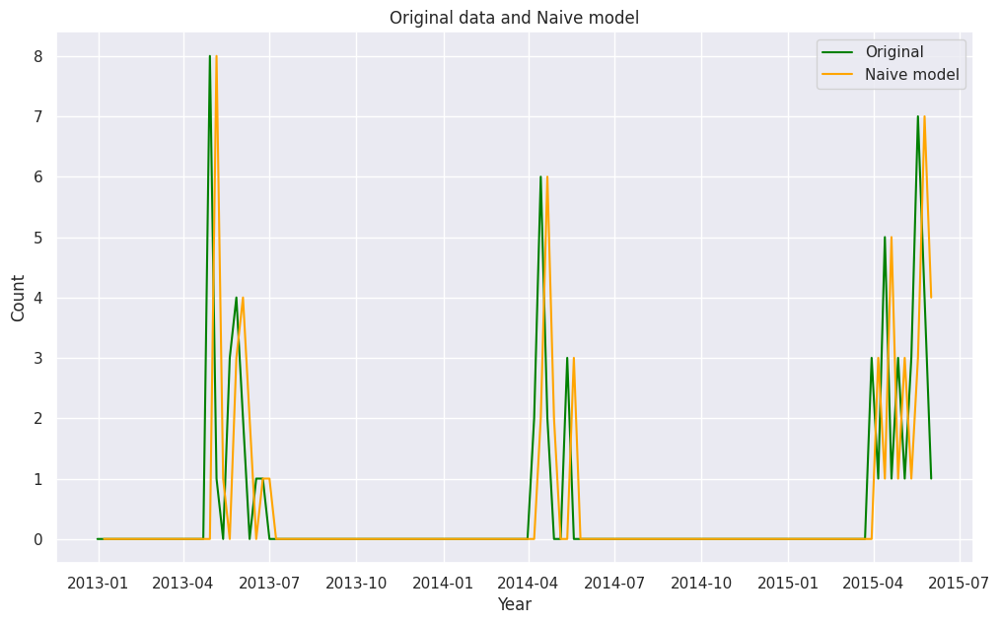

In [162]:
fig = plt.figure(figsize=(12,7))
sns.set(font_scale=1)
plt.plot(train_andrena, color='green', label='Original')
plt.plot(naive, color='orange', label='Naive model')
plt.legend(loc='best')
plt.title('Original data and Naive model')
plt.xlabel("Year", )
plt.ylabel("Count")
plt.show(block=False)

To compare to future models, we can calculate this models RMSE, or The Root Mean Squared Error.

The Root Mean Squared Error calculates the difference between the value predicted by our model and the true value, making it a great judge, though it offers no safeguards from overfitting.

In [163]:
RMSE_naiv=round(np.sqrt(mean_squared_error(train_andrena[1:], naive.dropna())),2)
print(f'The RMSE for the naive baseline model is in Count: {RMSE_naiv}')


The RMSE for the naive baseline model is in Count: 1.5


#### Model #2: ARMA (Auto-Regressive Moving Average) Model

An autoregression model uses data from the same input variable at previous time steps.

In [164]:
#Simple model with our order of 1 
mod_ar = ARIMA(train_andrena, order=(1,0,0))
# Fit
res_ar = mod_ar.fit()
# Print out model summary
print(res_ar.summary())

                               SARIMAX Results                                
Dep. Variable:                  Count   No. Observations:                  127
Model:                 ARIMA(1, 0, 0)   Log Likelihood                -209.007
Date:                Wed, 05 Apr 2023   AIC                            424.014
Time:                        18:08:56   BIC                            432.546
Sample:                    12-31-2012   HQIC                           427.481
                         - 06-01-2015                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4883      0.493      0.990      0.322      -0.479       1.455
ar.L1          0.4064      0.074      5.489      0.000       0.261       0.551
sigma2         1.5717      0.161      9.765      0.0

In [165]:
y_hat = res_ar.predict(typ='levels')
RMSE_ARIMA1 = np.sqrt(mean_squared_error(train_andrena, y_hat))
print(f'The RMSE for the ARIMA(1,0,0) model: {RMSE_ARIMA1}')
RMSE_AIC1 = res_ar.aic
print(f'The AIC for the ARIMA(1,0,0) model: {RMSE_AIC1}')

The RMSE for the ARIMA(1,0,0) model: 1.2537929649673833
The AIC for the ARIMA(1,0,0) model: 424.01385684592503


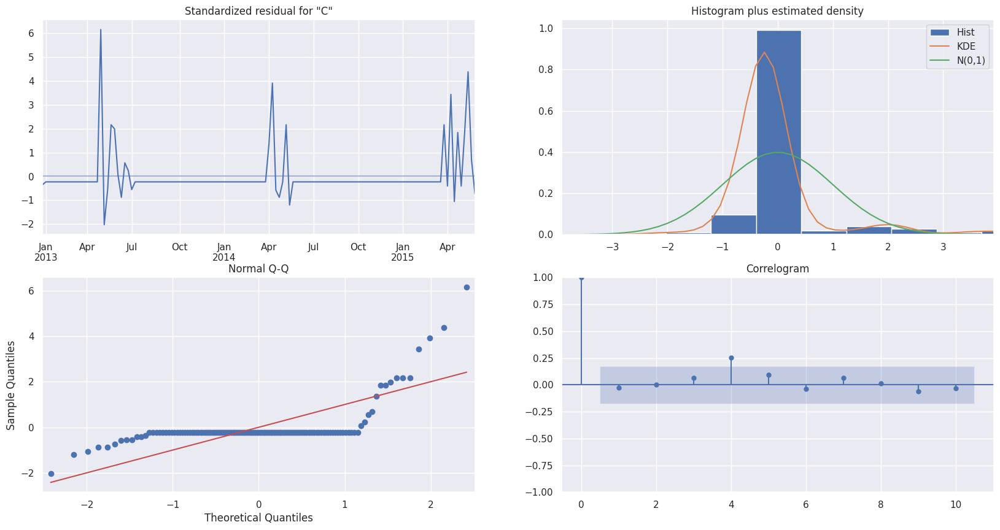

Results of Dickey-Fuller test: 

Test Statistic                -1.152173e+01
p-value                        4.024827e-21
#Lags Used                     0.000000e+00
Number of Observations Used    1.250000e+02
Critical Value (1%)           -3.483779e+00
Critical Value (5%)           -2.884954e+00
Critical Value (10%)          -2.579257e+00
dtype: float64
0.7196703772561373
0.4533896451758707
1.4951480571954252
0.3777770991304426
2.236281147592318
Mean of RMSE after cross validation: 1.06


In [166]:
#plotting residuals 
res_ar.plot_diagnostics(figsize=(20,10))
plt.show()

#Run Dickey-Fuller Test
dftest = adfuller(residuals)
dfoutput = pd.Series(dftest[0:4], index=['Test Statistic',\
        'p-value', '#Lags Used', 'Number of Observations Used'])
for key,value in dftest[4].items():
    dfoutput['Critical Value (%s)'%key] = value
print ('Results of Dickey-Fuller test: \n')
print(dfoutput)
#Cross Validation
train_andrena_with_ind = train_andrena.reset_index()
cv=[]
for train_andrena_ind, val_ind in split.split(train_andrena_with_ind):
    #fitting on the train_andrena from the train_andrena-validation split
    ar = ARIMA(endog=train_andrena_with_ind.iloc[train_andrena_ind, -1], order=(1, 0, 0)).fit()
    #predicting on the validation part of the sample
    preds = ar.predict(typ='levels', start=val_ind[0], end=val_ind[-1])
    true = train_andrena_with_ind.iloc[val_ind, -1]
    cv.append(round(np.sqrt(mean_squared_error(true, preds)),2))
    #comparing validation and predictions on validation
    print(np.sqrt(mean_squared_error(true, preds)))
mean=round(np.mean(cv),2)
print(f'Mean of RMSE after cross validation: {mean}')

Looking at these diagnostics tells me that this isn't a super great model, but it is not the models fault. No, it really is due to how few sightings we have. Because the majority of the year has no sightings, our distribution is super pointy. The residuals are stationary. Let's tweak and see if we can do better.

##### Second ARIMA Model

In [167]:
#Upping our order
mod_ar = ARIMA(train_andrena, order=(2,0,1))
# Fit
res_ar = mod_ar.fit()
# Print out model summary
print(res_ar.summary())


                               SARIMAX Results                                
Dep. Variable:                  Count   No. Observations:                  127
Model:                 ARIMA(2, 0, 1)   Log Likelihood                -206.387
Date:                Wed, 05 Apr 2023   AIC                            422.775
Time:                        18:08:57   BIC                            436.996
Sample:                    12-31-2012   HQIC                           428.553
                         - 06-01-2015                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5532      1.000      0.553      0.580      -1.407       2.513
ar.L1          0.9621      0.239      4.019      0.000       0.493       1.431
ar.L2         -0.0798      0.141     -0.567      0.5

In [168]:
y_hat = res_ar.predict(typ='levels')
RMSE_ARIMA1 = np.sqrt(mean_squared_error(train_andrena, y_hat))
print(f'The RMSE for the ARIMA(2,0,1) model: {RMSE_ARIMA1}')
RMSE_AIC1 = res_ar.aic
print(f'The AIC for the ARIMA(2,0,1) model: {RMSE_AIC1}')

The RMSE for the ARIMA(2,0,1) model: 1.227520501023563
The AIC for the ARIMA(2,0,1) model: 422.7747755171448


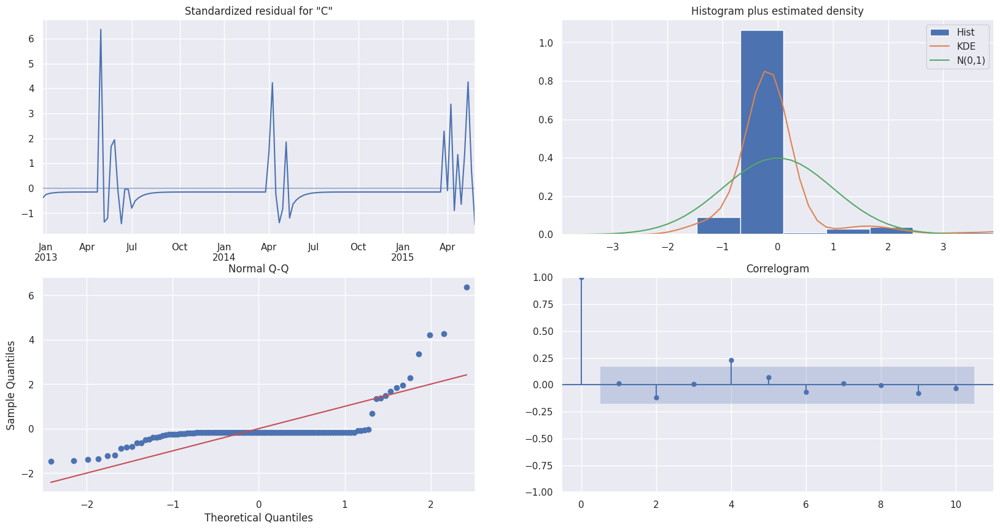

Results of Dickey-Fuller test: 

Test Statistic                -1.152173e+01
p-value                        4.024827e-21
#Lags Used                     0.000000e+00
Number of Observations Used    1.250000e+02
Critical Value (1%)           -3.483779e+00
Critical Value (5%)           -2.884954e+00
Critical Value (10%)          -2.579257e+00
dtype: float64
0.7025791310300744
0.45835457790527595
1.4947122150339616
0.3827019192433967
2.2360848150048205
Mean of RMSE after cross validation: 1.05


In [169]:
#Plotting Residuals 
res_ar.plot_diagnostics(figsize=(20,10))
plt.show()
#Run Dickey-Fuller Test
dftest = adfuller(residuals)
dfoutput = pd.Series(dftest[0:4], index=['Test Statistic',\
        'p-value', '#Lags Used', 'Number of Observations Used'])
for key,value in dftest[4].items():
    dfoutput['Critical Value (%s)'%key] = value
print ('Results of Dickey-Fuller test: \n')
print(dfoutput)
#Cross Validation
train_andrena_with_ind = train_andrena.reset_index()
cv=[]
for train_andrena_ind, val_ind in split.split(train_andrena_with_ind):
    #fitting on the train_andrena from the train_andrena-validation split
    ar = ARIMA(endog=train_andrena_with_ind.iloc[train_andrena_ind, -1], order=(2,0,1)).fit()
    #predicting on the validation part of the sample
    preds = ar.predict(typ='levels', start=val_ind[0], end=val_ind[-1])
    true = train_andrena_with_ind.iloc[val_ind, -1]
    cv.append(round(np.sqrt(mean_squared_error(true, preds)),2))
    #comparing validation and predictions on validation
    print(np.sqrt(mean_squared_error(true, preds)))
mean=round(np.mean(cv),2)
print(f'Mean of RMSE after cross validation: {mean}')

##### Hmmm...
Our model has slightly improved with a lower AIC and the lowest RSME as of yet. Our residuals are still stationary, and our distribution looks a little pointy but still Guassian.

Still, I wonder if we can do better. Let's do a grid search to find a combo with the lowest RSME we can, then we will run a summary and check the AIC again. 

##### Grid Search for best ARIMA hyperparameters

For this grid search, we will be using functions (thought tweaked for our use) from Jason Brownlees article "[How to Grid Search ARIMA Model Hyperparameters with Python](https://machinelearningmastery.com/grid-search-arima-hyperparameters-with-python/)."

In [170]:
# evaluate combinations of p, d and q values for an ARIMA model
def evaluate_models(dataset, p_values, d_values, q_values):
 #dataset = dataset.astype('float32')
 best_score, best_cfg = float("inf"), None
 for p in p_values:
  for d in d_values:
    for q in q_values:
      order = (p,d,q)
      try:
        model = ARIMA(dataset, order=order)
        model_fit = model.fit()
        y_hat = model_fit.predict(typ='levels')
        rmse = np.sqrt(mean_squared_error(train_andrena, y_hat))
        if rmse < best_score:
          best_score, best_cfg = rmse, order
        print('ARIMA%s RMSE=%.3f' % (order,rmse))
      except:
        continue
  print('Best ARIMA%s RMSE=%.3f' % (best_cfg, best_score))

In [171]:
# evaluate parameters
p_values = [0, 1, 2, 4, 6, 8, 10]
d_values = range(0, 3)
q_values = range(0, 3)
warnings.filterwarnings("ignore")
evaluate_models(train_andrena.values, p_values, d_values, q_values)

ARIMA(0, 0, 0) RMSE=1.374
ARIMA(0, 0, 1) RMSE=1.276
ARIMA(0, 0, 2) RMSE=1.261
ARIMA(0, 1, 0) RMSE=1.493
ARIMA(0, 1, 1) RMSE=1.248
ARIMA(0, 1, 2) RMSE=1.242
ARIMA(0, 2, 0) RMSE=2.438
ARIMA(0, 2, 1) RMSE=1.518
ARIMA(0, 2, 2) RMSE=1.272
Best ARIMA(0, 1, 2) RMSE=1.242
ARIMA(1, 0, 0) RMSE=1.254
ARIMA(1, 0, 1) RMSE=1.230
ARIMA(1, 0, 2) RMSE=1.226
ARIMA(1, 1, 0) RMSE=1.395
ARIMA(1, 1, 1) RMSE=1.245
ARIMA(1, 1, 2) RMSE=1.240
ARIMA(1, 2, 0) RMSE=2.000
ARIMA(1, 2, 1) RMSE=1.419
ARIMA(1, 2, 2) RMSE=1.270
Best ARIMA(1, 0, 2) RMSE=1.226
ARIMA(2, 0, 0) RMSE=1.250
ARIMA(2, 0, 1) RMSE=1.228
ARIMA(2, 0, 2) RMSE=1.223
ARIMA(2, 1, 0) RMSE=1.293
ARIMA(2, 1, 1) RMSE=1.222
ARIMA(2, 1, 2) RMSE=1.204
ARIMA(2, 2, 0) RMSE=1.806
ARIMA(2, 2, 1) RMSE=1.314
ARIMA(2, 2, 2) RMSE=1.242
Best ARIMA(2, 1, 2) RMSE=1.204
ARIMA(4, 0, 0) RMSE=1.180
ARIMA(4, 0, 1) RMSE=1.180
ARIMA(4, 0, 2) RMSE=1.177
ARIMA(4, 1, 0) RMSE=1.196
ARIMA(4, 1, 1) RMSE=1.194
ARIMA(4, 1, 2) RMSE=1.195
ARIMA(4, 2, 0) RMSE=1.398
ARIMA(4, 2, 1) RMSE=1.2

Looks like our best model parameters turned out the be (10, 0, 2) with an RMSE of 0.586. Let's run the model and check for it's AIC value.

##### Best ARIMA model

In [172]:
#Upping our order
mod_ar = ARIMA(train_andrena, order=(10,0,2))
# Fit
res_ar = mod_ar.fit()
# Print out model summary
print(res_ar.summary())

                               SARIMAX Results                                
Dep. Variable:                  Count   No. Observations:                  127
Model:                ARIMA(10, 0, 2)   Log Likelihood                -197.731
Date:                Wed, 05 Apr 2023   AIC                            423.463
Time:                        18:09:33   BIC                            463.281
Sample:                    12-31-2012   HQIC                           439.641
                         - 06-01-2015                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.3848      0.299      1.287      0.198      -0.201       0.971
ar.L1          0.8006      5.107      0.157      0.875      -9.208      10.809
ar.L2          0.2734      6.221      0.044      0.9

In [173]:
y_hat = res_ar.predict(typ='levels')
RMSE_ARIMA1 = np.sqrt(mean_squared_error(train_andrena, y_hat))
print(f'The RMSE for the ARIMA(2,0,1) model: {RMSE_ARIMA1}')
RMSE_AIC1 = res_ar.aic
print(f'The AIC for the ARIMA(2,0,1) model: {RMSE_AIC1}')

The RMSE for the ARIMA(2,0,1) model: 1.1437072250110207
The AIC for the ARIMA(2,0,1) model: 423.4628768284968


Interesting enough, our AIC only improved marginally from our previous model ARIMA(2, 0, 0). Still, this is our best model as of yet. Let's take a look at the diagnostics.

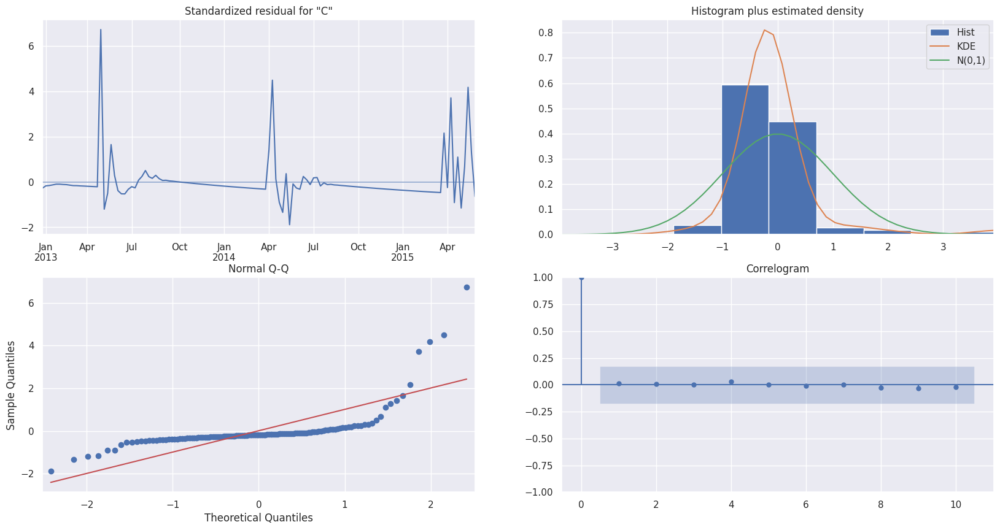

Results of Dickey-Fuller test: 

Test Statistic                -1.152173e+01
p-value                        4.024827e-21
#Lags Used                     0.000000e+00
Number of Observations Used    1.250000e+02
Critical Value (1%)           -3.483779e+00
Critical Value (5%)           -2.884954e+00
Critical Value (10%)          -2.579257e+00
dtype: float64
0.6156015190201637
0.5090942540775024
1.5162393831497871
0.4628580574322809
2.236300827622908
Mean of RMSE after cross validation: 1.07


In [174]:
#plotting residuals 
res_ar.plot_diagnostics(figsize=(20,10))
plt.show()
#Run Dickey-Fuller Test
dftest = adfuller(residuals)
dfoutput = pd.Series(dftest[0:4], index=['Test Statistic',\
        'p-value', '#Lags Used', 'Number of Observations Used'])
for key,value in dftest[4].items():
    dfoutput['Critical Value (%s)'%key] = value
print ('Results of Dickey-Fuller test: \n')
print(dfoutput)
#Cross Validation
train_andrena_with_ind = train_andrena.reset_index()
cv=[]
for train_andrena_ind, val_ind in split.split(train_andrena_with_ind):
    #fitting on the train_andrena from the train_andrena-validation split
    ar = ARIMA(endog=train_andrena_with_ind.iloc[train_andrena_ind, -1], order=(10, 0, 2)).fit()
    #predicting on the validation part of the sample
    preds = ar.predict(typ='levels', start=val_ind[0], end=val_ind[-1])
    true = train_andrena_with_ind.iloc[val_ind, -1]
    cv.append(round(np.sqrt(mean_squared_error(true, preds)),2))
    #comparing validation and predictions on validation
    print(np.sqrt(mean_squared_error(true, preds)))
mean=round(np.mean(cv),2)
print(f'Mean of RMSE after cross validation: {mean}')

Our RSME for our cross validation is .44, our residuals are still stationary, and while we have lower RSME, we have higher AIC than previous models. 

#### Model #3: SARIMAX<a id='rf'></a>

SARIMAX, or **S**easonal **A**uto-**R**egressive **I**ntegrated **M**oving **A**verage with e**X**ogenous factors, is an updated version of the ARIMA model but with 4 additional orders, but the first three are variations of the three orders of the ARIMA model with the fourth order being the length of the cycle being studied. Let's take a stab at it and see how it does. 

In [175]:
import statsmodels.api as sm
#Fitting the model
sarimax=sm.tsa.statespace.SARIMAX(train_andrena,order=(1, 0, 0),seasonal_order=(1,0,0,12))
sarimax_mo=sarimax.fit()
# Print out model summary
print(sarimax_mo.summary())
#Get that RSME!
y_hat = sarimax_mo.predict(typ='levels')
RMSE_ARIMA1 = np.sqrt(mean_squared_error(train_andrena, y_hat))
print(f'The RMSE for the SARIMAX(1,0,0)(1,0,0,12) model: {RMSE_ARIMA1}')

                                     SARIMAX Results                                      
Dep. Variable:                              Count   No. Observations:                  127
Model:             SARIMAX(1, 0, 0)x(1, 0, 0, 12)   Log Likelihood                -211.993
Date:                            Wed, 05 Apr 2023   AIC                            429.986
Time:                                    18:09:39   BIC                            438.519
Sample:                                12-31-2012   HQIC                           433.453
                                     - 06-01-2015                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4721      0.052      9.139      0.000       0.371       0.573
ar.S.L12    3.475e-06   5145.054   

Not bad, essentially the same as our first ARIMA model. Let's do a gridsearch to really kick things into gear. 

#### Gridsearch Optimization for SARIMAX Model <a id='gscv_rf'></a>

Originally I attempted to replicate our earlier gridesearch code, expanding it to suit our new SARIMAX needs, but ran into some issues. So we are going to borrow some code from [Tuning and Forecasting with (S)ARIMA Models](https://mins.space/blog/2020-09-14-tuning-forecasting-sarima-models/) on SARIMAX grid searches. 

##### Gridsearch Definitions and Functions

In [176]:
#import
from itertools import product
#define our orders
ps = range(0, 2)
qs = range(3, 6)

p = 0
d = 1 
q = 4

Ps = range(0, 2)
Qs = range(0, 3)

P = 0
D = 1 
Q = 1
s = 12

parameters = product(ps, qs, Ps, Qs)
parameters_list = list(parameters)
len(parameters_list)

36

In [177]:
def gs_arima(series, parameters_list, d, D, s, opt_method='powell'):
    """
        Return dataframe with parameters and corresponding AIC, and the best model according to AIC
        
        parameters_list - list with (p, q, P, Q) tuples
        d - integration order in ARIMA model
        D - seasonal integration order 
        s - length of season
    """
    
    results = []
    models = {}
    best_aic = float("inf")

    for param in parameters_list:
        # we need try-except because on some combinations model might fail to converge
        try:
            model = sm.tsa.statespace.SARIMAX(
                series, 
                order=(param[0], d, param[1]), 
                seasonal_order=(param[2], D, param[3], s)).fit(method=opt_method, disp=False)
        except:
            continue

        aic = model.aic
        if aic < best_aic:
            best_model = model
            best_aic = aic
            best_param = param
        results.append([param, model.aic])

    result_table = pd.DataFrame(results)
    result_table.columns = ['parameters', 'aic']
    result_table = result_table.sort_values(by='aic', ascending=True).reset_index(drop=True)
    
    return result_table, best_model

##### Gridsearch in Action

In [178]:
result_table, best_model = gs_arima(train_andrena, parameters_list, d, D, s)

In [179]:
result_table.head()

,parameters,aic
0,"(1, 5, 0, 1)",409.157204
1,"(0, 5, 0, 1)",409.886522
2,"(0, 3, 0, 1)",410.058949
3,"(0, 4, 0, 1)",410.087631
4,"(1, 5, 1, 1)",410.757773


In [180]:
# Print out model summary
print(best_model.summary())

                                      SARIMAX Results                                       
Dep. Variable:                                Count   No. Observations:                  127
Model:             SARIMAX(1, 1, 5)x(0, 1, [1], 12)   Log Likelihood                -196.579
Date:                              Wed, 05 Apr 2023   AIC                            409.157
Time:                                      18:11:37   BIC                            431.047
Sample:                                  12-31-2012   HQIC                           418.041
                                       - 06-01-2015                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6482      0.400      1.619      0.106      -0.137       1.433
ma.L1         -1.33

#### Best SARIMAX Model

In [181]:
#Fitting the model
sarimax=sm.tsa.statespace.SARIMAX(train_andrena,order=(0, 1, 3),seasonal_order=(0,1,0,12))
sarimax_mo=sarimax.fit()
# Print out model summary
print(sarimax_mo.summary())
#Get that RSME!
y_hat = sarimax_mo.predict(typ='levels')
RMSE_sarimax_mo = np.sqrt(mean_squared_error(train_andrena, y_hat))
print(f'The RMSE for the SARIMAX(0, 1, 5)(0,1,1,12) model: {RMSE_sarimax_mo}')

                                      SARIMAX Results                                      
Dep. Variable:                               Count   No. Observations:                  127
Model:             SARIMAX(0, 1, 3)x(0, 1, [], 12)   Log Likelihood                -220.954
Date:                             Wed, 05 Apr 2023   AIC                            449.907
Time:                                     18:11:37   BIC                            460.852
Sample:                                 12-31-2012   HQIC                           454.349
                                      - 06-01-2015                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.7053      0.108     -6.553      0.000      -0.916      -0.494
ma.L2         -0.1246      

With an AIC lower than any other model yet, I'd say we are on a good start. Let's take a look at the residuals for a moment.

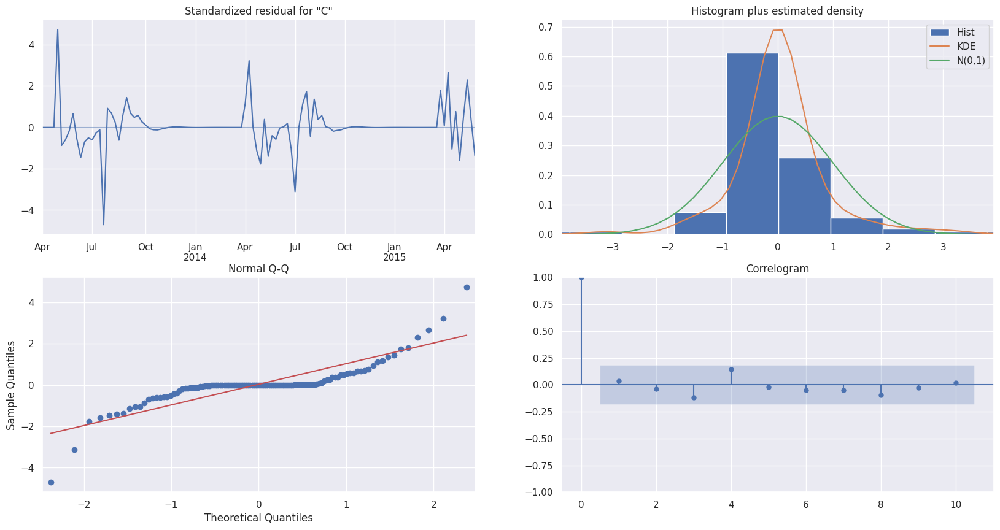

Results of Dickey-Fuller test: 

Test Statistic                  -5.562078
p-value                          0.000002
#Lags Used                      11.000000
Number of Observations Used    115.000000
Critical Value (1%)             -3.488535
Critical Value (5%)             -2.887020
Critical Value (10%)            -2.580360
dtype: float64


In [182]:
sarimax_mo.plot_diagnostics(figsize=(20, 10))
plt.show()
# Make a df of residuals
residuals = pd.DataFrame(sarimax_mo.resid)
residuals.dropna(inplace=True)
#Run Dickey-Fuller Test
dftest = adfuller(residuals)
dfoutput = pd.Series(dftest[0:4], index=['Test Statistic',\
        'p-value', '#Lags Used', 'Number of Observations Used'])
for key,value in dftest[4].items():
    dfoutput['Critical Value (%s)'%key] = value
print ('Results of Dickey-Fuller test: \n')
print(dfoutput)

***Cool!***

Our residuals look pretty noisy even with a few spikes, they are stationary (ala the DF test), and our distribution is pretty guassian, thought a little left tail heavy.

###### Cross Validation

In [183]:
train_andrena_with_ind = train_andrena.reset_index()
cv=[]
for train_andrena_ind, val_ind in split.split(train_andrena_with_ind):
    #fitting on the train_andrena from the train_andrena-validation split
    ar = SARIMAX(endog=train_andrena_with_ind.iloc[train_andrena_ind, -1],order=(0, 1, 3),seasonal_order=(0,1,0,12)).fit()
    #predicting on the validation part of the sample
    preds = ar.predict(typ='levels', start=val_ind[0], end=val_ind[-1])
    true = train_andrena_with_ind.iloc[val_ind, -1]
    cv.append(round(np.sqrt(mean_squared_error(true, preds)),2))
    #comparing validation and predictions on validation
    print(np.sqrt(mean_squared_error(true, preds)))

6.31720955291567
0.42254379054646074
1.592566220959232
0.7755406162630302
2.4018376290867125


In [184]:
mean=round(np.mean(cv),2)
print(f'Mean of RMSE after cross validation: {mean}')

Mean of RMSE after cross validation: 2.3


##### Predictions

Let's use the model to make some predictions and get a visual on what it can do.

In [185]:
#Fit the model
sari_mod_andrena =SARIMAX(train_andrena,
                  order=(0, 1, 3),
                  seasonal_order=(0, 1, 0, 12)).fit()

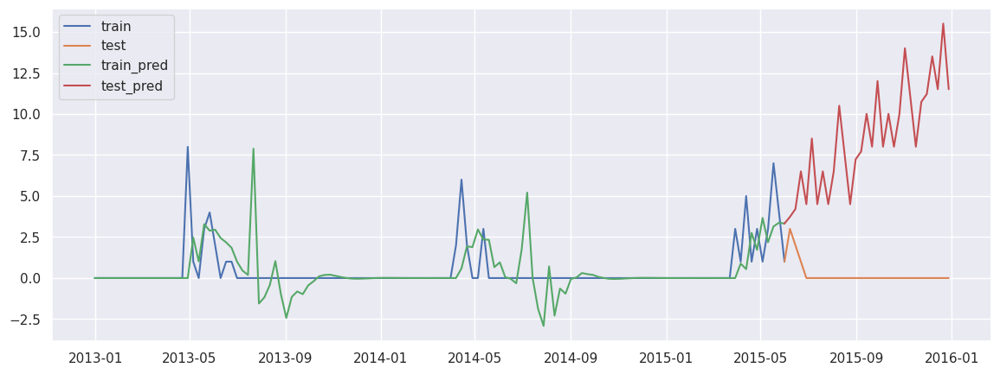

In [186]:
#Plot it!
y_hat_train_andrena = sari_mod_andrena.predict()
y_hat_test_andrena = sari_mod_andrena.predict(start=test_andrena.index[0], end=test_andrena.index[-1])

fig, ax = plt.subplots()
ax.plot(train_andrena, label='train')
ax.plot(test_andrena, label='test')
ax.plot(y_hat_train_andrena, label='train_pred')
ax.plot(y_hat_test_andrena, label='test_pred')

plt.legend();

Oh wow, that's... not great. It's showing the population is going to go on a constant bee boom all through the winter. Let's take a closer look.

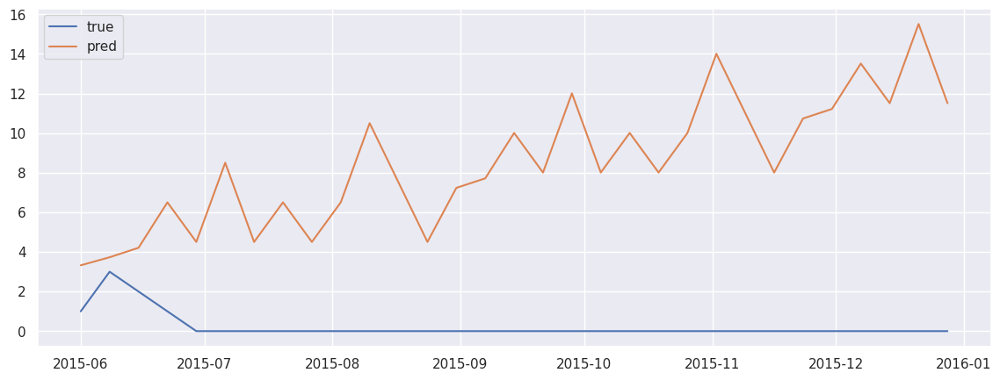

In [187]:
# Let's zoom in on test
fig, ax = plt.subplots()

ax.plot(test_andrena, label='true')
ax.plot(y_hat_test_andrena, label='pred')

plt.legend();

Oh dear, not good at all. 

#### Model #4:  Meta's Prophet<a id='proph'></a>

In [188]:
#rename some data - make a copy first, then rename
train_andrena_df = pd.DataFrame(train_andrena)
train_andrena_df['ds'] = train_andrena_df.index
data = train_andrena_df.rename(columns={'Count': 'y'})
#name that model!
model = ph()
#fit it!
pro_model = model.fit(data)


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp689kvv81/xmo_wzub.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp689kvv81/98fhnkvk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=43904', 'data', 'file=/tmp/tmp689kvv81/xmo_wzub.json', 'init=/tmp/tmp689kvv81/98fhnkvk.json', 'output', 'file=/tmp/tmp689kvv81/prophet_modelo2t0m0tv/prophet_model-20230405181141.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:11:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:11:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Make a dataframe to use for predicting the future. 

In [189]:
future_dates = model.make_future_dataframe(periods=60,freq='W')
future_dates.tail(10)

,ds
177,2016-05-22
178,2016-05-29
179,2016-06-05
180,2016-06-12
181,2016-06-19
182,2016-06-26
183,2016-07-03
184,2016-07-10
185,2016-07-17
186,2016-07-24


Make predictions, then do some math and put it all together.

In [190]:
future = model.predict(future_dates)

In [191]:
future[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(10)

,ds,yhat,yhat_lower,yhat_upper
177,2016-05-22,2.925049,1.633318,4.252680
178,2016-05-29,2.243914,0.938138,3.598801
179,2016-06-05,1.258689,-0.077500,2.623793
180,2016-06-12,0.604936,-0.672370,1.987631
181,2016-06-19,0.533410,-0.768463,1.907941
182,2016-06-26,0.732763,-0.536942,2.056388
183,2016-07-03,0.755384,-0.520992,2.081196
184,2016-07-10,0.510586,-0.808278,1.795894
185,2016-07-17,0.277260,-1.046746,1.461835
186,2016-07-24,0.298538,-0.927520,1.656143


Plot it to get a standard visual for the following season.

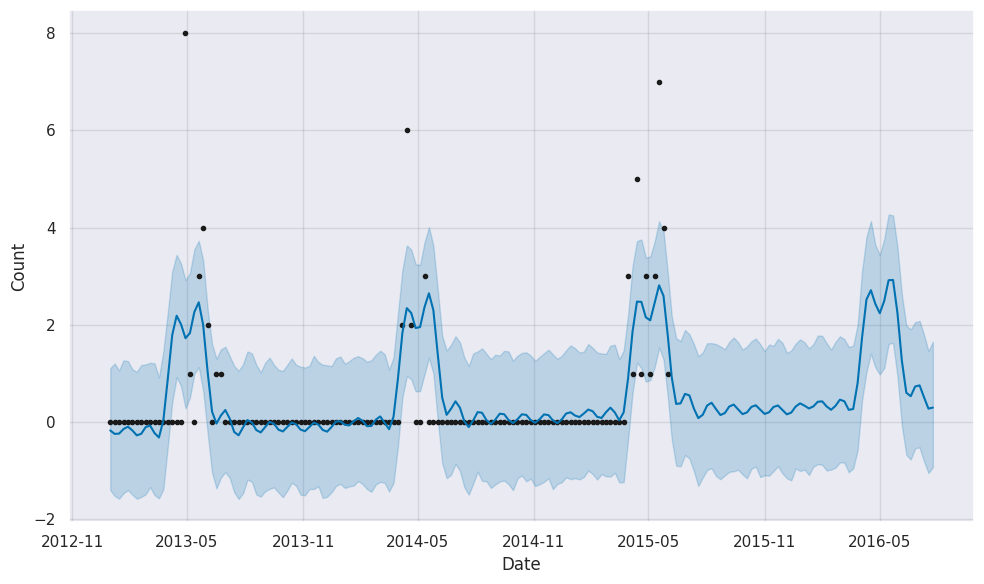

In [192]:
fig2 = model.plot(future, xlabel='Date', ylabel='Count')

But why stop there? Check it out with an interactive plot!

In [193]:
plot_plotly(model, future, xlabel='Date', ylabel='Count')

It looks really great and along the lines of what we would expect. Let's check out the RSME to compare to other models.

In [194]:
# calculate RMSE between expected and predicted values
y_true = data['y'].values
y_pred = future['yhat'][:127].values
rms = mean_squared_error(y_true, y_pred, squared=False)
print('RMSE: %.3f' % rms)

RMSE: 1.050


Not too shabby, this is pretty close to other RMSE's we've had (and still better than the naive model). Let's get a quick visual on how it looks comparing our actual value and predicted value.

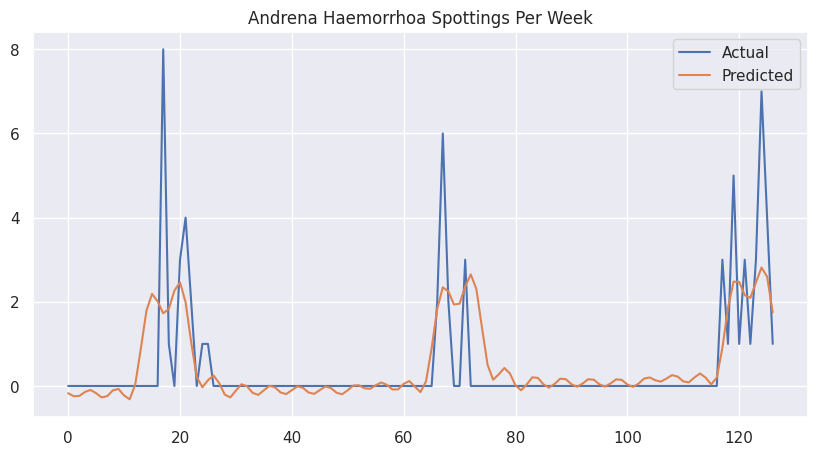

In [195]:
plt.figure(figsize=(10,5))
# plot expected vs actual
plt.plot(y_true, label='Actual')
plt.plot(y_pred, label='Predicted')
plt.title("Andrena Haemorrhoa Spottings Per Week")
plt.grid(True)
plt.legend()
plt.show()

#### Results
This model looks really 
promising, and seems to pick up on the pattern a bit better than out others. We can't check AIC since Prophet is Balaysian, and our RSME is a tad higher but still comparable to our past (ARIMA) models.

## 5. Final Model Selection<a id='final'></a>

### Bombus Muscorum: Meta Prophet

#### Why?
Even though this model scored a higher RSME than the ARIMA or SARIMAX models, it scored better than the naive model, and recognizes the seasonal trends better than our best SARIMAX model. 

#### Model/Prediction

Let's put it to work and see what kind of predictions it has in store.

In [196]:
#rename some data - make a copy first, then rename
train_df = pd.DataFrame(train)
train_df['ds'] = train_df.index
data = train_df.rename(columns={'Count': 'y'})
#name that model!
model = ph()
#fit it!
pro_model = model.fit(data)


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp689kvv81/xisgohgz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp689kvv81/mi5u3xeu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=47356', 'data', 'file=/tmp/tmp689kvv81/xisgohgz.json', 'init=/tmp/tmp689kvv81/mi5u3xeu.json', 'output', 'file=/tmp/tmp689kvv81/prophet_modeltkui7bds/prophet_model-20230405181142.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:11:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:11:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Make some future dates in a dataframe!

Use those futures dates and put them through the model to make some actual predictions.

In [197]:
future_dates = model.make_future_dataframe(periods=80,freq='W')
future = model.predict(future_dates)

And now we plot it!

In [198]:
plot_plotly(model, future, ylabel=("Count"), xlabel=("Date"))

It looks like the model is predicting a lowering population. This is very troubling, but good to know. 

### Apis Melliferas Melliferas: Meta Prophet

#### Why?
Meta Prophet was able to not only see the seasonality really well where the ARIMA and SARIMAX models could not, but it scored an RSME of about half of the naive model, and was pretty close to the RSME values of our ARIMA and SARIMAX models. The model still has a hard time with the idea of winter being a time when there are no bees out, but overall it performs well.

In [199]:
#rename some data - make a copy first, then rename
train_apis_df = pd.DataFrame(train_apis)
train_apis_df['ds'] = train_apis_df.index
data = train_apis_df.rename(columns={'Count': 'y'})
#name that model!
model = ph()
#fit it!
pro_model = model.fit(data)


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp689kvv81/f699gpbp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp689kvv81/rs6lk7qc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=21721', 'data', 'file=/tmp/tmp689kvv81/f699gpbp.json', 'init=/tmp/tmp689kvv81/rs6lk7qc.json', 'output', 'file=/tmp/tmp689kvv81/prophet_model0wt8avrm/prophet_model-20230405181143.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:11:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:11:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Like before, let's make a df of future dates, then run them through the model to get a prediction. 

In [200]:
future_dates = model.make_future_dataframe(periods=60,freq='W')
future = model.predict(future_dates)

In [201]:
future[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(10)

,ds,yhat,yhat_lower,yhat_upper
176,2016-05-22,1.708951,-0.806542,4.235494
177,2016-05-29,1.235404,-1.282953,3.786389
178,2016-06-05,1.037382,-1.356552,3.696685
179,2016-06-12,1.422066,-1.046292,3.847853
180,2016-06-19,1.852027,-0.693820,4.419591
181,2016-06-26,1.727684,-0.676891,4.021710
182,2016-07-03,1.166198,-1.301282,3.537699
183,2016-07-10,0.783745,-1.735550,3.282523
184,2016-07-17,0.839490,-1.620680,3.233985
185,2016-07-24,0.917594,-1.523987,3.444404


In [202]:
plot_plotly(model, future, xlabel="Date", ylabel="Count")

#### Results
This model predicts an overall modest population increase. 

### Andrena Haemorrhoa: Meta Prophet

#### Why?


This model may have a higher RSME than our ARIMA and SARIMAX models, but it has a lower RSME than the naive model, and does a much better job checking the seasonality of the data than either ARIMA or SARIMAX. 

#### Model/Prediction

In [203]:
#rename some data - make a copy first, then rename
train_andrena_df = pd.DataFrame(train_andrena)
train_andrena_df['ds'] = train_andrena_df.index
data = train_andrena_df.rename(columns={'Count': 'y'})
#name that model!
model = ph()
#fit it!
pro_model = model.fit(data)


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp689kvv81/9xw3pfpm.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp689kvv81/8xvbn5ut.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=82428', 'data', 'file=/tmp/tmp689kvv81/9xw3pfpm.json', 'init=/tmp/tmp689kvv81/8xvbn5ut.json', 'output', 'file=/tmp/tmp689kvv81/prophet_modelck3j6m14/prophet_model-20230405181143.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:11:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:11:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Make a dataframe to use for predicting the future. 

In [204]:
future_dates = model.make_future_dataframe(periods=60,freq='W')
future = model.predict(future_dates)

Let's see it in action!

In [205]:
plot_plotly(model, future, xlabel='Date', ylabel='Count')

#### Results
This model predicts a slight increase in Andrena bees, which is great news for the bees (and us).  

## 6. Business Recommendation:<a id='business'></a>

###**Basic Use Function**
With these models, we can make a base estimate for what to expect in the near future for a few specific species of bees.


###**Recommendations**

When conducting newer surveys, you will be able to compare it to the predicted sightings of each species. 

Should newer surveying result in a **higher** count than predicted or within the range predicted, I would reccommend the following:

* Conduct further analysis to see if various outside factors can account for the growth. See if population locations shifted/remained constant, if surveying efforts have changed or been expanded, and cross reference any past efforts (if any) had been made in relation to conservation.

Should newer surveying result in a **lower** count than predicted, I would reccommend the following:

### For Bombus Muscorum:

* Since this species is often found in urban areas, effort can be taken to increase the population of flowering plants within public spaces. On a private citizen level, the public could be encouraged to suppliment their gardens, window boxes, and green spaces with flowering plants.

* If there are sightings nearby each other, efforts should focused in the space between the two sightings to encourage connection.
When designing new urban spaces, care should be exhibited when developing the land as not to disturb any ground cavities that could host a nest.

### For Apis mellifera mellifera:

* Being a special case in that these bees can be both wild and kept for honey production and pollination, there should be more efforts put into expanding the Native Irish Honey Bee Society and their prospective projects to promote native beekeeping, breeding and producing strong colonies, and monitoring the health of the population, as well as spread awareness.
* When it comes to suspected wild mellifera sightings, if there are sightings relatively nearby each other, efforts should focused in the space between the two sightings to encourage connection.

### For Andrena :

* Plant more flowering spring plants along the short grass swards, especially along roads, trails, and trackways.

### For all species:
A common problem with the publics perception of bees is that they all sting and are dangerous, and they are often confused with other stinging bugs.

Public awareness campaigns should help educated the public on the varieties of bees in their locality and region, their needs, and their benefits. Raising awareness and giving a call to action to help make a more hospitible and symbiotic environment will help connect people who want to help with the know-how to do so.

In addtion, this public awareness might spur more citizens to join efforts in future surveys, especially if they know what they are seeing is important.

Lastly, more widespread efforts should be taken to create a more hospitible environment for wild bees that rely on pollen by rewilding underutilized or unused pastures, farmlands, and roadway shoulders with a focus on native plants attractive to most bees and plants attractive to specific species.

####Variances:
I would additionally like to recommend to the stakeholders ways that could improve the data collection process.

I would recommend having a set database of volunteers and encourage them to explore certain areas that may or may not have bees, rather than places that are known bee-friendly spots, to account for species movement and population. 

To help combat these problems, I would recommend ecouraging volunteers with flexible schdules to go out when there 


## 7. Going further<a id='further'></a>

I would love to explore more into the locations that these sightings occured, and compare it to the species spotted and known characteristics that the species needs. I could see if any recent changes have happened that would affect the population (construction, local weather events, etc). 

As we know, there is a huge difference between studying an organism in a contained environment, and a tiny one out flying about, so a few more things are needed to be considered when conducting surveys out in the feild like this.

Because of this, I would like to delve more into the process used to gather information on sightings both from this survey and current ones - from the actual process to evaluate a sighting, to the infrastructure of people involved, and their habits and involvement in the process. From that information, I would like to create a methodical plan to best coordinate volunteer efforts to ensure we are spreading out evenly enough to cover enough ground and avoid pitfalls such as volunteers being in close proximity of time and space when out spotting, or frequenting the same space repeatedly. 

When it comes to working with the data itself, I would love to refine our Meta Prophet models more, and explore other models to see how they compare. 

**Lastly, thank you for taking the time to read through this, and I hope it helped inform and awaken your curiosity!**